**`BEGIN`**

# **Install Dependencies**

In [ ]:
!pip install pandas numpy matplotlib seaborn scikit-learn imbalanced-learn xgboost lightgbm shap folium geopandas statsmodels scikit-posthocs kmodes rapidfuzz

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.2/3.2 MB 26.0 MB/s eta 0:00:00


# **Libraries**

In [ ]:
# Data manipulation
import pandas as pd
import numpy as np
from collections import Counter

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
from datetime import datetime


# Stats
from scipy import stats
from scipy.stats import chi2_contingency
from statsmodels.stats.proportion import proportions_ztest
from statsmodels.stats.outliers_influence import variance_inflation_factor
import scikit_posthocs as sp
import statsmodels.api as sm
import math

# Preparation &  Models
from sklearn.preprocessing import StandardScaler, OneHotEncoder,LabelEncoder
from sklearn.model_selection import train_test_split, StratifiedKFold, cross_val_score, GridSearchCV
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, roc_curve, auc, silhouette_score
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, classification_report, precision_recall_curve
from sklearn.compose import ColumnTransformer
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from rapidfuzz import process, fuzz
import csv

# Imbalanced classes handling
from imblearn.over_sampling import SMOTE

# Model interpretability
import shap

# Clustering
from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering
from kmodes.kprototypes import KPrototypes
from sklearn.decomposition import PCA
from sklearn.neighbors import NearestNeighbors

# Geospatial
import geopandas as gpd
from shapely.geometry import Point
from folium.plugins import HeatMap
from branca.colormap import linear
import folium

# Model
import joblib

# Ignore warnings for readability
import warnings
warnings.filterwarnings("ignore")
import warnings
warnings.filterwarnings("ignore", category=UserWarning)

# Display Model
import ipywidgets as widgets
from IPython.display import display, clear_output

# **Load data & Integrate**

* **Load inactive & active data & merge**

In [ ]:
# =======================================
# Load active and inactive datasets
# =======================================

# Columns to parse as dates
date_cols = ['date_account_creation', 'date_cert_expiration', 'date_cert_effective', 'date_business_start']

# Load CSVs without parsing dates initially
active_df = pd.read_csv("sd_businesses_active_datasd.csv", low_memory=False)
inactive_df = pd.read_csv("sd_businesses_inactive_2015tocurr_datasd.csv", low_memory=False)

# Convert date columns to datetime safely
for col in date_cols:
    active_df[col] = pd.to_datetime(active_df[col], errors='coerce')
    inactive_df[col] = pd.to_datetime(inactive_df[col], errors='coerce')

# Optional: check dtypes
print(active_df[date_cols].dtypes)
print(inactive_df[date_cols].dtypes)


# =======================================
# Standardize relevant categorical variables
# =======================================

for df_temp in [active_df, inactive_df]:
    df_temp['ownership_type'] = df_temp['ownership_type'].str.upper().str.strip()
    df_temp['naics_description'] = df_temp['naics_description'].str.upper().str.strip()
    df_temp['account_status'] = df_temp['account_status'].str.upper().str.strip()
    df_temp['address_state'] = df_temp['address_state'].str.upper().str.strip()
    df_temp['address_city'] = df_temp['address_city'].str.upper().str.strip()

# =======================================
# Combine active and inactive datasets
# =======================================
business_df = pd.concat([active_df, inactive_df], ignore_index=True)

# Check for missing values
missing_business_df = business_df.isnull().sum().sort_values(ascending=False)
missing_percent_business_df = (missing_business_df / len(business_df) * 100).round(2)
pd.DataFrame({'Missing': missing_business_df, 'Percent': missing_percent_business_df})




date_account_creation    datetime64[ns]
date_cert_expiration     datetime64[ns]
date_cert_effective      datetime64[ns]
date_business_start      datetime64[ns]
dtype: object
date_account_creation    datetime64[ns]
date_cert_expiration     datetime64[ns]
date_cert_effective      datetime64[ns]
date_business_start      datetime64[ns]
dtype: object


,Missing,Percent
address_pmb_box,157986,99.77
address_no_fraction,157437,99.42
address_po_box,155003,97.89
address_pd,148638,93.87
bid,139858,88.32
address_suite,90313,57.03
council_district,53398,33.72
address_sfx,17276,10.91
lng,3501,2.21
lat,3501,2.21


In [ ]:
# Check missing dates
print("Rows with valid date_business_start:", business_df['date_business_start'].notna().sum())
print("Rows with missing/invalid date_business_start:", business_df['date_business_start'].isna().sum())


Rows with valid date_business_start: 158330
Rows with missing/invalid date_business_start: 19


In [ ]:
# Drop missing values
business_df = business_df[business_df['date_business_start'].notna()]


In [ ]:
# Business df info
business_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 158330 entries, 0 to 158348
Data columns (total 27 columns):
 #   Column                 Non-Null Count   Dtype         
---  ------                 --------------   -----         
 0   account_key            158330 non-null  int64         
 1   account_status         158330 non-null  object        
 2   date_account_creation  158330 non-null  datetime64[ns]
 3   date_cert_expiration   158328 non-null  datetime64[ns]
 4   date_cert_effective    158329 non-null  datetime64[ns]
 5   business_owner_name    158329 non-null  object        
 6   ownership_type         158330 non-null  object        
 7   date_business_start    158330 non-null  datetime64[ns]
 8   dba_name               158330 non-null  object        
 9   naics_sector           158330 non-null  int64         
 10  naics_code             158330 non-null  int64         
 11  naics_description      158330 non-null  object        
 12  address_no             154964 non-null  object   

In [ ]:
# Count the number of businesses per status
status_counts = business_df['account_status'].value_counts()

print(status_counts)


account_status
CANCELLED    96939
ACTIVE       57899
PENDING       3492
Name: count, dtype: int64


*  **Check Businesses that renewed certificate so we reclassify them as ACTIVE**

In [ ]:
# Set today date
today = pd.Timestamp.today()

def final_status(row):
    exp = row['date_cert_expiration']
    status = row['account_status']

    # If expiration date is missing → keep original
    if pd.isna(exp):
        return status

    # If expiration is in the future or today → possible renewal
    if exp >= today:
        if status in ['PENDING', 'CANCELLED']:
            return 'ACTIVE'       # renewed → ACTIVE
        else:
            return 'ACTIVE'       # ACTIVE stays ACTIVE

    # If expiration is in the past
    else:
        if status == 'CANCELLED':
            return 'CANCELLED'
        if status == 'PENDING':
            return 'PENDING'
        if status == 'ACTIVE':
            return 'ACTIVE'

    # fallback (should not happen)
    return status


business_df['status'] = business_df.apply(final_status, axis=1)



In [ ]:
# Count the number of businesses per status
status_counts_after = business_df['status'].value_counts()

print(status_counts_after)

status
CANCELLED    91394
ACTIVE       66935
PENDING          1
Name: count, dtype: int64


**NOTE:**
*   All CANCELLED businesses in the dataset are truly never renewed.
*   All PENDING businesses remain pending — none have become ACTIVE.



* **Remove duplicates if any & drop irrelevant columns**

In [ ]:
# =======================================
# Remove Duplicates
# =======================================

# Numbers of rows
print("Original Number of Rows")
print(len(business_df))

# Remove duplicate records based on account_key
business_df= business_df.drop_duplicates(subset=['account_key']).reset_index(drop=True)
print("Number of Rows after Removal")
print(len(business_df))

# =======================================
# Drop irrelevant variables
# =======================================

drop_cols = ['account_key','business_owner_name', 'dba_name','address_no','address_pd','address_road',
             'address_sfx','address_no_fraction','address_suite', 'address_pmb_box', 'address_po_box', 'bid', 'council_district',
             'date_cert_expiration', 'date_cert_effective']
business_df.drop(columns=[c for c in drop_cols if c in business_df.columns], inplace=True)

# Account status count
business_df['status'].value_counts()




Original Number of Rows
158330
Number of Rows after Removal
158330


,count
status,
CANCELLED,91394
ACTIVE,66935
PENDING,1


* **Drop pending businesses**

In [ ]:
# Drop businesses with status PENDING or INVALID
business_df = business_df[~business_df['status'].isin(['PENDING'])].copy()

# Check Counts
business_df['status'].value_counts()

,count
status,
CANCELLED,91394
ACTIVE,66935


*  **Check DF missing values**

In [ ]:
# Check for missing values after drop
missing_business_df = business_df.isnull().sum().sort_values(ascending=False)
missing_percent_business_df = (missing_business_df / len(business_df) * 100).round(2)
pd.DataFrame({'Missing': missing_business_df, 'Percent': missing_percent_business_df})

,Missing,Percent
lng,3500,2.21
lat,3500,2.21
address_city,1,0.00
date_account_creation,0,0.00
account_status,0,0.00
naics_sector,0,0.00
date_business_start,0,0.00
ownership_type,0,0.00
naics_code,0,0.00
address_state,0,0.00


* **Prepare for handling missing values**

In [ ]:
# =======================================
# Show full distribution of address_city as-is
# =======================================

# Get counts of each city
city_counts = business_df['address_city'].str.upper().value_counts(dropna=False)

# Convert to a DataFrame
city_counts = city_counts.reset_index()
city_counts.columns = ['city', 'Count']

# Display the full list
pd.set_option('display.max_rows', None)
print(city_counts)
print("Number of rows")
print(len(business_df))

                            city   Count
0                      SAN DIEGO  124978
1                       LA JOLLA    3508
2                    CHULA VISTA    2829
3                       EL CAJON    2093
4                     SAN YSIDRO    1522
5                  SPRING VALLEY    1506
6                        LA MESA    1231
7                      ESCONDIDO    1219
8                  NATIONAL CITY     926
9                         SANTEE     702
10                         POWAY     694
11                      CARLSBAD     651
12                     OCEANSIDE     618
13                   LEMON GROVE     575
14                      LAKESIDE     568
15                    SAN MARCOS     535
16                         VISTA     507
17                       DEL MAR     447
18                     ENCINITAS     429
19                        RAMONA     359
20                        BONITA     306
21                IMPERIAL BEACH     278
22                   LOS ANGELES     272
23              

* **Handle missing values in DF and filtering using shapefiles**

In [ ]:
print("Number of rows before Layers")
print(len(business_df))

Number of rows before Layers
158329


In [ ]:
# =======================================
# Impute the single missing value with the mode 'SAN DIEGO'
# =======================================
business_df['address_city'].fillna('SAN DIEGO', inplace=True)

# =======================================
# Drop missing or invalid values
# =======================================
business_df = business_df.dropna(subset=['lat', 'lng'])

# Keep only realistic SD County bounding coordinates
business_df = business_df[
    (business_df['lat'].between(32.5, 33.5)) &
    (business_df['lng'].between(-117.5, -116.0))
]

# Convert to GeoDataFrame with point geometry
gdf = gpd.GeoDataFrame(
    business_df,
    geometry=gpd.points_from_xy(business_df['lng'], business_df['lat']),
    crs="EPSG:4326"
)

# =======================================
# LAYER 1 — Filter to San Diego County
# =======================================
county_shp = gpd.read_file("zip://cb_2022_us_county_500k.zip")

sd_county = county_shp[
    (county_shp['STATEFP'] == '06') &
    (county_shp['COUNTYFP'] == '073')
]

gdf_sd = gpd.sjoin(gdf, sd_county, predicate='within', how='inner')

# Drop join artifacts so they don't conflict with layer 2
gdf_sd = gdf_sd.drop(columns=[col for col in gdf_sd.columns if col.startswith("index_")], errors='ignore')

# =======================================
# LAYER 2 — Assign ZCTA (ZIP Code)
# =======================================
zcta = gpd.read_file("zip://cb_2020_us_zcta520_500k.zip")

zcta = zcta.to_crs(gdf_sd.crs)

gdf_zcta = gpd.sjoin(
    gdf_sd,
    zcta[['ZCTA5CE20', 'geometry']],
    predicate='within',
    how='left'
)

# Drop any new join artifacts
gdf_zcta = gdf_zcta.drop(columns=[col for col in gdf_zcta.columns if col.startswith("index_")], errors='ignore')

# Rename ZIP column to zip5
gdf_zcta = gdf_zcta.rename(columns={'ZCTA5CE20': 'zip5'})

# Ensure zip5 is a 5-character string
gdf_zcta['zip5'] = gdf_zcta['zip5'].astype(str).str.zfill(5).str.strip()

# KEEP ONLY BUSINESSES THAT HAVE A ZIP (TO merge with Census ZIP population )
gdf_zcta = gdf_zcta.dropna(subset=['zip5'])

# =======================================
# Final dataframe
# =======================================
df = pd.DataFrame(gdf_zcta.drop(columns='geometry'))

print("Final DF shape:", df.shape)
print("ZIP column name:", df['zip5'].name)

df.info()


Final DF shape: (145519, 26)
ZIP column name: zip5
<class 'pandas.core.frame.DataFrame'>
Index: 145519 entries, 0 to 156523
Data columns (total 26 columns):
 #   Column                 Non-Null Count   Dtype         
---  ------                 --------------   -----         
 0   account_status         145519 non-null  object        
 1   date_account_creation  145519 non-null  datetime64[ns]
 2   ownership_type         145519 non-null  object        
 3   date_business_start    145519 non-null  datetime64[ns]
 4   naics_sector           145519 non-null  int64         
 5   naics_code             145519 non-null  int64         
 6   naics_description      145519 non-null  object        
 7   address_city           145519 non-null  object        
 8   address_state          145519 non-null  object        
 9   address_zip            145519 non-null  object        
 10  lat                    145519 non-null  float64       
 11  lng                    145519 non-null  float64       
 12

*  **Keep relevant columns for analysis**

In [ ]:
cols_to_keep = [
    'status','account_status', 'ownership_type', 'date_business_start', 'naics_sector', 'naics_code',
    'naics_description', 'address_city', 'address_state','lat', 'lng', 'zip5'
]

df = df[cols_to_keep].copy()
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 145519 entries, 0 to 156523
Data columns (total 12 columns):
 #   Column               Non-Null Count   Dtype         
---  ------               --------------   -----         
 0   status               145519 non-null  object        
 1   account_status       145519 non-null  object        
 2   ownership_type       145519 non-null  object        
 3   date_business_start  145519 non-null  datetime64[ns]
 4   naics_sector         145519 non-null  int64         
 5   naics_code           145519 non-null  int64         
 6   naics_description    145519 non-null  object        
 7   address_city         145519 non-null  object        
 8   address_state        145519 non-null  object        
 9   lat                  145519 non-null  float64       
 10  lng                  145519 non-null  float64       
 11  zip5                 145519 non-null  object        
dtypes: datetime64[ns](1), float64(2), int64(2), object(7)
memory usage: 14.4+ MB


#  **Upload 2020 Census datset & Merge with DF by Zip**

In [ ]:
# =======================================
# Load 2020 Census population
# =======================================
census_df = pd.read_csv(
    "2020_Census_Population_by_ZIP_Code_20251109.csv",
    low_memory=False, thousands=','   # <-- tells pandas to remove commas
    )

# =======================================
# Aggregate population by ZIP
# =======================================
# Sum all population entries for the same ZIP
census_agg = census_df.groupby('zip', as_index=False)['population'].sum()

# Convert ZIP to string to match DF dataset
census_agg['zip'] = census_agg['zip'].astype(str).str.zfill(5)
df['zip5'] = df['zip5'].astype(str).str.zfill(5)

# =======================================
# Merge with DF dataset
# =======================================
# 'zip5' in DF matches 'zip' in Census
df = df.merge(census_agg, left_on='zip5', right_on='zip', how='left')

# Drop duplicate 'zip' column after merge
df = df.drop(columns=['zip'])

# =======================================
# Check result
# =======================================
print("Merged DF shape:", df.shape)
print(df[['zip5', 'population']].head())

Merged DF shape: (145519, 13)
    zip5  population
0  92123     30939.0
1  92020     61798.0
2  92123     30939.0
3  92131     36332.0
4  92108     22762.0


In [ ]:
# Check missing ZIPs
missing_pop_zips = df[df['population'].isna()]['zip5'].unique()
print("ZIPs with missing population:", missing_pop_zips)


ZIPs with missing population: ['00nan' '92092' '92132' '92147']


In [ ]:
# =======================================
# Handle ZIPs with missing population
# =======================================

# Define ZIPs
invalid_zip = '00nan'
real_missing_pop_zips = ['92092', '92132', '92147']

# Check how many rows would be affected
rows_invalid = df[df['zip5'] == invalid_zip].shape[0]
rows_missing_pop = df[df['zip5'].isin(real_missing_pop_zips)].shape[0]
print(f"Rows with invalid ZIP ('{invalid_zip}'): {rows_invalid}")
print(f"Rows with missing population (real ZIPs): {rows_missing_pop}")

# Drop invalid ZIP
df = df[df['zip5'] != invalid_zip].reset_index(drop=True)

# Assign zero population to real missing ZIPs
df.loc[df['zip5'].isin(real_missing_pop_zips), 'population'] = 0

# =======================================
# Explanation
# =======================================
explanation = f"""
The following ZIP codes were handled due to missing population:

- Dropped invalid ZIP: {invalid_zip}
- Assigned population = 0 to real San Diego County ZIPs: {', '.join(real_missing_pop_zips)}

This ensures that only invalid ZIPs are removed while keeping legitimate ZIPs for analysis.
"""
print(explanation)


Rows with invalid ZIP ('00nan'): 12
Rows with missing population (real ZIPs): 21

The following ZIP codes were handled due to missing population:

- Dropped invalid ZIP: 00nan
- Assigned population = 0 to real San Diego County ZIPs: 92092, 92132, 92147

This ensures that only invalid ZIPs are removed while keeping legitimate ZIPs for analysis.



In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145507 entries, 0 to 145506
Data columns (total 13 columns):
 #   Column               Non-Null Count   Dtype         
---  ------               --------------   -----         
 0   status               145507 non-null  object        
 1   account_status       145507 non-null  object        
 2   ownership_type       145507 non-null  object        
 3   date_business_start  145507 non-null  datetime64[ns]
 4   naics_sector         145507 non-null  int64         
 5   naics_code           145507 non-null  int64         
 6   naics_description    145507 non-null  object        
 7   address_city         145507 non-null  object        
 8   address_state        145507 non-null  object        
 9   lat                  145507 non-null  float64       
 10  lng                  145507 non-null  float64       
 11  zip5                 145507 non-null  object        
 12  population           145507 non-null  float64       
dtypes: datetime64[

In [ ]:
# Check for unique zips
print(df['zip5'].nunique())
print(df['zip5'].sort_values().unique())

109
['91901' '91902' '91905' '91906' '91910' '91911' '91913' '91914' '91915'
 '91916' '91917' '91931' '91932' '91934' '91935' '91941' '91942' '91945'
 '91948' '91950' '91962' '91963' '91977' '91978' '91980' '92003' '92004'
 '92007' '92008' '92009' '92010' '92011' '92014' '92019' '92020' '92021'
 '92024' '92025' '92026' '92027' '92028' '92029' '92036' '92037' '92040'
 '92054' '92056' '92057' '92058' '92059' '92061' '92064' '92065' '92066'
 '92067' '92069' '92070' '92071' '92075' '92078' '92081' '92082' '92083'
 '92084' '92086' '92091' '92092' '92093' '92101' '92102' '92103' '92104'
 '92105' '92106' '92107' '92108' '92109' '92110' '92111' '92113' '92114'
 '92115' '92116' '92117' '92118' '92119' '92120' '92121' '92122' '92123'
 '92124' '92126' '92127' '92128' '92129' '92130' '92131' '92132' '92134'
 '92136' '92139' '92140' '92145' '92147' '92154' '92155' '92161' '92173'
 '92182']


In [ ]:
# =======================================
# Final Filter
# =======================================

sd_zips = [
    '91901', '91902', '91905', '91906', '91910', '91911', '91913', '91914', '91915',
    '91916', '91917', '91931', '91932', '91934', '91935', '91941', '91942', '91945',
    '91948', '91950', '91962', '91963', '91977', '91978', '91980', '92003', '92004',
    '92007', '92008', '92009', '92010', '92011', '92014', '92019', '92020', '92021',
    '92024', '92025', '92026', '92027', '92028', '92029', '92036', '92037', '92040',
    '92054', '92056', '92057', '92058', '92059', '92061', '92064', '92065', '92066',
    '92067', '92069', '92070', '92071', '92075', '92078', '92081', '92082', '92083',
    '92084', '92086', '92091', '92092', '92093', '92101', '92102', '92103', '92104',
    '92105', '92106', '92107', '92108', '92109', '92110', '92111', '92113', '92114',
    '92115', '92116', '92117', '92118', '92119', '92120', '92121', '92122', '92123',
    '92124', '92126', '92127', '92128', '92129', '92130', '92131', '92132', '92134',
    '92136', '92139', '92140', '92145', '92147', '92154', '92155', '92161', '92173',
    '92182'
]

df = df[df['zip5'].isin(sd_zips)].copy()
print("Final DF shape:", df.shape)

Final DF shape: (145507, 13)


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145507 entries, 0 to 145506
Data columns (total 13 columns):
 #   Column               Non-Null Count   Dtype         
---  ------               --------------   -----         
 0   status               145507 non-null  object        
 1   account_status       145507 non-null  object        
 2   ownership_type       145507 non-null  object        
 3   date_business_start  145507 non-null  datetime64[ns]
 4   naics_sector         145507 non-null  int64         
 5   naics_code           145507 non-null  int64         
 6   naics_description    145507 non-null  object        
 7   address_city         145507 non-null  object        
 8   address_state        145507 non-null  object        
 9   lat                  145507 non-null  float64       
 10  lng                  145507 non-null  float64       
 11  zip5                 145507 non-null  object        
 12  population           145507 non-null  float64       
dtypes: datetime64[

# **Inspect final DF**

In [ ]:
# Check for missing values in final DF
missing = df.isnull().sum().sort_values(ascending=False)
missing_percent = (missing / len(df) * 100).round(2)
pd.DataFrame({'Missing': missing, 'Percent': missing_percent})


,Missing,Percent
status,0,0.0
account_status,0,0.0
ownership_type,0,0.0
date_business_start,0,0.0
naics_sector,0,0.0
naics_code,0,0.0
naics_description,0,0.0
address_city,0,0.0
address_state,0,0.0
lat,0,0.0


 * **Check categories in response variable**

In [ ]:
# Status count
df['status'].value_counts()

,count
status,
CANCELLED,85123
ACTIVE,60384


*  **Check possible inconcistencies in address_city**

In [ ]:
# Count businesses per city
city_counts = df['address_city'].value_counts()

# Convert to DataFrame
city_counts_df = city_counts.reset_index()
city_counts_df.columns = ['city', 'Count']

# Sort alphabetically by city
city_counts_df = city_counts_df.sort_values(by='city').reset_index(drop=True)

# Show all rows
pd.set_option('display.max_rows', None)
print(city_counts_df)


                     city   Count
0                              46
1                 ADDISON       1
2                ALHAMBRA       2
3                  ALPINE     194
4                 ANAHEIM       6
5                 ARCADIA       1
6                 ATLANTA       1
7             BAKERSFIELD       2
8            BALDWIN PARK       1
9              BELLFLOWER       4
10             BOCA RATON       1
11                  BOISE       1
12                 BONITA     289
13                BONSALL      28
14        BORREGO SPRINGS       9
15              BOULEVARD      14
16                   BREA       2
17                BURBANK       1
18              CAMARILLO       1
19                  CAMPO      38
20            CANYON LAKE       2
21                CARDIFF      14
22     CARDIFF BY THE SEA      72
23     CARDIFF-BY-THE-SEA       1
24                CARLBAD       3
25                CARLSAD       1
26               CARLSBAD     639
27               CARSLBAD       1
28            

In [ ]:
# =======================================
# Prepare city column
# =======================================
df['address_city'] = (
    df['address_city']
    .astype(str)
    .str.upper()
    .str.strip()
    .str.replace(r'\s+', ' ', regex=True)  # collapse multiple spaces
)

# =======================================
# Manual typo corrections for known frequent typos
# =======================================
manual_corrections = {
    "CARDIFF BY THE SEA": "CARDIFF-BY-THE-SEA",
    "CARLBAD": "CARLSBAD",
    "CARLSAD": "CARLSBAD",
    "CARSLBAD": "CARLSBAD",
    "EL CAJ0N": "EL CAJON",
    "ESCONDITO": "ESCONDIDO",
    "IMPERIAL BCH": "IMPERIAL BEACH",
    "NATIONA CITY": "NATIONAL CITY",
    "RCHO SANTA FE": "RANCHO SANTA FE",
    "SA DIEGO": "SAN DIEGO",
    "SAN DEIGO": "SAN DIEGO",
    "SAZN DIEGO": "SAN DIEGO"
}

df['address_city'] = df['address_city'].replace(manual_corrections)

# =======================================
# Fuzzy matching for remaining unmatched cities
# =======================================
try:
    from rapidfuzz import process
except ModuleNotFoundError:
    print("Please install rapidfuzz: pip install rapidfuzz")
    raise

# List of canonical San Diego County cities
canonical_cities = [
    "SAN DIEGO","LA JOLLA","CHULA VISTA","EL CAJON","ESCONDIDO",
    "NATIONAL CITY","OCEANSIDE","CARLSBAD","SANTEE","POWAY",
    "DEL MAR","ENCINITAS","RAMONA","BONITA","IMPERIAL BEACH",
    "FALLBROOK","ALPINE","SOLANA BEACH","CORONADO","JAMUL",
    "VALLEY CENTER","RANCHO SANTA FE","CARDIFF-BY-THE-SEA",
    "CAMPO","BONSALL","SAN CLEMENTE","TECATE","JULIAN",
    "PINE VALLEY","DESCANSO","BOULEVARD","BORREGO SPRINGS",
    "PAUMA VALLEY","SANTA YSABEL","POTRERO","JACUMBA",
    "RANCHITA","LEUCADIA","ELFIN FOREST","AGUANGA","GUATAY",
    "WARNER SPRINGS","PALA","RANCHO PENASQUITOS","MOUNT LAGUNA"
]

# Identify any remaining suspicious cities
suspicious = df.loc[~df['address_city'].isin(canonical_cities), 'address_city'].unique()

# Map remaining cities using fuzzy matching
fuzzy_corrections = {}
for address_city in suspicious:
    match = process.extractOne(address_city, canonical_cities)
    if match and match[1] >= 80:  # similarity threshold
        fuzzy_corrections[address_city] = match[0]

# Apply the corrections to the column
df['address_city'] = df['address_city'].replace(fuzzy_corrections)

# =======================================
# Keep only San Diego County cities
# =======================================
df = df[df['address_city'].isin(canonical_cities)].reset_index(drop=True)

# =======================================
# Check counts
# =======================================
city_counts = df['address_city'].value_counts().reset_index()
city_counts.columns = ['address_city', 'Count']

pd.set_option('display.max_rows', None)
print(city_counts)
print("Number of rows:", len(df))



          address_city   Count
0            SAN DIEGO  122753
1             LA JOLLA    3432
2          CHULA VISTA    3261
3             EL CAJON    2059
4          PINE VALLEY    1500
5            ESCONDIDO    1200
6        NATIONAL CITY     909
7               SANTEE     690
8                POWAY     674
9             CARLSBAD     644
10           OCEANSIDE     608
11             DEL MAR     433
12           ENCINITAS     408
13              RAMONA     346
14              BONITA     289
15      IMPERIAL BEACH     285
16           FALLBROOK     243
17              ALPINE     194
18        SOLANA BEACH     186
19            CORONADO     161
20               JAMUL     137
21       VALLEY CENTER     124
22     RANCHO SANTA FE      87
23  CARDIFF-BY-THE-SEA      87
24               CAMPO      38
25             BONSALL      28
26              JULIAN      20
27              TECATE      19
28            DESCANSO      15
29           BOULEVARD      14
30        PAUMA VALLEY      10
31      

In [ ]:
# Confirm the exact ZIPs for those San Clemente (Orange County) rows
df[df['address_city'].str.upper() == 'SAN CLEMENTE'][['zip5','lat','lng','address_city']].drop_duplicates()


,zip5,lat,lng,address_city
72598,92101,32.723407,-117.170716,SAN CLEMENTE
84569,92128,32.978509,-117.083646,SAN CLEMENTE


In [ ]:
# Correct the mislabeled city
# Replace any "SAN CLEMENTE" labels with "SAN DIEGO". Those zips belong to San Diego city
# Strip spaces and convert to uppercase
df['address_city'] = df['address_city'].str.strip().str.upper()

# Replace any SAN CLEMENTE with SAN DIEGO
df['address_city'] = df['address_city'].replace("SAN CLEMENTE", "SAN DIEGO")

In [ ]:
df[df['address_city'] == "SAN CLEMENTE"]


,status,account_status,ownership_type,date_business_start,naics_sector,naics_code,naics_description,address_city,address_state,lat,lng,zip5,population


In [ ]:
df['address_city'].value_counts()

,count
address_city,
SAN DIEGO,122756
LA JOLLA,3432
CHULA VISTA,3261
EL CAJON,2059
PINE VALLEY,1500
ESCONDIDO,1200
NATIONAL CITY,909
SANTEE,690
POWAY,674


*  **Exclude sectors that are not business-related**

In [ ]:
# =======================================
# Sector 22: 'Utilities' &  92: 'Public Administration'
# Exclude sectors that are not business-related (update df in place)
# =======================================

df = df[~df["naics_sector"].isin([22, 92])]



# **Preparing NAICS Sectors for easier human-readable graphs**

In [ ]:
# =======================================
# Define mapping of 2-digit NAICS codes to human-readable representation in the economic sectors
# =======================================

naics_sector_map = {
    11: 'Agriculture, Forestry, Fishing and Hunting',
    21: 'Mining, Quarrying, and Oil and Gas Extraction',
    23: 'Construction',
    31: 'Manufacturing',
    32: 'Manufacturing',
    33: 'Manufacturing',
    42: 'Wholesale Trade',
    44: 'Retail Trade',
    45: 'Retail Trade',
    48: 'Transportation and Warehousing',
    49: 'Transportation and Warehousing',
    51: 'Information',
    52: 'Finance and Insurance',
    53: 'Real Estate and Rental and Leasing',
    54: 'Professional, Scientific, and Technical Services',
    55: 'Management of Companies and Enterprises',
    56: 'Administrative and Support and Waste Management and Remediation Services',
    61: 'Educational Services',
    62: 'Health Care and Social Assistance',
    71: 'Arts, Entertainment, and Recreation',
    72: 'Accommodation and Food Services',
    81: 'Other Services (except Public Administration)',
    }

# Function to convert full NAICS code to sector
def naics_to_sector_label(code):
    if pd.isna(code):
        return 'Unknown'

    # Convert to int (in case it is string)
    code = int(str(code)[:2])
    return naics_sector_map.get(code, 'Other')

# Apply mapping to dataset
df['naics_sector_standard'] = df['naics_code'].apply(naics_to_sector_label)

# Convert to uppercase
df['naics_sector_standard'] = df['naics_sector_standard'].str.upper()

# Check results
print(df[['naics_code','naics_sector_standard']].drop_duplicates().head(10))
df['naics_sector_standard'].value_counts()


    naics_code                          naics_sector_standard
0          442                                   RETAIL TRADE
1        23511                                   CONSTRUCTION
2        42199                                WHOLESALE TRADE
4        81222  OTHER SERVICES (EXCEPT PUBLIC ADMINISTRATION)
5        23531                                   CONSTRUCTION
6         4539                                   RETAIL TRADE
7        23599                                   CONSTRUCTION
9         8134  OTHER SERVICES (EXCEPT PUBLIC ADMINISTRATION)
10      445299                                   RETAIL TRADE
11        4442                                   RETAIL TRADE


,count
naics_sector_standard,
"PROFESSIONAL, SCIENTIFIC, AND TECHNICAL SERVICES",25987
OTHER SERVICES (EXCEPT PUBLIC ADMINISTRATION),20341
RETAIL TRADE,20097
TRANSPORTATION AND WAREHOUSING,11130
ADMINISTRATIVE AND SUPPORT AND WASTE MANAGEMENT AND REMEDIATION SERVICES,9498
HEALTH CARE AND SOCIAL ASSISTANCE,9365
ACCOMMODATION AND FOOD SERVICES,8616
REAL ESTATE AND RENTAL AND LEASING,8087
CONSTRUCTION,7274


* **Check missing NAICS codes after formatting**

In [ ]:
# Check missing values specifically for NAICS columns
print("\nMissing values for NAICS columns:")
print(df[['naics_code', 'naics_sector_standard']].isna().sum())

# Which rows are missing NAICS codes
missing_naics = df[df['naics_code'].isna()]
print("\nRows with missing NAICS codes:")
display(missing_naics)



Missing values for NAICS columns:
naics_code               0
naics_sector_standard    0
dtype: int64

Rows with missing NAICS codes:


,status,account_status,ownership_type,date_business_start,naics_sector,naics_code,naics_description,address_city,address_state,lat,lng,zip5,population,naics_sector_standard


* **Account Status Count before renaming it**

In [ ]:
# Status count before renaming it
df['status'].value_counts()

,count
status,
CANCELLED,82615
ACTIVE,58123


* **Create business_status from account_status for easier human-readable status interpretation**

In [ ]:
# Create business_status from account_status for easier human-readable status interpretation
df['business_status'] = df['status'].str.upper().replace({
    'ACTIVE': 'ACTIVE',
    'CANCELLED': 'CLOSED'
})
df['business_status'].value_counts()


,count
business_status,
CLOSED,82615
ACTIVE,58123


In [ ]:
# Drop columns no longer needed
df.drop(columns=['account_status', 'status' ], inplace=True)

# Check the remaining columns
print(df['business_status'].value_counts())


business_status
CLOSED    82615
ACTIVE    58123
Name: count, dtype: int64


*  **NaNs entries will be droped since they won’t be useful for EDA or modeling**

In [ ]:
# Get counts of Naics_description
description_counts = df['naics_description'].str.upper().value_counts(dropna=False)

# Convert to a DataFrame
description_counts_df = description_counts.reset_index()
description_counts_df.columns = ['naics_description', 'Count']

# Display the full list
pd.set_option('display.max_rows', None)
print(description_counts_df)

                                      naics_description  Count
0         PROFESSIONAL, SCIENTIFIC & TECHNICAL SERVICES   5666
1                                   JANITORIAL SERVICES   3437
2                           ALL OTHER PERSONAL SERVICES   3411
3                              TAXI & LIMOUSINE SERVICE   3227
4                   OTHER DIRECT SELLING ESTABLISHMENTS   2533
5               OTHER ACTIVITIES RELATED TO REAL ESTATE   2485
6             INDEPENDENT ARTISTS, WRITERS & PERFORMERS   2361
7                                   CONSULTING SERVICES   2155
8                                          CONSTRUCTION   2077
9                                         BEAUTY SALONS   2055
10                                   NONSTORE RETAILERS   2039
11        ALL OTH PROF, SCIENTIFIC & TECHNICAL SERVICES   1912
12                              OTHER PERSONAL SERVICES   1904
13                                 EDUCATIONAL SERVICES   1870
14        OTH TRANSIT & GROUND PASSENGER TRANSPORTATION

In [ ]:
# Get counts of Naics_code
naics_code_counts = df['naics_code'].value_counts(dropna=False)

# Convert to a DataFrame
naics_code_counts_df = naics_code_counts.reset_index()
naics_code_counts_df.columns = ['naics_code', 'Count']

# Display the full list
pd.set_option('display.max_rows', None)
print(naics_code_counts_df)

      naics_code  Count
0            541   5568
1          56172   3437
2          81299   3411
3           4853   3227
4          45439   2533
5          53139   2485
6         541615   2155
7             23   2077
8         812112   2055
9            454   2039
10         71151   1979
11         54199   1912
12          8129   1904
13           611   1852
14         48599   1677
15          5416   1578
16         48531   1352
17           233   1350
18          5411   1349
19         53121   1337
20        454112   1330
21         56179   1267
22         54151   1118
23         54192   1014
24           722   1011
25         81211    998
26         56173    941
27         54111    910
28         72211    899
29         44112    893
30            42    884
31        621399    852
32         62133    814
33          7223    810
34         72233    799
35          7221    789
36        812115    777
37         54133    775
38         45411    759
39        812198    752
40        452999

* **Removing columns with too many unique values or that aren’t essential analysis**

In [ ]:
# Drop columns with too many unique values that are not needed
cols_to_drop = ['naics_description', 'naics_sector','naics_code']
df = df.drop(columns=cols_to_drop)

# Optional: reset index
df = df.reset_index(drop=True)

# Check remaining columns
print(df.columns)

print("Number of rows")
print(len(df))

Index(['ownership_type', 'date_business_start', 'address_city',
       'address_state', 'lat', 'lng', 'zip5', 'population',
       'naics_sector_standard', 'business_status'],
      dtype='object')
Number of rows
140738


In [ ]:
# Check all columns for NaNs
nan_counts = df.isna().sum()

# Display only columns with at least one NaN
nan_columns = nan_counts[nan_counts > 0]
print("Columns with NaN values:")
display(nan_columns)


Columns with NaN values:


,0


* **Save Cleaned & Filtered San Diego datasets with relevant variables for analysis**

In [ ]:
# Save filtered San Diego datasets with relevant variables for analysis
df.to_csv("Clean_SanDiego_Business_Listing_Relevant_Variables.csv", index=False)
print("✅ San Diego business-level Relevant Variables dataset saved as 'SanDiego_Business_Listing_Relevant_Variables.csv'")

✅ San Diego business-level Relevant Variables dataset saved as 'SanDiego_Business_Listing_Relevant_Variables.csv'


# **Exploratory data analysis (EDA)**

In [ ]:
# Upload DF as SanDiego_Business_Listing_Relevant_Variables
df=pd.read_csv("Clean_SanDiego_Business_Listing_Relevant_Variables.csv")
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 140738 entries, 0 to 140737
Data columns (total 10 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   ownership_type         140738 non-null  object 
 1   date_business_start    140738 non-null  object 
 2   address_city           140738 non-null  object 
 3   address_state          140738 non-null  object 
 4   lat                    140738 non-null  float64
 5   lng                    140738 non-null  float64
 6   zip5                   140738 non-null  int64  
 7   population             140738 non-null  float64
 8   naics_sector_standard  140738 non-null  object 
 9   business_status        140738 non-null  object 
dtypes: float64(3), int64(1), object(6)
memory usage: 10.7+ MB


In [ ]:
# =======================================
# Convert date_business_start to datetime
# =======================================

df['raw_business_start'] = df['date_business_start']
df['date_business_start'] = pd.to_datetime(
    df['raw_business_start'],
    errors='coerce',  # invalid rows become NaT
    infer_datetime_format=True
)

print("Rows successfully parsed (first pass):", df['date_business_start'].notna().sum())


Rows successfully parsed (first pass): 20000


In [ ]:
# See a sample of unparsed raw values
print(df.loc[df['date_business_start'].isna(), 'raw_business_start'].head(20))


20000    2013-03-01
20001    2013-03-15
20002    2013-02-10
20003    2013-02-01
20004    2013-01-01
20005    2013-01-01
20006    2013-01-10
20007    2012-01-01
20008    2012-12-01
20009    2013-01-31
20010    2012-11-02
20011    2013-02-15
20012    2013-02-11
20013    2012-10-01
20014    2013-03-01
20015    2013-02-02
20016    2013-02-15
20017    2013-02-13
20018    2010-12-01
20019    2013-02-01
Name: raw_business_start, dtype: object


In [ ]:
# =======================================
# Robust parser for multiple formats
# =======================================

def parse_business_date(x):
    if pd.isna(x):
        return pd.NaT
    # Try common formats
    for fmt in ("%Y-%m-%d %H:%M:%S", "%Y-%m-%d", "%m/%d/%Y", "%Y%m%d"):
        try:
            return pd.to_datetime(x, format=fmt)
        except:
            continue
    # Try Excel serial numbers
    try:
        x_int = int(x)
        return datetime.datetime(1899, 12, 30) + datetime.timedelta(days=x_int)
    except:
        return pd.NaT

# Apply parser to all rows
df['date_business_start'] = df['raw_business_start'].apply(parse_business_date)


In [ ]:
# Check conversion
valid = df['date_business_start'].notna().sum()
invalid = df['date_business_start'].isna().sum()
print(f"Rows with valid date_business_start: {valid}")
print(f"Rows with missing/invalid date_business_start: {invalid}")


Rows with valid date_business_start: 140738
Rows with missing/invalid date_business_start: 0


*  **Overall Business Status**

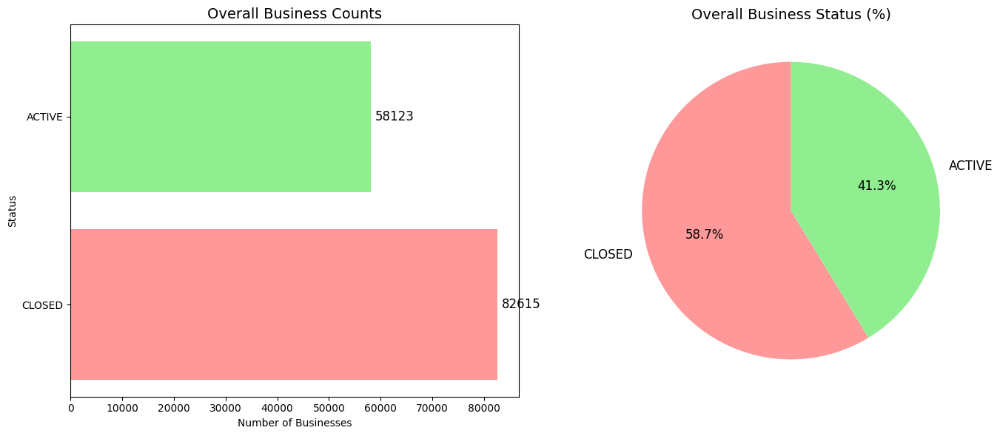

In [ ]:
# ======================================================
# Overall Business Status: (Counts + Pie)
# ======================================================

# Compute overall counts
status_counts = df['business_status'].value_counts().rename({1: 'ACTIVE', 0: 'CLOSED'})

fig, axes = plt.subplots(1, 2, figsize=(14, 6))


# =======================================
# Left: Horizontal bar with counts
# =======================================

axes[0].barh(status_counts.index, status_counts.values, color=['#ff9999','#90ee90'])
for i, v in enumerate(status_counts.values):
    axes[0].text(v + max(status_counts.values)*0.01, i, str(v), va='center', fontsize=12)
axes[0].set_title('Overall Business Counts', fontsize=14)
axes[0].set_xlabel('Number of Businesses')
axes[0].set_ylabel('Status')


# =======================================
# Right: Pie chart with percentages
# =======================================

axes[1].pie(
    status_counts.values,
    labels=status_counts.index,
    autopct='%1.1f%%',
    colors=['#ff9999','#90ee90'],
    startangle=90,
    textprops={'fontsize': 12}
)
axes[1].set_title('Overall Business Status (%)', fontsize=14)

plt.tight_layout()
plt.show()


*   **Businesses Start Distribution**

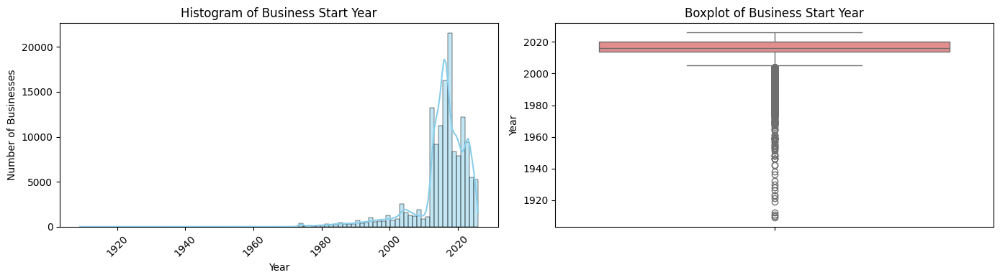

In [ ]:
# =======================================
# Business Start Year Distribution
# =======================================

# Ensure the column exists
df['business_start_year'] = df['date_business_start'].dt.year

fig, axes = plt.subplots(1, 2, figsize=(14, 4))

# Histogram
sns.histplot(df['business_start_year'], bins=df['business_start_year'].nunique(), kde=True, ax=axes[0], color='skyblue')
axes[0].set_title('Histogram of Business Start Year')
axes[0].set_xlabel('Year')
axes[0].set_ylabel('Number of Businesses')
axes[0].tick_params(axis='x', rotation=45)

# Boxplot
sns.boxplot(y=df['business_start_year'], ax=axes[1], color='lightcoral')
axes[1].set_title('Boxplot of Business Start Year')
axes[1].set_ylabel('Year')

plt.tight_layout()
plt.show()



* **Derived Variable: Business age**

In [ ]:
# =======================================
# Compute Business Age
# =======================================

if 'date_business_start' in df.columns:
    df['date_business_start'] = pd.to_datetime(df['date_business_start'], errors='coerce')

    today = pd.Timestamp('today')
    df['business_age'] = (today - df['date_business_start']).dt.days / 365.25

    # Set unrealistic ages to NaN
    df.loc[(df['business_age'] < 0) | (df['business_age'] > 100), 'business_age'] = np.nan

    print("--------------------")
    print("Business Age Statistics")
    print("--------------------")
    print(df['business_age'].describe())
    print(f"Rows with invalid business_age: {df['business_age'].isna().sum()}")

else:
    print("Warning: 'date_business_start' column not found.")
    df['business_age'] = np.nan


--------------------
Business Age Statistics
--------------------
count    140721.000000
mean         10.221320
std           8.097552
min           0.000000
25%           5.267625
50%           9.032170
75%          11.477070
max          98.976044
Name: business_age, dtype: float64
Rows with invalid business_age: 17


* **Business Age Distribution**

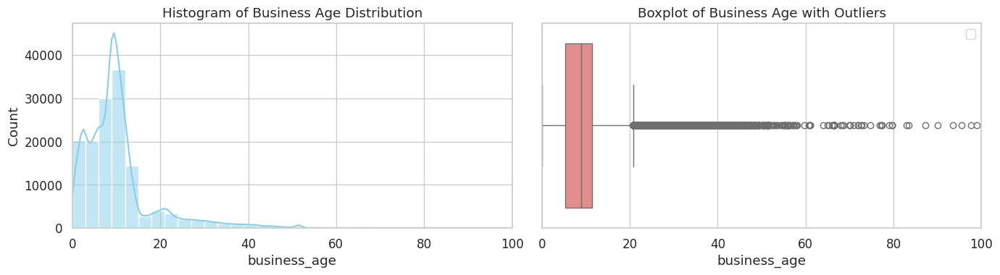

In [ ]:
# =======================================
# Histogram & Boxplot for  Business Age
# =======================================

sns.set(style="whitegrid", palette="muted", font_scale=1.1)

if 'business_age' in df.columns:
    fig, axes = plt.subplots(1, 2, figsize=(14, 4))

    x_min, x_max = 0, 100  # adjust as needed

    # Histogram with wider bins
    sns.histplot(
        df['business_age'].dropna(),
        kde=True,
        ax=axes[0],
        color='skyblue',
        binwidth=3
    )
    axes[0].set_title('Histogram of Business Age Distribution')
    axes[0].set_xlim(x_min, x_max)

    # Boxplot with red outliers
    Q1 = df['business_age'].quantile(0.25)
    Q3 = df['business_age'].quantile(0.75)
    IQR = Q3 - Q1
    outliers = df[(df['business_age'] < Q1 - 1.5*IQR) | (df['business_age'] > Q3 + 1.5*IQR)]['business_age']

    sns.boxplot(x=df['business_age'].dropna(), ax=axes[1], color='lightcoral')
    axes[1].set_title('Boxplot of Business Age with Outliers')
    axes[1].set_xlim(x_min, x_max)
    axes[1].legend()

    plt.tight_layout()
    plt.show()

Bussines age outliers should stay, because they may reflect real businesses behavior (e.g., AS AGE INCREASE, BUSINESS TEND TO STAY ACTIVE). When need it for modeling, transforming the age variable rather than dropping it  may be considered

---



* **Derived variables: Active/Closed rate by Business age**

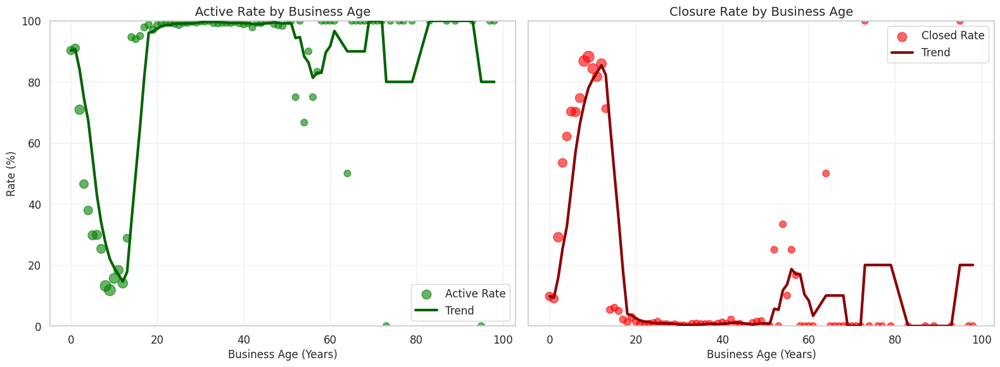

In [ ]:
# =======================================
# Plot: Business Age vs Active/Closed Rate
# =======================================

# Convert business_status to numeric for aggregation
df['business_status_num'] = df['business_status'].map({'ACTIVE': 1, 'CLOSED': 0})

# Round business age to nearest year, keeping NaN
df['age_rounded'] = df['business_age'].apply(lambda x: int(x) if pd.notna(x) else np.nan)

# Drop rows with NaN in age_rounded before aggregation
age_summary = df.dropna(subset=['age_rounded']).groupby('age_rounded')['business_status_num'].agg(
    total='count',
    active='sum'
)

# Compute rates
age_summary['active_rate'] = age_summary['active'] / age_summary['total']
age_summary['closed_rate'] = 1 - age_summary['active_rate']

# Trendlines using rolling mean (window=5 for smoothing)
age_summary['active_rate_smooth'] = age_summary['active_rate'].rolling(5, min_periods=1).mean()
age_summary['closed_rate_smooth'] = age_summary['closed_rate'].rolling(5, min_periods=1).mean()

# Scale marker size by total businesses (optional scaling factor)
marker_size = (age_summary['total'] / age_summary['total'].max() * 100) + 60  # adjust for size

# Create subplots
fig, axes = plt.subplots(1, 2, figsize=(16,6), sharex=True, sharey=True)

# Left: Active Rate
axes[0].scatter(age_summary.index, age_summary['active_rate']*100,
                s=marker_size, color='green', alpha=0.6, label='Active Rate')
axes[0].plot(age_summary.index, age_summary['active_rate_smooth']*100,
             color='darkgreen', linewidth=3, label='Trend', zorder=5)
axes[0].set_title('Active Rate by Business Age', fontsize=14)
axes[0].set_xlabel('Business Age (Years)', fontsize=12)
axes[0].set_ylabel('Rate (%)', fontsize=12)
axes[0].grid(alpha=0.3)
axes[0].legend()

# Right: Closed Rate
axes[1].scatter(age_summary.index, age_summary['closed_rate']*100,
                s=marker_size, color='red', alpha=0.6, label='Closed Rate')
axes[1].plot(age_summary.index, age_summary['closed_rate_smooth']*100,
             color='darkred', linewidth=3, label='Trend', zorder=5)
axes[1].set_title('Closure Rate by Business Age', fontsize=14)
axes[1].set_xlabel('Business Age (Years)', fontsize=12)
axes[1].grid(alpha=0.3)
axes[1].legend()

plt.ylim(0, 100)
plt.tight_layout()
plt.show()


* **Population Distribution**

* **Derived Variables: ACTIVE Business Rate per 1,000 Residents by ZIP Code**

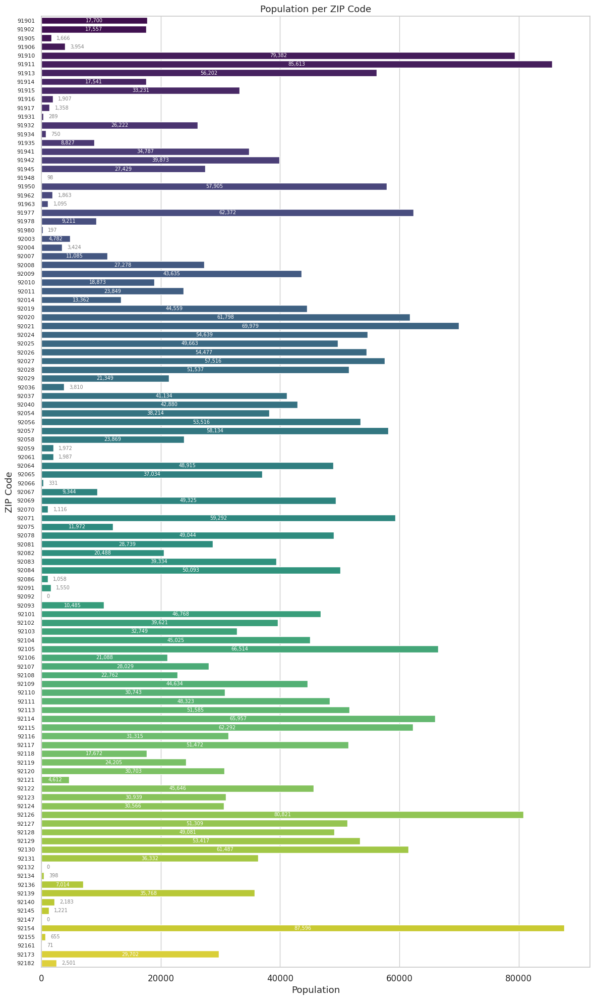

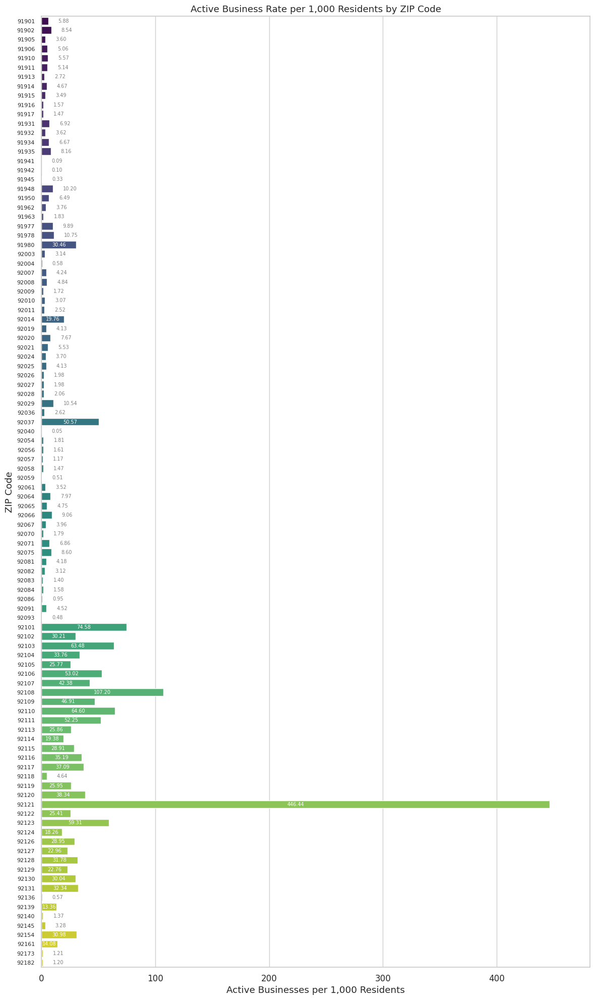

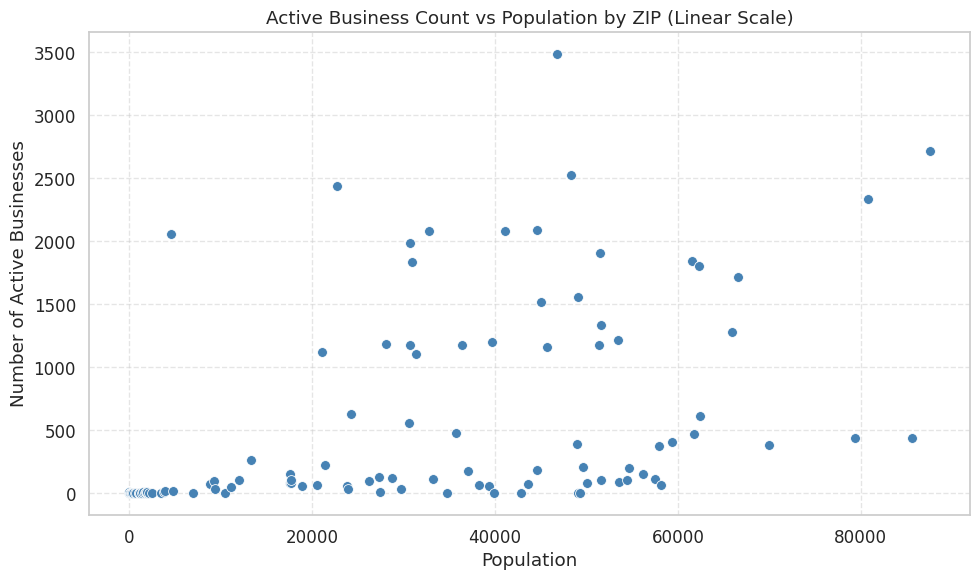

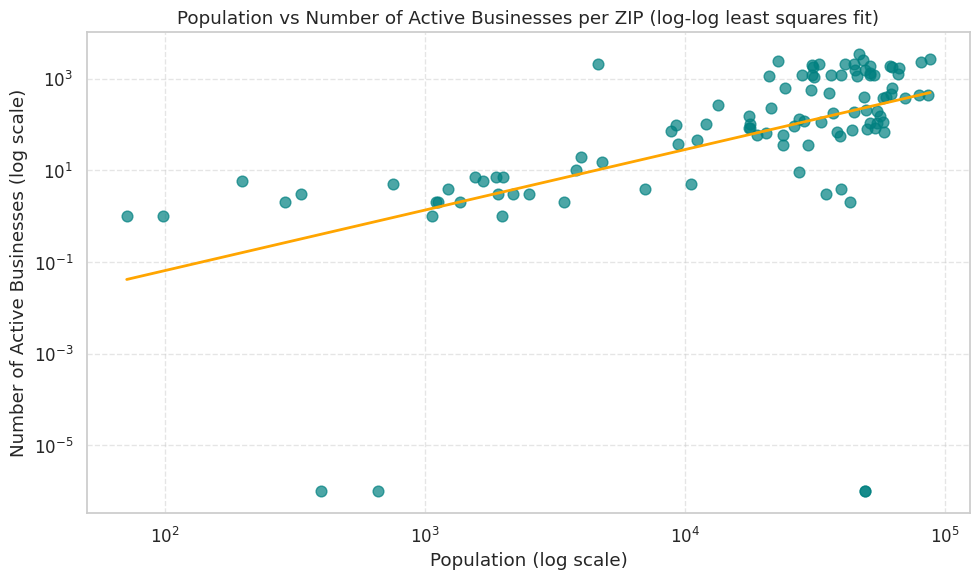

In [ ]:
# =======================================
# Population per ZIP
# =======================================

# Ensure each ZIP has a unique population
zip_pop = df[['zip5', 'population']].drop_duplicates().set_index('zip5').sort_values('population')

plt.figure(figsize=(12, 20))

# Horizontal bar plot
bars = sns.barplot(
    x=zip_pop['population'],
    y=zip_pop.index,
    palette='viridis',
    orient='h'
)

plt.title('Population per ZIP Code')
plt.xlabel('Population')
plt.ylabel('ZIP Code')
plt.yticks(fontsize=8)

# Add population labels with condition for small populations
for bar in bars.patches:
    width = bar.get_width()
    y_pos = bar.get_y() + bar.get_height() / 2

    if width < 4000:  # small populations
        x_pos = width + max(zip_pop['population']) * 0.01  # outside
        color = 'gray'
        ha = 'left'
    else:  # larger populations
        x_pos = width / 2  # inside
        color = 'white'
        ha = 'center'

    bars.text(
        x_pos,
        y_pos,
        f'{int(width):,}',
        va='center',
        ha=ha,
        fontsize=7,
        color=color
    )

plt.tight_layout()
plt.show()



# =======================================
# Active Business Rate per 1000 residents by ZIP
# =======================================

# Filter only active businesses
active_business_df = df[df['business_status'] == 'ACTIVE']

# Count active businesses per ZIP
zip_counts_active = active_business_df['zip5'].value_counts().rename_axis('zip5').reset_index(name='business_count')

# Merge with population
zip_rate_active = zip_pop.reset_index().merge(zip_counts_active, on='zip5', how='left')

# Fill missing or zero population to avoid division by zero
zip_rate_active['population'] = zip_rate_active['population'].replace(0, np.nan)

# Compute business rate safely
zip_rate_active['business_rate_per_1000'] = (
    zip_rate_active['business_count'] / zip_rate_active['population'] * 1000
)

# Remove any rows with NaN or infinite rates
zip_rate_active = zip_rate_active[np.isfinite(zip_rate_active['business_rate_per_1000'])]

# Sort by rate for plotting
zip_rate_active = zip_rate_active.sort_values('business_rate_per_1000', ascending=True)

# Horizontal bar plot
plt.figure(figsize=(12, 20))
bars = sns.barplot(
    x='business_rate_per_1000',
    y='zip5',
    data=zip_rate_active,
    palette='viridis',
    orient='h'
)

plt.title('Active Business Rate per 1,000 Residents by ZIP Code')
plt.xlabel('Active Businesses per 1,000 Residents')
plt.ylabel('ZIP Code')
plt.yticks(fontsize=8)

# Extend x-axis so outside labels are visible
max_rate = zip_rate_active['business_rate_per_1000'].max()
plt.xlim(0, max_rate * 1.08)

# Add labels conditionally
for bar in bars.patches:
    width = bar.get_width()
    y_pos = bar.get_y() + bar.get_height() / 2

    if width < 12:  # low business rate → outside, gray
        x_pos = width + max_rate * 0.02
        color = 'gray'
        ha = 'left'
    else:  # high business rate → inside, white
        x_pos = width / 2
        color = 'white'
        ha = 'center'

    bars.text(
        x_pos,
        y_pos,
        f'{width:.2f}',
        va='center',
        ha=ha,
        fontsize=7,
        color=color
    )

plt.tight_layout()
plt.show()


# =======================================
# Scatter plot: Active Business Count vs Population
# =======================================

zip_data_active = zip_pop.join(zip_counts_active.set_index('zip5'))

# Fill missing counts with 0 (ZIPs with no active businesses)
zip_data_active['business_count'] = zip_data_active['business_count'].fillna(0)

plt.figure(figsize=(10,6))
sns.scatterplot(
    x='population',
    y='business_count',
    data=zip_data_active,
    s=50,  # point size
    color='steelblue'
)

plt.title("Active Business Count vs Population by ZIP (Linear Scale)")
plt.xlabel("Population")
plt.ylabel("Number of Active Businesses")
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


# =======================================
# Log-log Scatter with Least Squares Fit
# =======================================

# Copy data to avoid modifying original
df_plot = zip_data_active[['population', 'business_count']].copy()

# Replace missing or zero values with a small constant
df_plot['population'] = df_plot['population'].fillna(1e-6)
df_plot['business_count'] = df_plot['business_count'].fillna(0) + 1e-6

# Remove any rows with negative or non-finite values (just in case)
df_plot = df_plot[(df_plot['population'] > 0) & (df_plot['business_count'] > 0)]
df_plot = df_plot[np.isfinite(df_plot['population']) & np.isfinite(df_plot['business_count'])]

# Log-transform
x = np.log(df_plot['population'])
y = np.log(df_plot['business_count'])

# Least squares fit
slope, intercept = np.polyfit(x, y, 1)
y_fit = slope * x + intercept

# Plot
plt.figure(figsize=(10,6))
plt.scatter(df_plot['population'], df_plot['business_count'], s=60, color='teal', alpha=0.7)
plt.plot(df_plot['population'], np.exp(y_fit), color='orange', lw=2)  # back-transform to original scale

plt.xscale('log')
plt.yscale('log')
plt.xlabel('Population (log scale)')
plt.ylabel('Number of Active Businesses (log scale)')
plt.title('Population vs Number of Active Businesses per ZIP (log-log least squares fit)')
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


* **Ownership type**

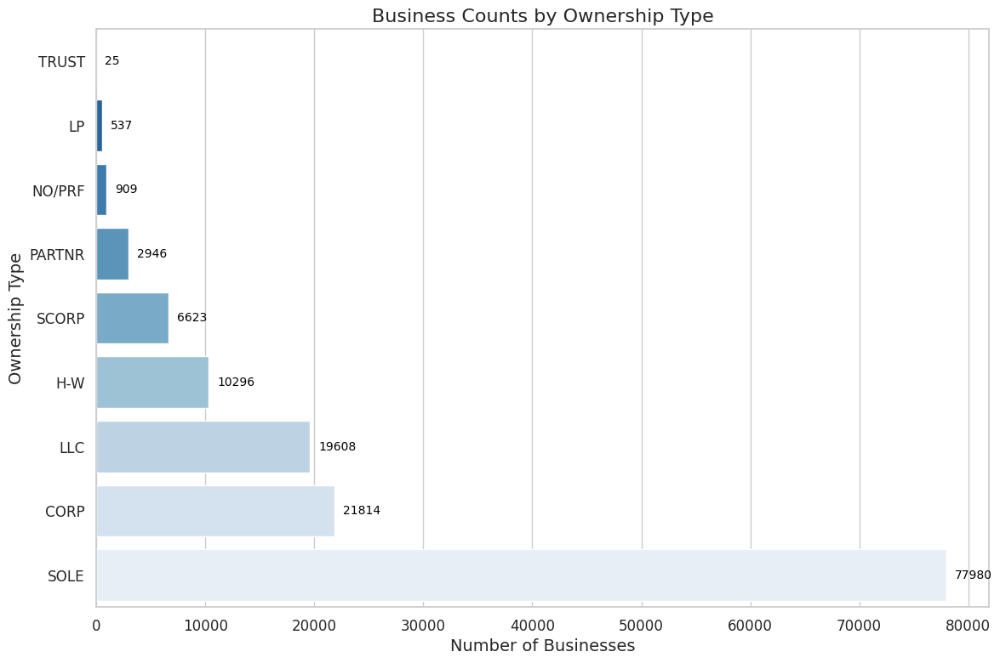

In [ ]:
# =======================================
# Business Counts by Ownership type with Counts on Bars
# =======================================

ownership_counts = df.groupby('ownership_type')['business_status'].count().sort_values()

plt.figure(figsize=(12,8))
ax = sns.barplot(
    y=ownership_counts.index,
    x=ownership_counts.values,
    palette='Blues_r'
)

# Add counts on top of each bar
for i, v in enumerate(ownership_counts.values):
    ax.text(v + max(ownership_counts.values)*0.01, i, str(v), color='black', va='center', fontsize=10)

plt.title('Business Counts by Ownership Type', fontsize=16)
plt.xlabel('Number of Businesses', fontsize=14)
plt.ylabel('Ownership Type', fontsize=14)
plt.tight_layout()
plt.show()


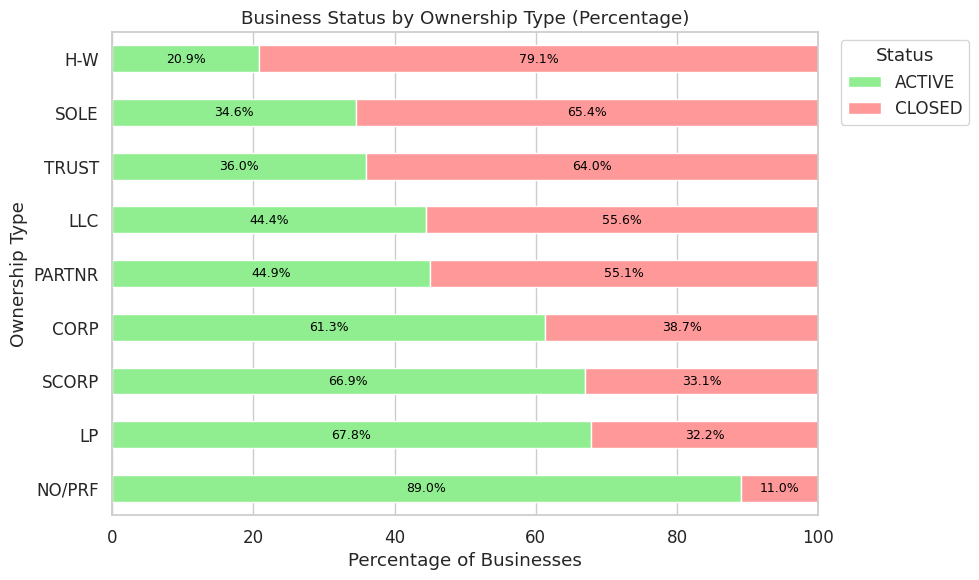

In [ ]:
# =======================================
# Business Active/Closed rates by Ownership Type
# =======================================

if 'ownership_type' in df.columns:
    ownership_summary = df.groupby(['ownership_type', 'business_status']).size().unstack(fill_value=0)
    ownership_summary = ownership_summary.rename(columns={0: 'CLOSED', 1: 'ACTIVE'})
    ownership_percentage = ownership_summary.div(ownership_summary.sum(axis=1), axis=0) * 100

    # Sort by Active percentage
    ownership_percentage = ownership_percentage.sort_values('ACTIVE', ascending=False)

    # Plot
    ax = ownership_percentage.plot(
        kind='barh',
        stacked=True,
        color=['#90ee90', '#ff9999'],
        figsize=(10, 6)
    )
    plt.title('Business Status by Ownership Type (Percentage)')
    plt.xlabel('Percentage of Businesses')
    plt.ylabel('Ownership Type')
    plt.xlim(0, 100)

    # Add percentage labels
    for container in ax.containers:
        ax.bar_label(container, fmt='%.1f%%', label_type='center', color='black', fontsize=9)

    # Move legend outside
    ax.legend(title='Status', bbox_to_anchor=(1.02, 1), loc='upper left')

    plt.tight_layout()
    plt.show()


* **NAICS Sector**

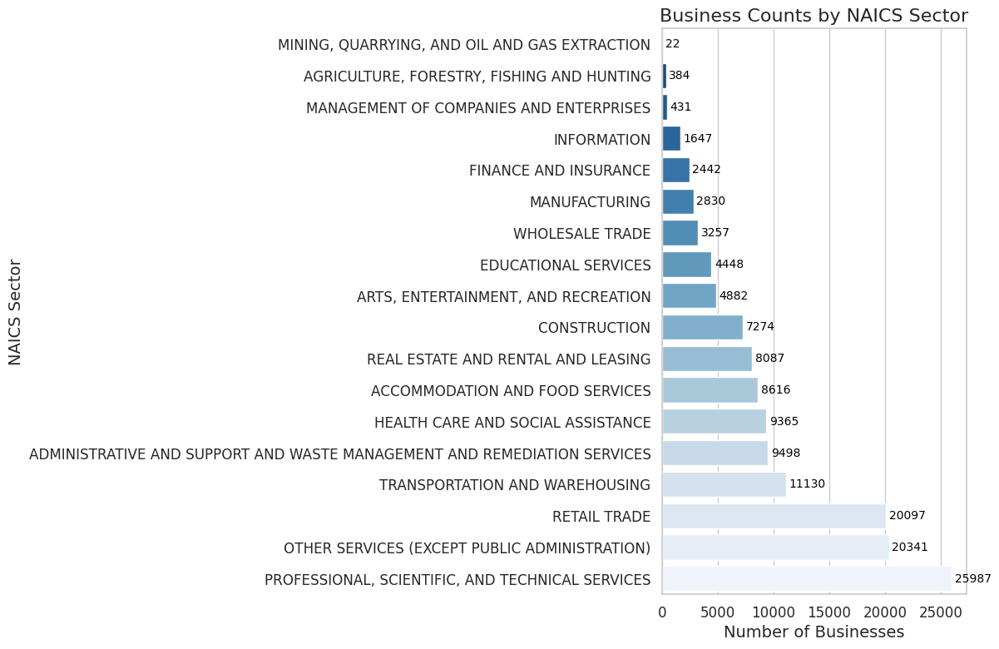

In [ ]:
# =======================================
# Business Counts by NAICS Sector
# =======================================

sector_counts = df.groupby('naics_sector_standard')['business_status'].count().sort_values()

plt.figure(figsize=(12,8))
ax = sns.barplot(
    y=sector_counts.index,
    x=sector_counts.values,
    palette='Blues_r'
)

# Add counts on top of each bar
for i, v in enumerate(sector_counts.values):
    ax.text(v + max(sector_counts.values)*0.01, i, str(v), color='black', va='center', fontsize=10)

plt.title('Business Counts by NAICS Sector', fontsize=16)
plt.xlabel('Number of Businesses', fontsize=14)
plt.ylabel('NAICS Sector', fontsize=14)
plt.tight_layout()
plt.show()


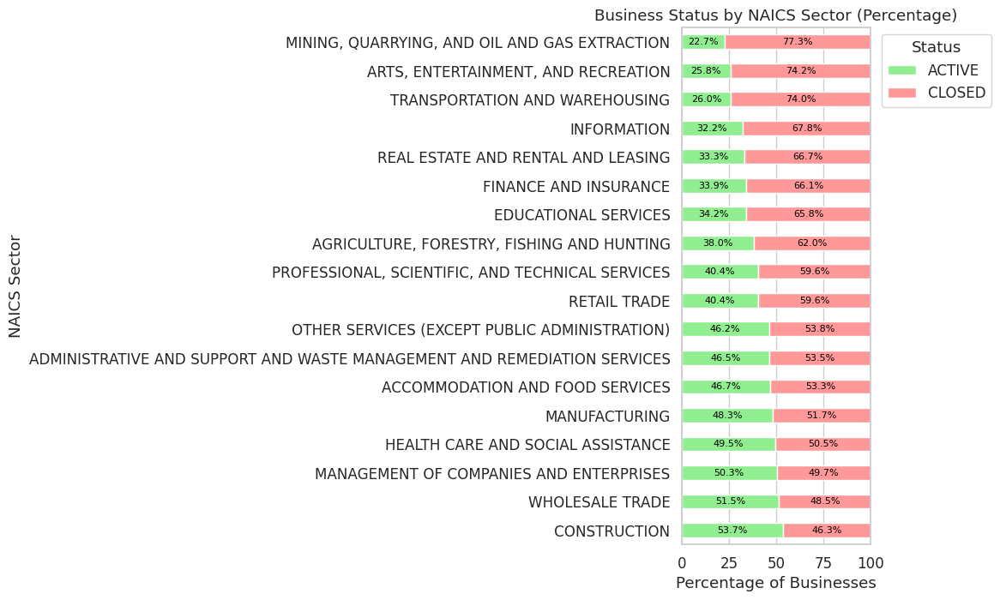

In [ ]:
# =======================================
# Business Active/Closed rates by NAICS Sector
# =======================================

if 'naics_sector_standard' in df.columns:
    sector_summary = df.groupby(['naics_sector_standard', 'business_status']).size().unstack(fill_value=0)
    sector_summary = sector_summary.rename(columns={0: 'CLOSED', 1: 'ACTIVE'})
    sector_percentage = sector_summary.div(sector_summary.sum(axis=1), axis=0) * 100

    # Sort by Active percentage
    sector_percentage = sector_percentage.sort_values('ACTIVE', ascending=False)

    # Plot
    ax = sector_percentage.plot(
        kind='barh',
        stacked=True,
        color=['#90ee90', '#ff9999'],
        figsize=(12, max(6, len(sector_percentage) * 0.4))
    )
    plt.title('Business Status by NAICS Sector (Percentage)')
    plt.xlabel('Percentage of Businesses')
    plt.ylabel('NAICS Sector')
    plt.xlim(0, 100)

    # Add percentage labels
    for container in ax.containers:
        ax.bar_label(container, fmt='%.1f%%', label_type='center', color='black', fontsize=8)

    # Move legend outside
    ax.legend(title='Status', bbox_to_anchor=(1.02, 1), loc='upper left')

    plt.tight_layout()
    plt.show()


* **Derived Variables: Age Groups**

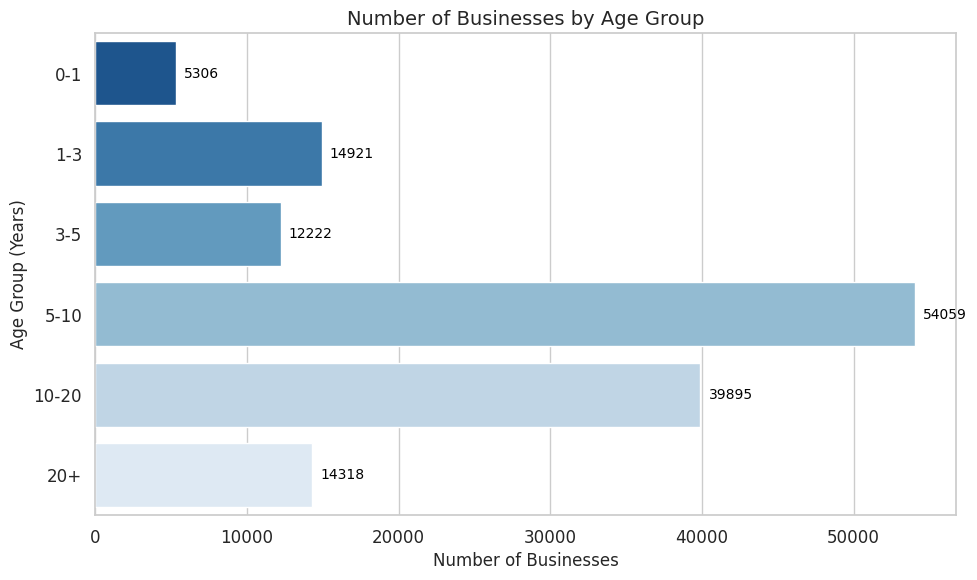

In [ ]:
# =======================================
# Create age groups
# =======================================

bins = [0, 1, 3, 5, 10, 20, df['business_age'].max()+1]
labels = ['0-1','1-3','3-5','5-10','10-20','20+']
df['age_group'] = pd.cut(df['business_age'], bins=bins, labels=labels, right=False)

# =======================================
# Horizontal bar with counts
# =======================================

age_counts = df['age_group'].value_counts().sort_index()

plt.figure(figsize=(10,6))
ax = sns.barplot(
    y=age_counts.index,
    x=age_counts.values,
    palette='Blues_r'
)

# Add counts on bars
for i, v in enumerate(age_counts.values):
    ax.text(v + max(age_counts.values)*0.01, i, str(v), va='center', color='black', fontsize=10)

plt.title('Number of Businesses by Age Group', fontsize=14)
plt.xlabel('Number of Businesses', fontsize=12)
plt.ylabel('Age Group (Years)', fontsize=12)
plt.tight_layout()
plt.show()


<Figure size 1000x600 with 0 Axes>

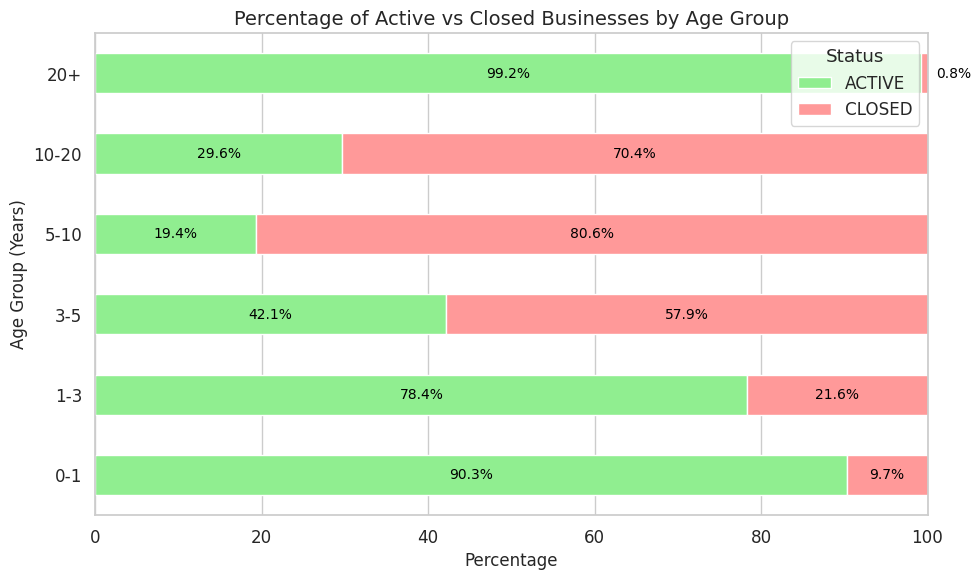

In [ ]:
# ===============================
# Prepare age_percentage DataFrame using age_group
# ===============================

# Compute percentage of Active vs Closed per age_group
age_percentage = df.groupby('age_group')['business_status'].value_counts(normalize=True).unstack(fill_value=0) * 100

# Ensure columns exist and correct order
for col in ['ACTIVE', 'CLOSED']:
    if col not in age_percentage.columns:
        age_percentage[col] = 0
age_percentage = age_percentage[['ACTIVE', 'CLOSED']]

# ===============================
# Horizontal Stacked Bar: Active vs Closed by Age Group
# ===============================

plt.figure(figsize=(10,6))

# Plot stacked horizontal bars
ax = age_percentage.plot(
    kind='barh',
    stacked=True,
    color=['#90ee90', '#ff9999'],
    figsize=(10,6)
)

# Add labels: inside if wide enough, outside if too small
for container in ax.containers:
    for bar in container:
        width = bar.get_width()
        xpos = bar.get_x() + width / 2
        ypos = bar.get_y() + bar.get_height() / 2

        # Segment too small, place label outside
        if width < 5:
            xpos = bar.get_x() + width + 1
            color = 'black'
            ha = 'left'
        else:
            color = 'black'
            ha = 'center'

        ax.text(xpos, ypos, f'{width:.1f}%', ha=ha, va='center', color=color, fontsize=10)

# Final plot formatting
plt.title('Percentage of Active vs Closed Businesses by Age Group', fontsize=14)
plt.xlabel('Percentage', fontsize=12)
plt.ylabel('Age Group (Years)', fontsize=12)
plt.xlim(0, 100)
plt.legend(title='Status', loc='upper right')
plt.tight_layout()
plt.show()


**20+ Years Businesses are 99.2% Active. Let's investigate!**

---



In [ ]:
# Filter businesses in 20+ age group
age_20plus = df[df['age_group'] == '20+']


*  **Ownership types for 20+ Years Active Businesses**

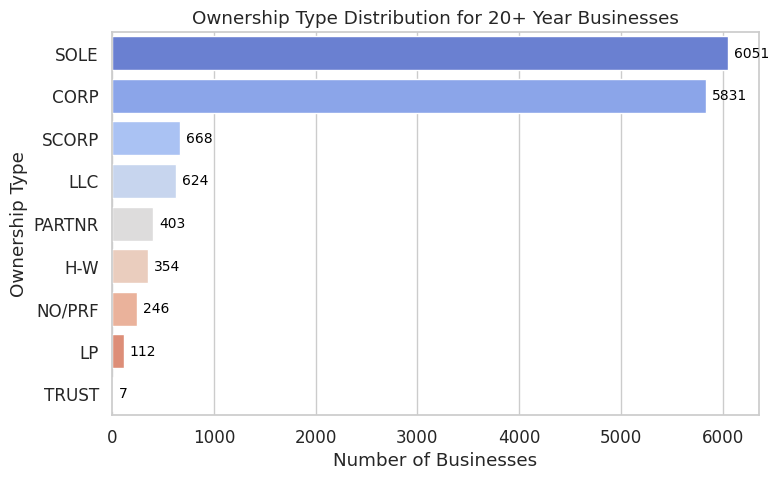

In [ ]:
# =======================================
# Count ownership types
# =======================================

ownership_counts = age_20plus['ownership_type'].value_counts()

# Horizontal bar plot
plt.figure(figsize=(8,5))
sns.barplot(x=ownership_counts.values, y=ownership_counts.index, palette='coolwarm')
plt.title('Ownership Type Distribution for 20+ Year Businesses')
plt.xlabel('Number of Businesses')
plt.ylabel('Ownership Type')

# Add counts on bars
for i, v in enumerate(ownership_counts.values):
    plt.text(v + max(ownership_counts.values)*0.01, i, str(v), va='center', color='black', fontsize=10)

plt.tight_layout()
plt.show()


*  **Business NAICS sector for 20+ Years Active Businesses**

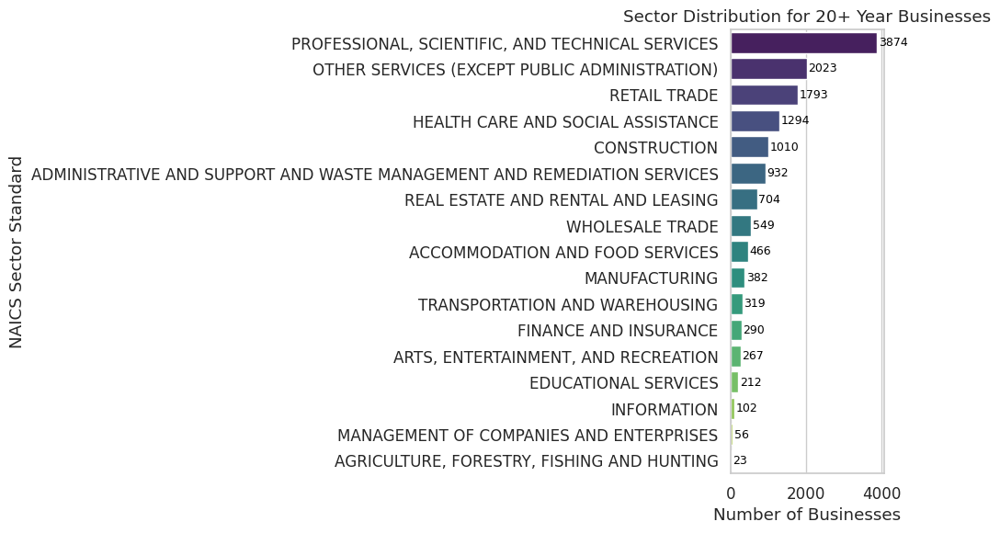

In [ ]:
# =======================================
# Count sectors
# =======================================

sector_counts = age_20plus['naics_sector_standard'].value_counts()

# Horizontal bar plot
sector_counts = sector_counts.sort_values(ascending=False)

plt.figure(figsize=(10,6))
sns.barplot(x=sector_counts.values, y=sector_counts.index, palette='viridis')
plt.title('Sector Distribution for 20+ Year Businesses')
plt.xlabel('Number of Businesses')
plt.ylabel('NAICS Sector Standard')

# Add counts on bars
for i, v in enumerate(sector_counts.values):
    plt.text(v + max(sector_counts.values)*0.01, i, str(v), va='center', color='black', fontsize=9)

plt.tight_layout()
plt.show()


*  **Zip Codes for 20+ Years Active Businesses**

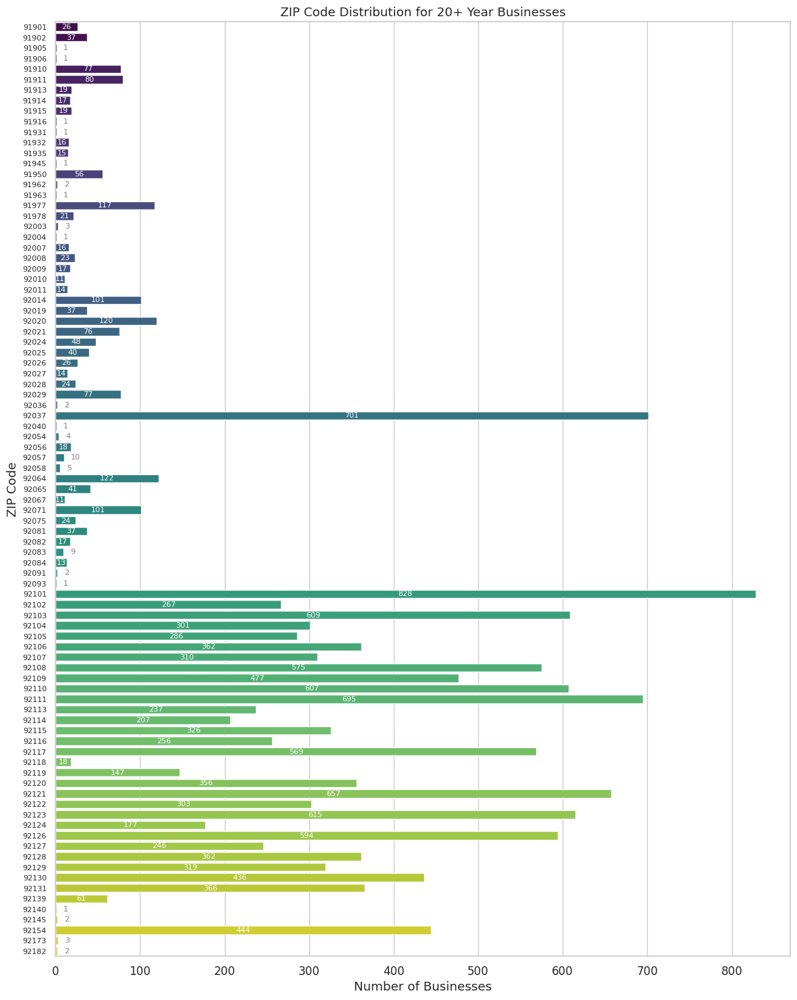

In [ ]:
# =======================================
# Count businesses per ZIP
# =======================================

zip_counts = age_20plus['zip5'].value_counts().sort_values(ascending=True)

plt.figure(figsize=(12, 15))  # taller figure for all ZIPs

# Horizontal bar plot
bars = sns.barplot(
    x=zip_counts.values,
    y=zip_counts.index,
    palette='viridis',
    orient='h'
)

plt.title('ZIP Code Distribution for 20+ Year Businesses')
plt.xlabel('Number of Businesses')
plt.ylabel('ZIP Code')
plt.yticks(fontsize=8)

# Add counts with rule: <11 outside, >=11 inside
for bar in bars.patches:
    width = bar.get_width()
    y_pos = bar.get_y() + bar.get_height() / 2

    if width < 11:  # small counts
        x_pos = width + max(zip_counts.values)*0.01  # slightly outside
        color = 'gray'
        ha = 'left'
    else:  # larger counts
        x_pos = width / 2  # inside bar
        color = 'white'
        ha = 'center'

    bars.text(
        x_pos,
        y_pos,
        str(int(width)),
        va='center',
        ha=ha,
        fontsize=8,
        color=color
    )

plt.tight_layout()
plt.show()


*  **Cities for 20+ Years Active Businesses**

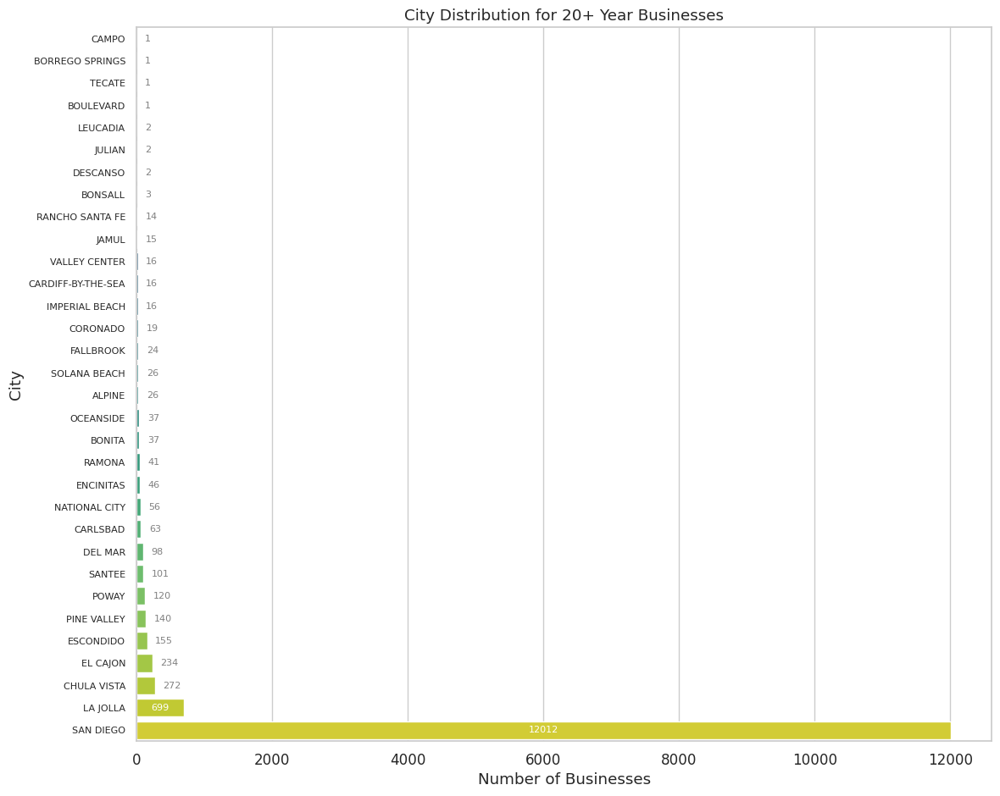

In [ ]:
# =======================================
# Count businesses per city
# =======================================

city_counts = age_20plus['address_city'].value_counts().sort_values(ascending=True)

plt.figure(figsize=(12, max(6, len(city_counts)*0.3)))

# Horizontal bar plot
bars = sns.barplot(
    x=city_counts.values,
    y=city_counts.index,
    palette='viridis',
    orient='h'
)

plt.title('City Distribution for 20+ Year Businesses')
plt.xlabel('Number of Businesses')
plt.ylabel('City')
plt.yticks(fontsize=8)

# Add counts with rule: <600 outside, >=600 inside
for bar in bars.patches:
    width = bar.get_width()
    y_pos = bar.get_y() + bar.get_height() / 2

    if width < 600:  # small counts
        x_pos = width + max(city_counts.values)*0.01
        color = 'gray'
        ha = 'left'
    else:  # larger counts
        x_pos = width / 2  # inside bar
        color = 'white'
        ha = 'center'

    bars.text(
        x_pos,
        y_pos,
        str(int(width)),
        va='center',
        ha=ha,
        fontsize=8,
        color=color
    )

plt.tight_layout()
plt.show()


*** 20+ years business exploratory analysis is over ***

---



 * **Derived Variables: Closed / Active Rate by City**

<Figure size 1200x1290 with 0 Axes>

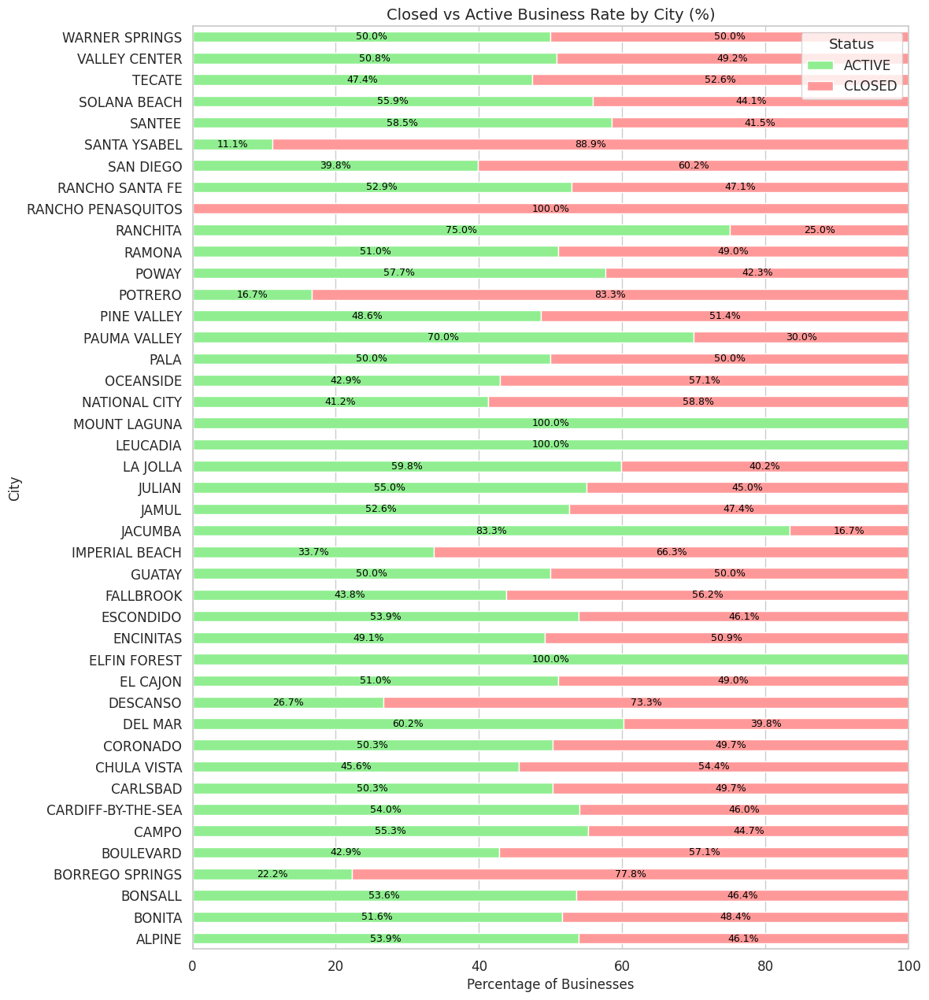

In [ ]:
# ===============================
# Closed / Active Rate by City
# ===============================

# Prepare city_percentage DataFrame
# Compute percentage of Active vs Closed per city
city_percentage = df.groupby('address_city')['business_status'].value_counts(normalize=True).unstack(fill_value=0) * 100

# Ensure columns exist and correct order
for col in ['ACTIVE', 'CLOSED']:
    if col not in city_percentage.columns:
        city_percentage[col] = 0
city_percentage = city_percentage[['ACTIVE','CLOSED']]
plt.figure(figsize=(12, max(6, len(city_percentage)*0.3)))
ax = city_percentage.plot(
    kind='barh',
    stacked=True,
    color=['#90ee90', '#ff9999'],
    figsize=(12, max(6, len(city_percentage)*0.3))
)

# Add percentage labels inside bars
for container in ax.containers:
    for bar in container:
        width = bar.get_width()
        if width < 1:  # skip very small or zero-width bars
            continue
        xpos = bar.get_x() + width/2
        ypos = bar.get_y() + bar.get_height()/2

        # Reduce font size for narrow segments
        fontsize = 8 if width < 5 else 9
        ax.text(xpos, ypos, f'{width:.1f}%', ha='center', va='center', color='black', fontsize=fontsize)

# Formatting
plt.title('Closed vs Active Business Rate by City (%)', fontsize=14)
plt.xlabel('Percentage of Businesses', fontsize=12)
plt.ylabel('City', fontsize=12)
plt.xlim(0, 100)
plt.legend(title='Status', loc='upper right')
plt.tight_layout()
plt.show()


*  **Derived Variables: Closed / Active Rate by ZIP**

<Figure size 1200x2725 with 0 Axes>

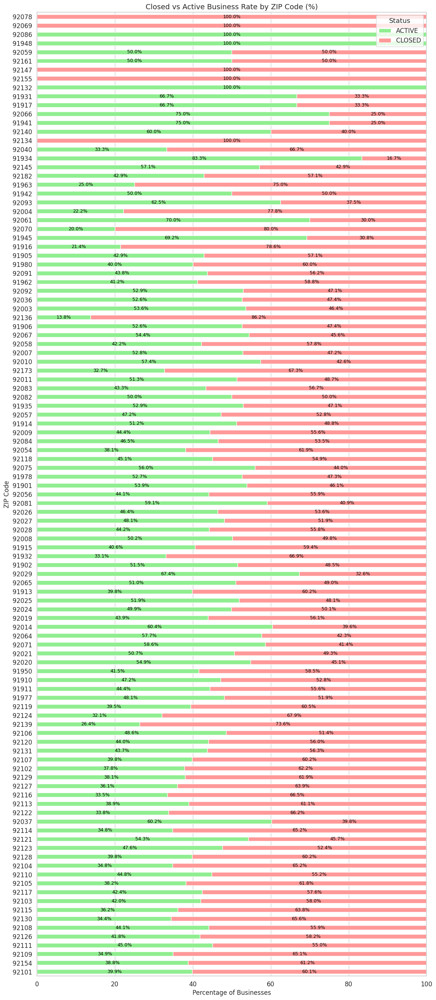

In [ ]:
# ===============================
# Closed / Active Rate by ZIP Code
# ===============================

# Compute counts per ZIP code
zip_status = df.groupby(['zip5', 'business_status']).size().unstack(fill_value=0)
zip_status = zip_status.rename(columns={0:'Closed', 1:'Active'})

# Compute percentages
zip_percentage = zip_status.div(zip_status.sum(axis=1), axis=0) * 100

# Sort by total number of businesses
zip_percentage['total'] = zip_status.sum(axis=1)
zip_percentage = zip_percentage.sort_values('total', ascending=False).drop(columns='total')

# Plot horizontal stacked bar
plt.figure(figsize=(12, max(6, len(zip_percentage)*0.25)))
ax = zip_percentage.plot(
    kind='barh',
    stacked=True,
    color=['#90ee90','#ff9999'],
    figsize=(12, max(6, len(zip_percentage)*0.25))
)

# Add percentage labels inside bars
for container in ax.containers:
    for bar in container:
        width = bar.get_width()
        if width < 1:  # skip zero-width
            continue
        xpos = bar.get_x() + width/2
        ypos = bar.get_y() + bar.get_height()/2
        fontsize = 8 if width < 5 else 9
        ax.text(xpos, ypos, f'{width:.1f}%', ha='center', va='center', color='black', fontsize=fontsize)

# Formatting
plt.title('Closed vs Active Business Rate by ZIP Code (%)', fontsize=14)
plt.xlabel('Percentage of Businesses', fontsize=12)
plt.ylabel('ZIP Code', fontsize=12)
plt.xlim(0, 100)
plt.legend(title='Status', loc='upper right')
plt.tight_layout()
plt.show()


In [ ]:
# Overview of the dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 140738 entries, 0 to 140737
Data columns (total 16 columns):
 #   Column                 Non-Null Count   Dtype         
---  ------                 --------------   -----         
 0   ownership_type         140738 non-null  object        
 1   date_business_start    140738 non-null  datetime64[ns]
 2   address_city           140738 non-null  object        
 3   address_state          140738 non-null  object        
 4   lat                    140738 non-null  float64       
 5   lng                    140738 non-null  float64       
 6   zip5                   140738 non-null  int64         
 7   population             140738 non-null  float64       
 8   naics_sector_standard  140738 non-null  object        
 9   business_status        140738 non-null  object        
 10  raw_business_start     140738 non-null  object        
 11  business_start_year    140738 non-null  int32         
 12  business_age           140720 non-null  floa

# **Inferential Analysis**

# **Categorical Variables**


Hypothesis Test: Business Age Group vs Closure Rate
H0: Closure rate is independent of business age group
Ha: Closure rate depends on business age group
Significance level: α = 0.05
Chi-Square Statistic = 46472.14
p-value = 0.00000
Conclusion: Reject H0 → Closure rate depends on business age group


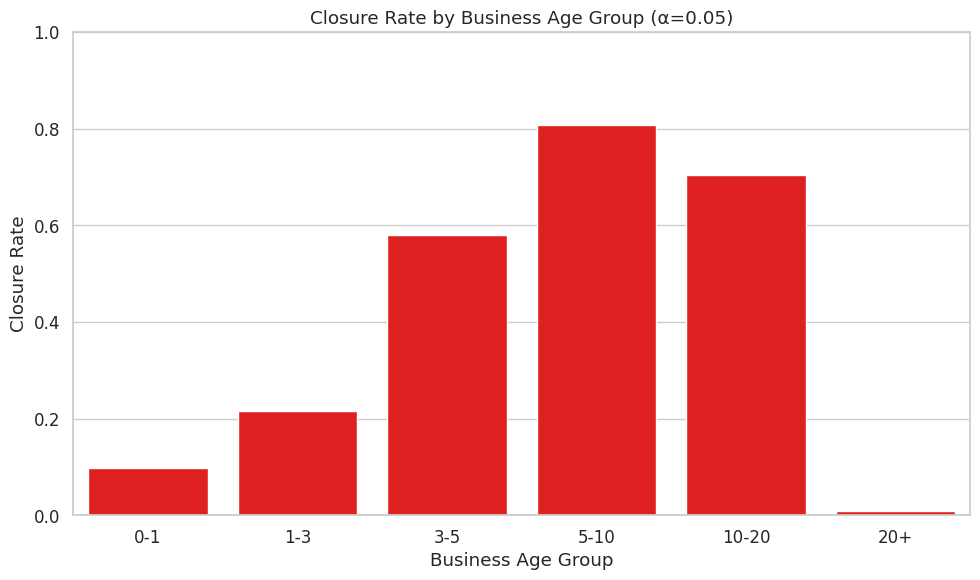

Hypothesis Test: Business Closure Rate vs NAICS Sector
H0: Closure rate is independent of NAICS sector
Ha: Closure rate depends on NAICS sector
Significance level: α = 0.05
Chi-Square Statistic = 3339.34
p-value = 0.00000
Conclusion: Reject H0 → Closure rate depends on NAICS sector


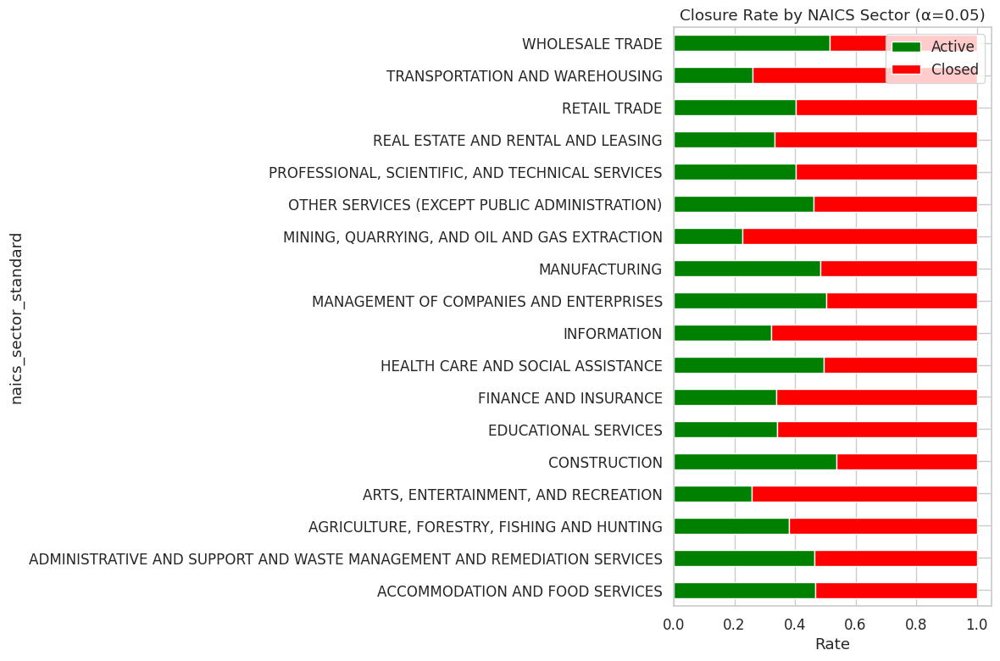

Hypothesis Test: Business Closure Rate vs Ownership Type
H0: Closure rate is independent of ownership type
Ha: Closure rate depends on ownership type
Significance level: α = 0.05
Chi-Square Statistic = 9749.13
p-value = 0.00000
Conclusion: Reject H0 → Closure rate depends on ownership type


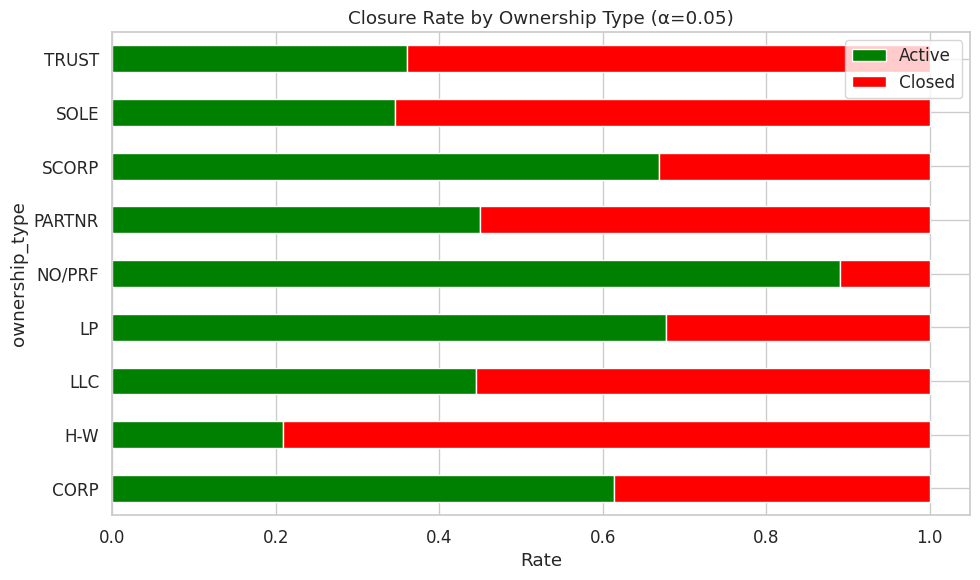

Hypothesis Test: Business Closure Rate vs City
H0: Closure rate is independent of city
Ha: Closure rate depends on city
Significance level: α = 0.05
Chi-Square Statistic = 1188.14
p-value = 0.00000
Conclusion: Reject H0 → Closure rate depends on city


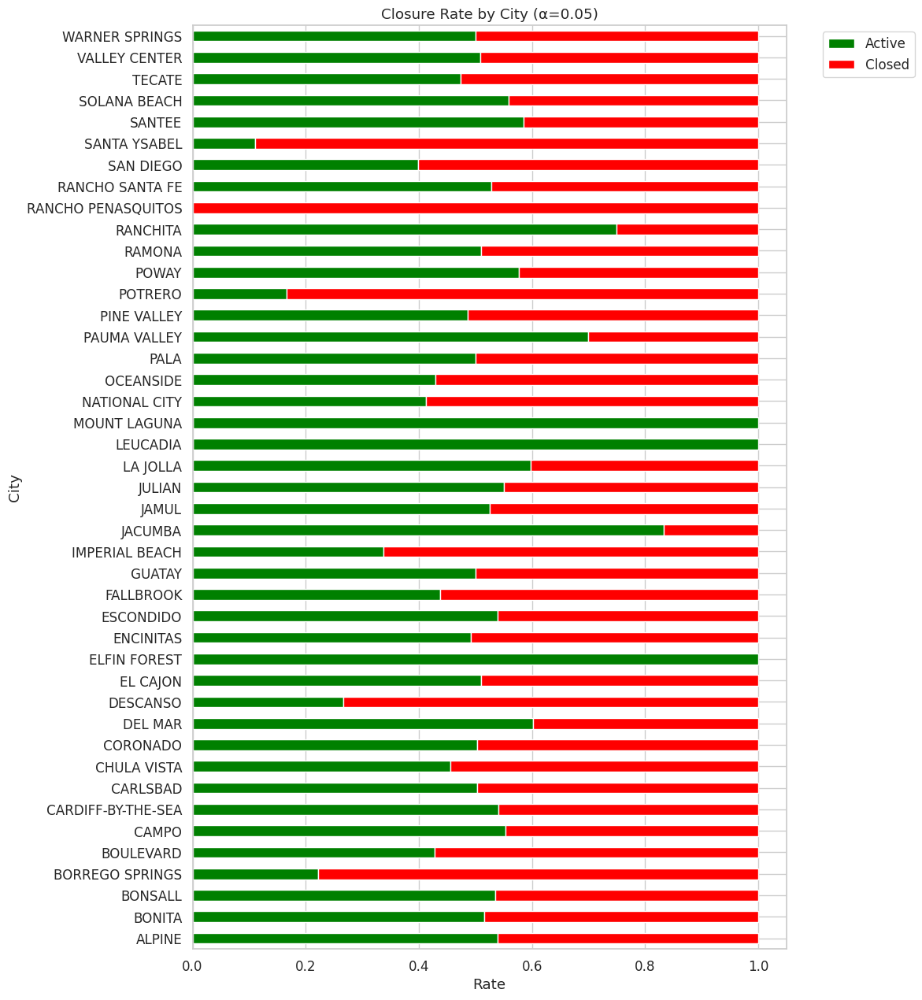

Hypothesis Test: Business Closure Rate vs ZIP Code
H0: Closure rate is independent of ZIP code
Ha: Closure rate depends on ZIP code
Significance level: α = 0.05
Chi-Square Statistic = 2608.47
p-value = 0.00000
Conclusion: Reject H0 → Closure rate depends on ZIP code


<Figure size 1200x3270 with 0 Axes>

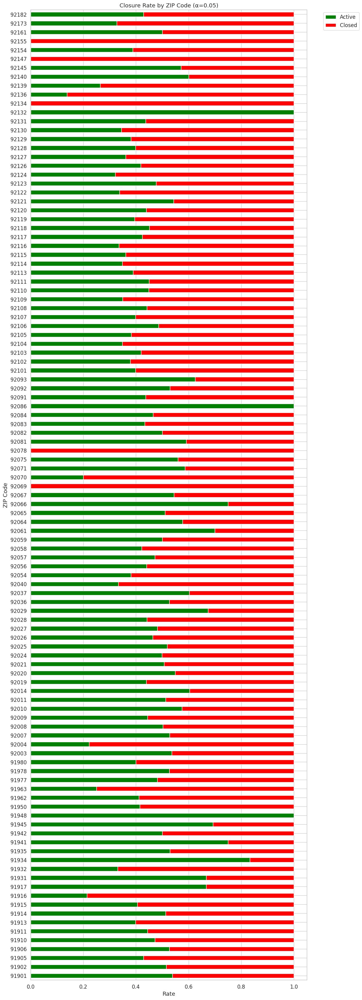

Hypothesis Test: Ownership Type vs NAICS Sector
H0: Ownership type is independent of NAICS sector
Ha: Ownership type depends on NAICS sector
Significance level: α = 0.05
Chi-Square Statistic = 24365.89
p-value = 0.00000
Conclusion: Reject H0 → Ownership type depends on NAICS sector


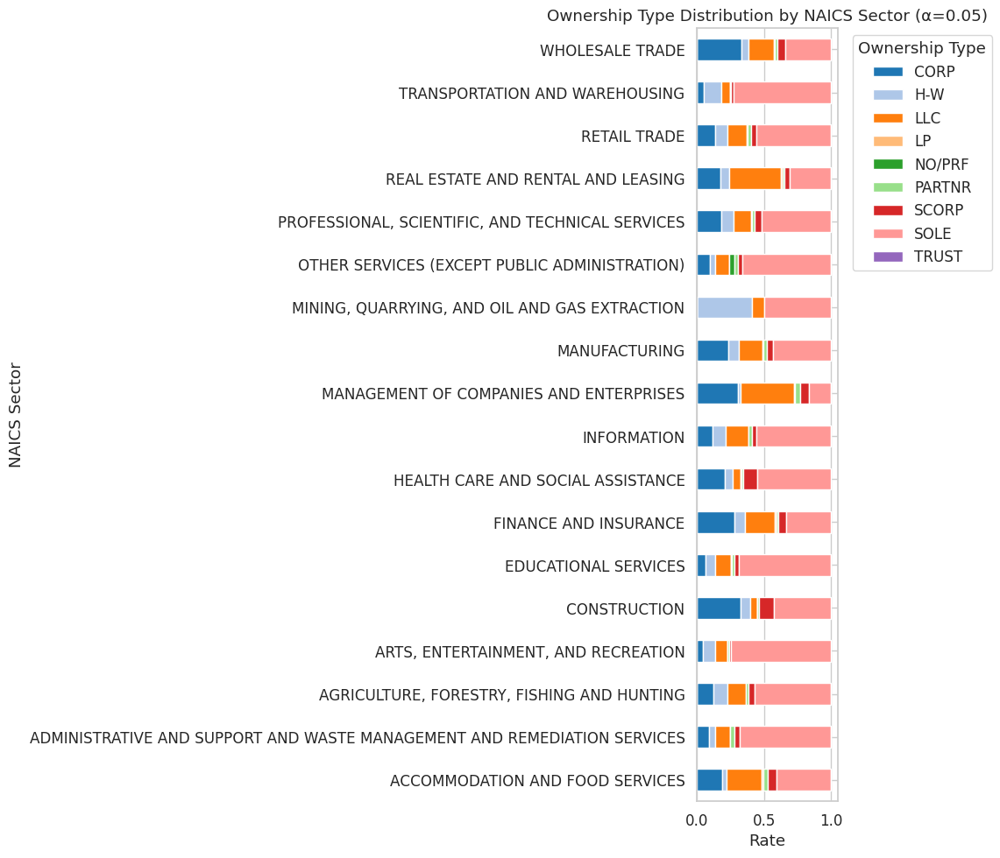

In [ ]:
# SET SIGNIFICANCE LEVEL (for all inferential analysis)

alpha = 0.05

# ======================================================
# Hypothesis Test: Business Age Group vs Closure Rate
# ======================================================

# Create contingency table: age_group vs business_status
age_contingency = pd.crosstab(df['age_group'], df['business_status'])

# Ensure closure_rate column exists for plotting
age_summary = age_contingency.copy()

# Check column names match the values in 'business_status'
for col in ['ACTIVE', 'CLOSED']:
    if col not in age_summary.columns:
        age_summary[col] = 0
age_summary['closure_rate'] = age_summary['CLOSED'] / (age_summary['ACTIVE'] + age_summary['CLOSED'])

# Chi-Square Test
print("Hypothesis Test: Business Age Group vs Closure Rate")
chi2, p, dof, expected = chi2_contingency(age_contingency)
conclusion = "Reject H0 → Closure rate depends on business age group" if p < alpha else "Fail to Reject H0 → Closure rate independent of business age group"

print("H0: Closure rate is independent of business age group")
print("Ha: Closure rate depends on business age group")
print(f"Significance level: α = {alpha}")
print(f"Chi-Square Statistic = {chi2:.2f}")
print(f"p-value = {p:.5f}")
print(f"Conclusion: {conclusion}")

# Visualization
plt.figure(figsize=(10,6))
sns.barplot(
    x=age_summary.index,
    y=age_summary['closure_rate'],
    color='red'  # closure = red
)

plt.title(f"Closure Rate by Business Age Group (α={alpha})")
plt.ylabel('Closure Rate')
plt.xlabel('Business Age Group')
plt.ylim(0,1)
plt.tight_layout()
plt.show()


# =======================================
# Business Closure Rate vs NAICS Sector
# =======================================

print("Hypothesis Test: Business Closure Rate vs NAICS Sector")
cross_tab_sector = pd.crosstab(df['naics_sector_standard'], df['business_status'])
chi2, p, dof, expected = chi2_contingency(cross_tab_sector)
conclusion = "Reject H0 → Closure rate depends on NAICS sector" if p < alpha else "Fail to Reject H0 → Closure rate independent of NAICS sector"

print("H0: Closure rate is independent of NAICS sector")
print("Ha: Closure rate depends on NAICS sector")
print(f"Significance level: α = {alpha}")
print(f"Chi-Square Statistic = {chi2:.2f}")
print(f"p-value = {p:.5f}")
print(f"Conclusion: {conclusion}")

# Visualization
cross_tab_sector_norm = cross_tab_sector.div(cross_tab_sector.sum(axis=1), axis=0)
cross_tab_sector_norm.plot(kind='barh', stacked=True, figsize=(12,8), color=['green','red'])
plt.xlabel("Rate")
plt.title(f"Closure Rate by NAICS Sector (α={alpha})")
plt.legend(['Active','Closed'])
plt.tight_layout()
plt.show()

# =======================================
# Business Closure Rate vs Ownership Type
# =======================================

print("Hypothesis Test: Business Closure Rate vs Ownership Type")
cross_tab_own = pd.crosstab(df['ownership_type'], df['business_status'])
chi2, p, dof, expected = chi2_contingency(cross_tab_own)
conclusion = "Reject H0 → Closure rate depends on ownership type" if p < alpha else "Fail to Reject H0 → Closure rate independent of ownership type"

print("H0: Closure rate is independent of ownership type")
print("Ha: Closure rate depends on ownership type")
print(f"Significance level: α = {alpha}")
print(f"Chi-Square Statistic = {chi2:.2f}")
print(f"p-value = {p:.5f}")
print(f"Conclusion: {conclusion}")

# Visualization
cross_tab_own_norm = cross_tab_own.div(cross_tab_own.sum(axis=1), axis=0)
cross_tab_own_norm.plot(kind='barh', stacked=True, figsize=(10,6), color=['green','red'])
plt.xlabel("Rate")
plt.title(f"Closure Rate by Ownership Type (α={alpha})")
plt.legend(['Active','Closed'])
plt.tight_layout()
plt.show()

# =======================================
# Business Closure Rate vs City
# =======================================

print("Hypothesis Test: Business Closure Rate vs City")
cross_tab_city = pd.crosstab(df['address_city'], df['business_status'])
chi2, p, dof, expected = chi2_contingency(cross_tab_city)
conclusion = "Reject H0 → Closure rate depends on city" if p < alpha else "Fail to Reject H0 → Closure rate independent of city"

print("H0: Closure rate is independent of city")
print("Ha: Closure rate depends on city")
print(f"Significance level: α = {alpha}")
print(f"Chi-Square Statistic = {chi2:.2f}")
print(f"p-value = {p:.5f}")
print(f"Conclusion: {conclusion}")

# Visualization: Horizontal stacked bar chart
cross_tab_city_norm = cross_tab_city.div(cross_tab_city.sum(axis=1), axis=0)
cross_tab_city_norm.plot(kind='barh', stacked=True, figsize=(12, max(6, len(cross_tab_city)*0.3)), color=['green','red'])
plt.xlabel("Rate")
plt.ylabel("City")
plt.title(f"Closure Rate by City (α={alpha})")
plt.legend(['Active','Closed'], bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

# =======================================
# Business Closure Rate vs ZIP
# =======================================

print("Hypothesis Test: Business Closure Rate vs ZIP Code")
cross_tab_zip = pd.crosstab(df['zip5'], df['business_status'])
chi2, p, dof, expected = chi2_contingency(cross_tab_zip)
conclusion = "Reject H0 → Closure rate depends on ZIP code" if p < alpha else "Fail to Reject H0 → Closure rate independent of ZIP code"

print("H0: Closure rate is independent of ZIP code")
print("Ha: Closure rate depends on ZIP code")
print(f"Significance level: α = {alpha}")
print(f"Chi-Square Statistic = {chi2:.2f}")
print(f"p-value = {p:.5f}")
print(f"Conclusion: {conclusion}")

# Visualization: Horizontal stacked bar chart
cross_tab_zip_norm = cross_tab_zip.div(cross_tab_zip.sum(axis=1), axis=0)
plt.figure(figsize=(12, max(6, len(cross_tab_zip)*0.3)))
cross_tab_zip_norm.plot(kind='barh', stacked=True, figsize=(12, max(6, len(cross_tab_zip)*0.3)), color=['green','red'])
plt.xlabel("Rate")
plt.ylabel("ZIP Code")
plt.title(f"Closure Rate by ZIP Code (α={alpha})")
plt.legend(['Active','Closed'], bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

# =======================================
# Ownership Type vs NAICS Sector
# =======================================

print("Hypothesis Test: Ownership Type vs NAICS Sector")

# Create a contingency table
cross_tab_ownership = pd.crosstab(df['naics_sector_standard'], df['ownership_type'])

# Chi-Square Test
chi2, p, dof, expected = chi2_contingency(cross_tab_ownership)
conclusion = "Reject H0 → Ownership type depends on NAICS sector" if p < alpha else "Fail to Reject H0 → Ownership type independent of NAICS sector"

print("H0: Ownership type is independent of NAICS sector")
print("Ha: Ownership type depends on NAICS sector")
print(f"Significance level: α = {alpha}")
print(f"Chi-Square Statistic = {chi2:.2f}")
print(f"p-value = {p:.5f}")
print(f"Conclusion: {conclusion}")

# Visualization: Horizontal stacked bar chart
cross_tab_norm = cross_tab_ownership.div(cross_tab_ownership.sum(axis=1), axis=0)

# Assign colors for each ownership type
ownership_types = cross_tab_norm.columns
colors = sns.color_palette('tab20', n_colors=len(ownership_types))

cross_tab_norm.plot(kind='barh', stacked=True, figsize=(12,10), color=colors)
plt.xlabel("Rate")
plt.ylabel("NAICS Sector")
plt.title(f"Ownership Type Distribution by NAICS Sector (α={alpha})")
plt.legend(title="Ownership Type", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()



# **Numerical Variables**

*   **Business Age Q-Q plots**

Business Age Q-Q plots by NAICS Sector


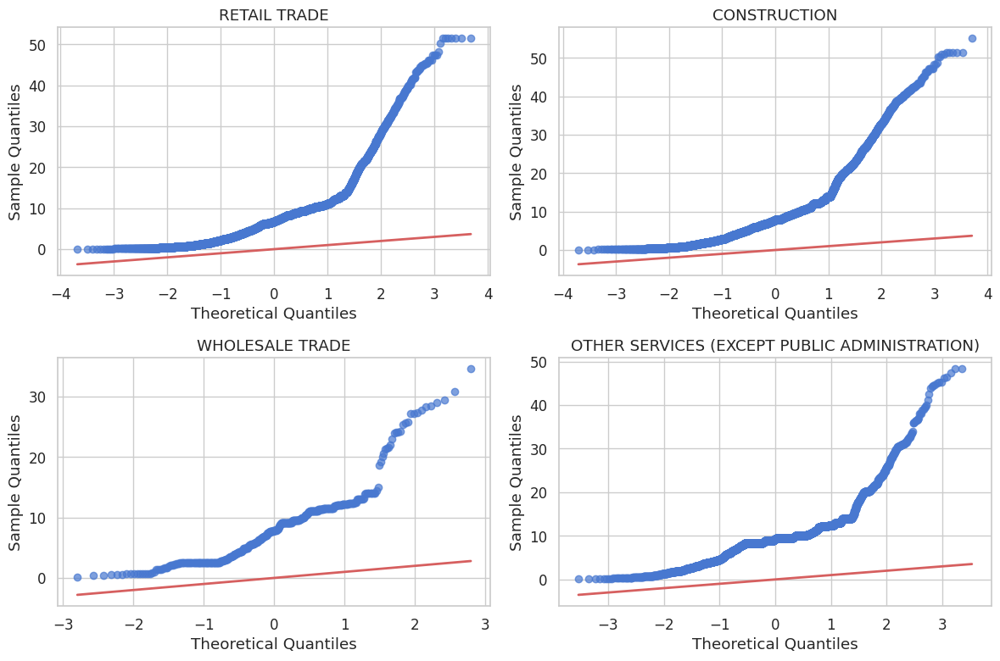

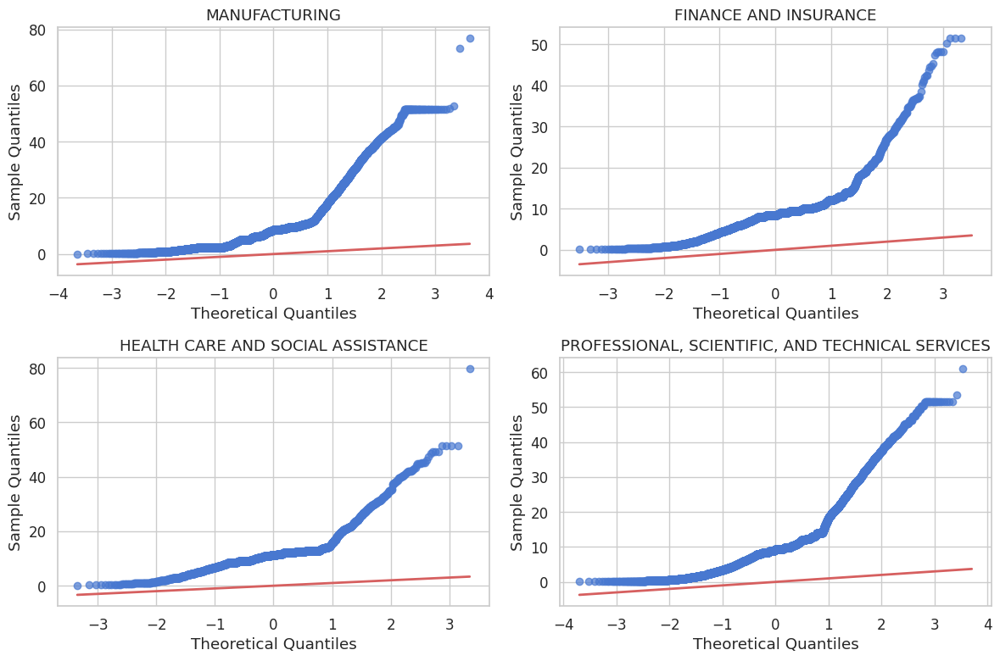

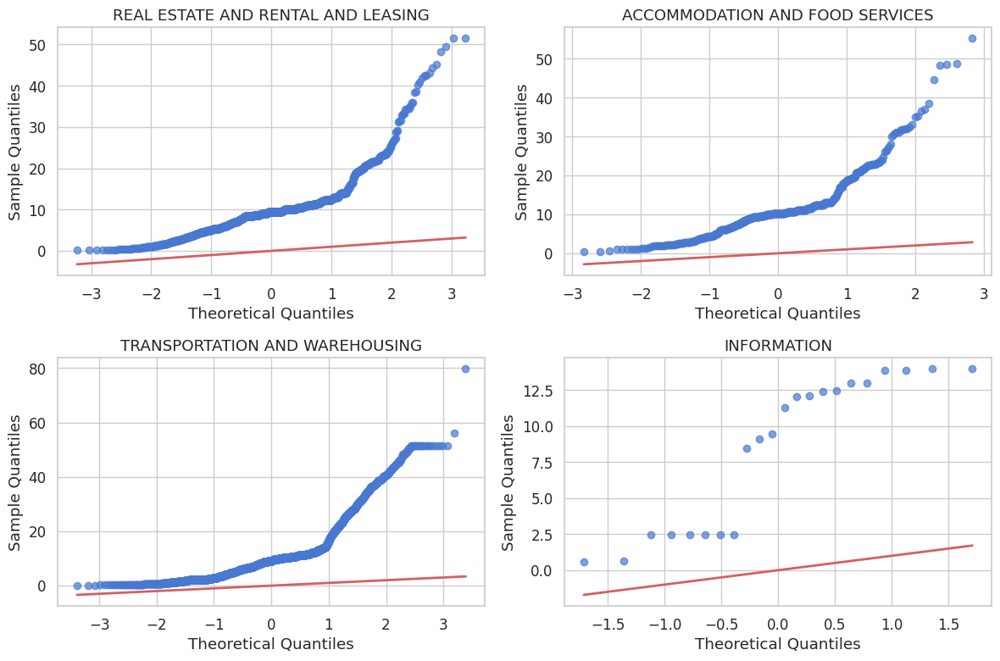

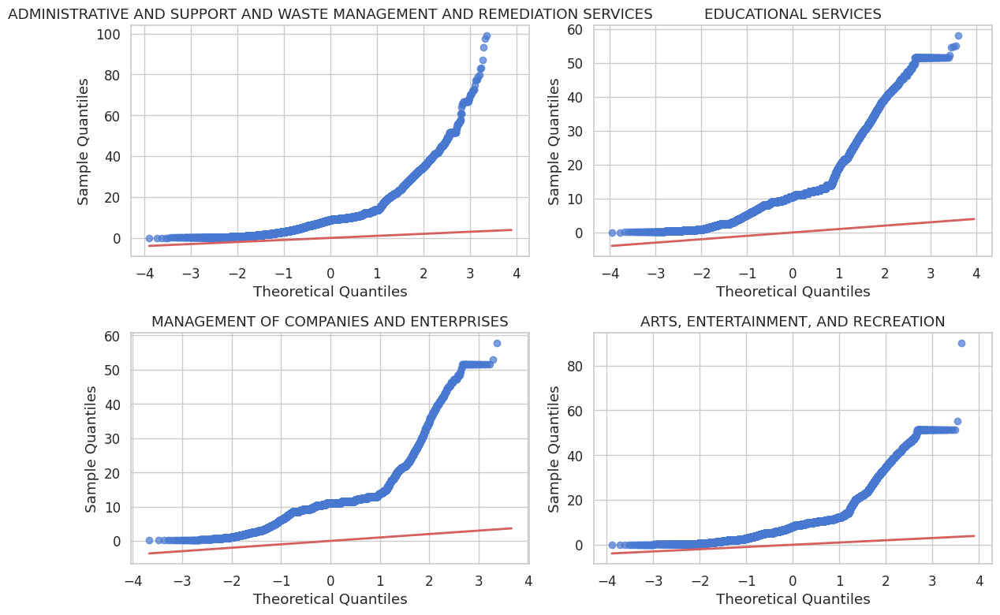

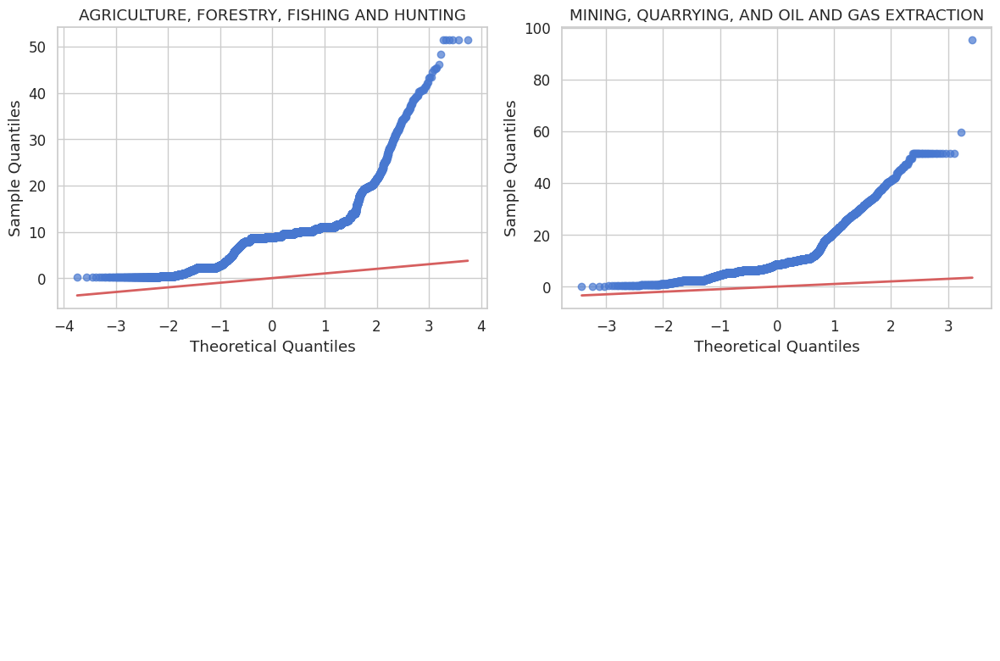

Business Age Q-Q plots by Ownership Type


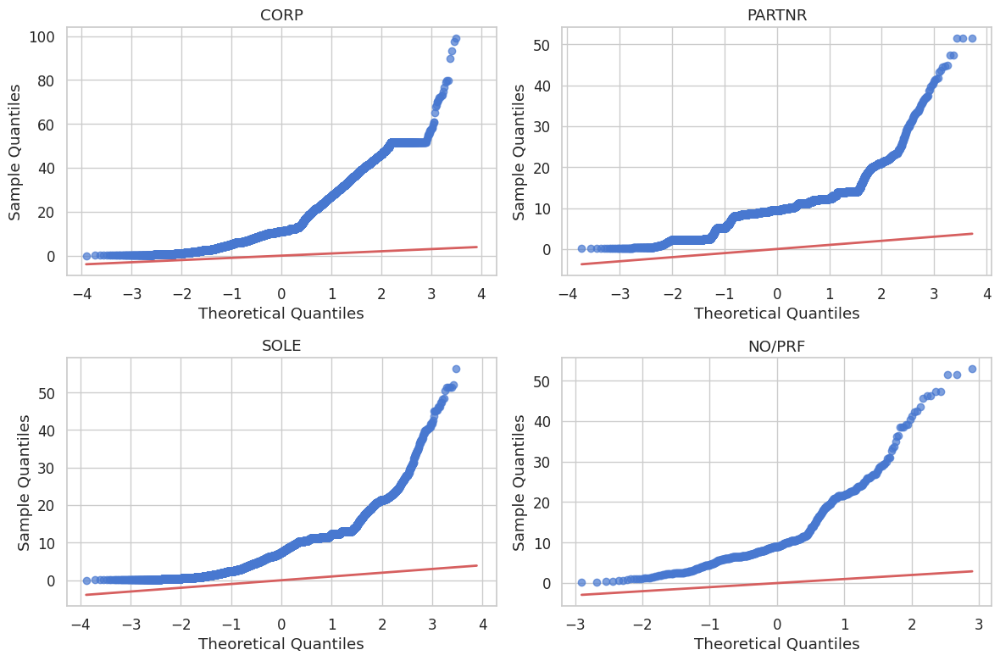

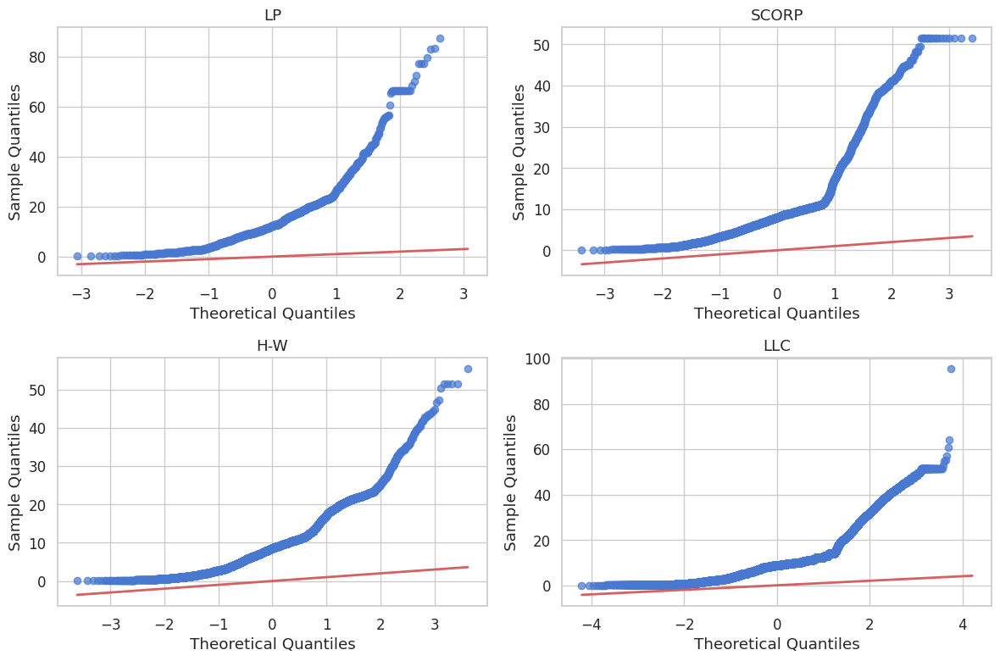

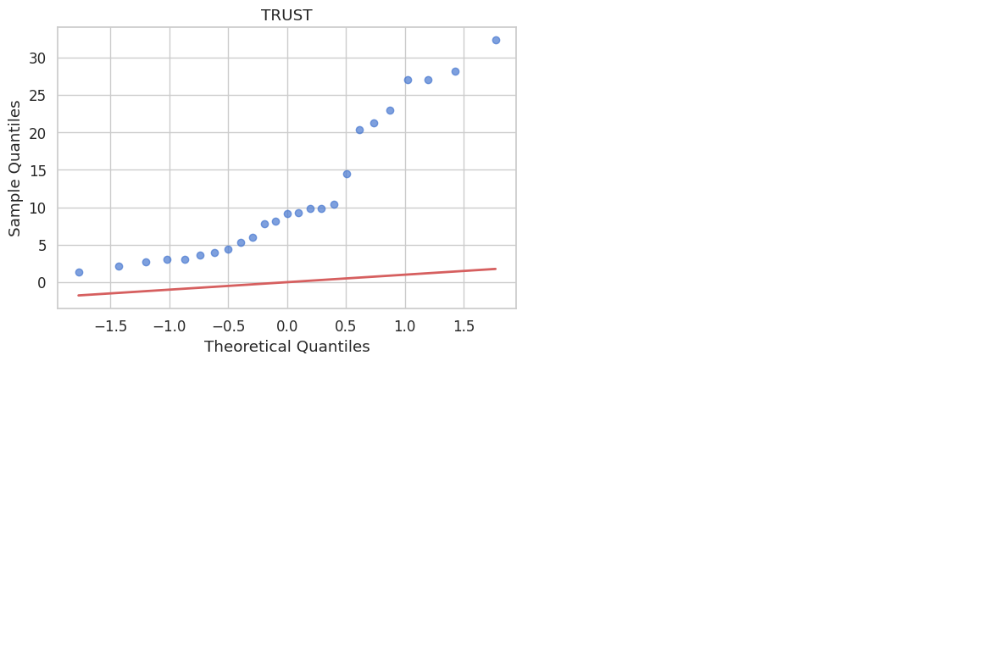

In [40]:
# ====================
# Business Age Q-Q plots
# ====================

def plot_qq_grid(groups, labels, ncols=2):
    n_groups = len(groups)
    nrows = math.ceil(n_groups / ncols)

    for start in range(0, n_groups, ncols * 2):  # 2 rows per figure
        fig, axes = plt.subplots(2, ncols, figsize=(12,8))
        axes = axes.flatten()

        for i, ax in enumerate(axes):
            idx = start + i
            if idx >= n_groups:
                ax.axis('off')
                continue

            g = groups[idx]

            # Correct Q-Q values
            qq = sm.ProbPlot(g)
            theoretical = qq.theoretical_quantiles
            sample = qq.sample_quantiles  # *** FIXED (this is the correct sample axis) ***

            # Correct Q-Q plot (theoretical on x, sample on y)
            ax.scatter(theoretical, sample, alpha=0.7)
            ax.plot(theoretical, theoretical, color='r', lw=2)  # correct 45° line

            ax.set_title(labels[idx])
            ax.set_xlabel("Theoretical Quantiles")
            ax.set_ylabel("Sample Quantiles")

        plt.tight_layout()
        plt.show()


# ====================
# NAICS Sector Q-Q plots
# ====================
print("Business Age Q-Q plots by NAICS Sector")

labels_sector = df['naics_sector_standard'].unique()
groups_sector = [g['business_age'].values for n, g in df.groupby('naics_sector_standard')]

# Use FULL GROUPS for Q-Q plots
plot_qq_grid(groups_sector, labels_sector, ncols=2)


# ====================
# Ownership Type Q-Q plots
# ====================
print("Business Age Q-Q plots by Ownership Type")

labels_own = df['ownership_type'].unique()
groups_own = [g['business_age'].values for n, g in df.groupby('ownership_type')]

# Use FULL GROUPS for Q-Q plots
plot_qq_grid(groups_own, labels_own, ncols=2)


Hypothesis Test: Business Age vs NAICS Sector
H0: Mean/median business age is the same across sectors
Ha: At least one sector has a different mean/median business age
Significance level: α = 0.05
Normality test (Shapiro-Wilk/K-S) passed for all groups: False
Levene test for equal variances: stat=169.99, p=0.00000 → Unequal variance
H-statistic = 7318.76
p-value = 0.00000
Conclusion: Reject H0 → At least one sector has a different business age
Note: Normality or equal variance violated → Kruskal-Wallis used


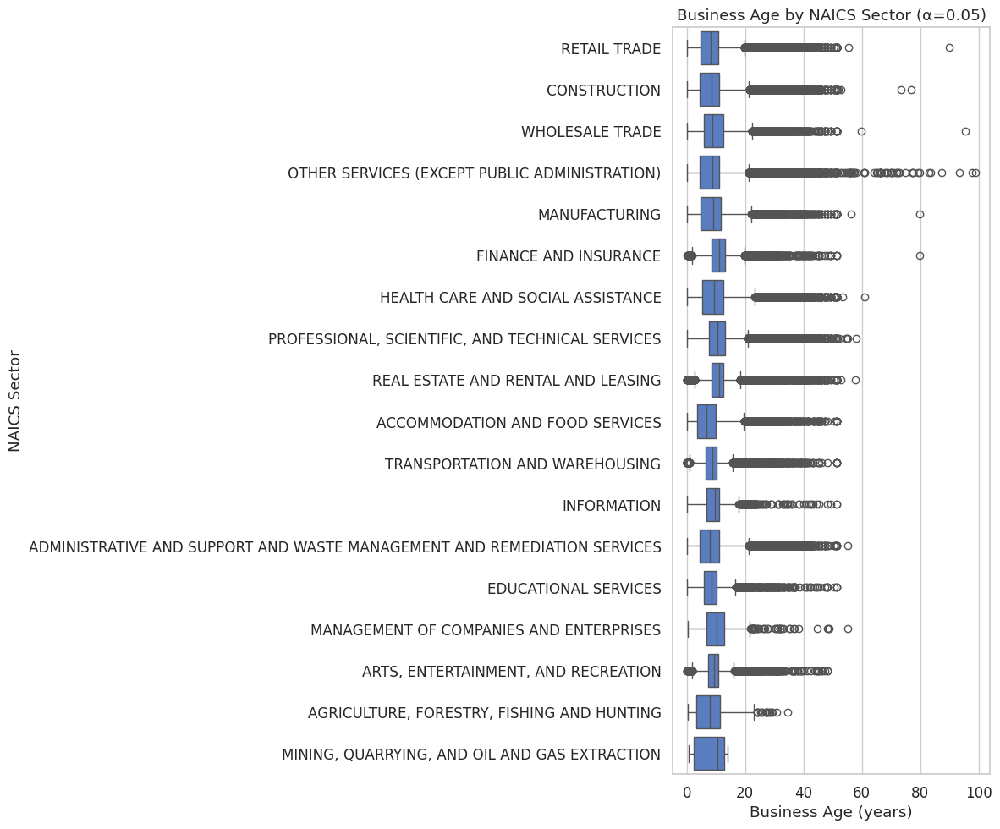

Post-hoc test results:


,ACCOMMODATION AND FOOD SERVICES,ADMINISTRATIVE AND SUPPORT AND WASTE MANAGEMENT AND REMEDIATION SERVICES,"AGRICULTURE, FORESTRY, FISHING AND HUNTING","ARTS, ENTERTAINMENT, AND RECREATION",CONSTRUCTION,EDUCATIONAL SERVICES,FINANCE AND INSURANCE,HEALTH CARE AND SOCIAL ASSISTANCE,INFORMATION,MANAGEMENT OF COMPANIES AND ENTERPRISES,MANUFACTURING,"MINING, QUARRYING, AND OIL AND GAS EXTRACTION",OTHER SERVICES (EXCEPT PUBLIC ADMINISTRATION),"PROFESSIONAL, SCIENTIFIC, AND TECHNICAL SERVICES",REAL ESTATE AND RENTAL AND LEASING,RETAIL TRADE,TRANSPORTATION AND WAREHOUSING,WHOLESALE TRADE
ACCOMMODATION AND FOOD SERVICES,1.000000e+00,2.365388e-46,7.501077e-02,5.561596e-119,2.006726e-64,8.283662e-49,1.152287e-296,1.735928e-200,6.975930e-63,4.542838e-37,1.502498e-77,1.0,4.425288e-117,0.000000e+00,0.000000e+00,6.550311e-58,1.753036e-69,4.288681e-82
ADMINISTRATIVE AND SUPPORT AND WASTE MANAGEMENT AND REMEDIATION SERVICES,2.365388e-46,1.000000e+00,1.000000e+00,3.946825e-28,4.182143e-02,1.613094e-01,4.207133e-167,1.046962e-56,3.383786e-17,4.483921e-16,5.066822e-17,1.0,1.314541e-08,0.000000e+00,1.971225e-290,1.000000e+00,7.911150e-01,4.239056e-17
"AGRICULTURE, FORESTRY, FISHING AND HUNTING",7.501077e-02,1.000000e+00,1.000000e+00,1.134850e-03,1.000000e+00,1.000000e+00,1.295228e-31,2.777518e-05,1.660279e-04,5.178902e-09,4.275300e-03,1.0,1.000000e+00,3.410895e-23,2.485634e-27,1.000000e+00,1.000000e+00,7.975868e-03
"ARTS, ENTERTAINMENT, AND RECREATION",5.561596e-119,3.946825e-28,1.134850e-03,1.000000e+00,7.696490e-13,1.134611e-09,1.524847e-64,1.000000e+00,1.000000e+00,9.007534e-04,1.000000e+00,1.0,5.204575e-12,5.746415e-79,1.127934e-81,6.297391e-37,4.596559e-19,1.000000e+00
CONSTRUCTION,2.006726e-64,4.182143e-02,1.000000e+00,7.696490e-13,1.000000e+00,1.000000e+00,3.638710e-130,3.628704e-28,2.640096e-09,8.838422e-12,1.626361e-07,1.0,1.000000e+00,9.740395e-242,4.304720e-205,4.504003e-04,1.000000e+00,3.935829e-07
EDUCATIONAL SERVICES,8.283662e-49,1.613094e-01,1.000000e+00,1.134611e-09,1.000000e+00,1.000000e+00,4.208293e-111,6.120492e-20,5.637528e-08,3.597646e-11,5.720462e-06,1.0,1.000000e+00,1.961401e-159,6.712198e-152,8.542903e-03,1.000000e+00,1.558041e-05
FINANCE AND INSURANCE,1.152287e-296,4.207133e-167,1.295228e-31,1.524847e-64,3.638710e-130,4.208293e-111,1.000000e+00,4.883674e-65,4.830770e-32,1.963822e-02,2.663123e-54,1.0,1.599020e-142,1.210834e-07,1.515550e-01,1.138557e-191,1.564655e-151,2.102967e-60
HEALTH CARE AND SOCIAL ASSISTANCE,1.735928e-200,1.046962e-56,2.777518e-05,1.000000e+00,3.628704e-28,6.120492e-20,4.883674e-65,1.000000e+00,1.000000e+00,1.309851e-02,1.000000e+00,1.0,3.527329e-33,9.205037e-104,5.696745e-95,9.053289e-82,1.826689e-42,1.000000e+00
INFORMATION,6.975930e-63,3.383786e-17,1.660279e-04,1.000000e+00,2.640096e-09,5.637528e-08,4.830770e-32,1.000000e+00,1.000000e+00,7.364921e-02,1.000000e+00,1.0,7.101534e-08,3.449996e-22,8.461102e-29,6.935292e-20,3.824766e-12,1.000000e+00
MANAGEMENT OF COMPANIES AND ENTERPRISES,4.542838e-37,4.483921e-16,5.178902e-09,9.007534e-04,8.838422e-12,3.597646e-11,1.963822e-02,1.309851e-02,7.364921e-02,1.000000e+00,6.788252e-04,1.0,1.237642e-10,1.000000e+00,1.000000e+00,4.756974e-17,2.939654e-13,2.236946e-04


Hypothesis Test: Business Age vs Ownership Type
H0: Mean/median business age is the same across ownership types
Ha: At least one ownership type has a different mean/median business age
Significance level: α = 0.05
Normality test (Shapiro-Wilk/K-S) passed for all groups: False
Levene test for equal variances: stat=1167.70, p=0.00000 → Unequal variance
H-statistic = 6349.01
p-value = 0.00000
Conclusion: Reject H0 → At least one ownership type has a different mean/median business age
Note: Normality or equal variance violated → Kruskal-Wallis used


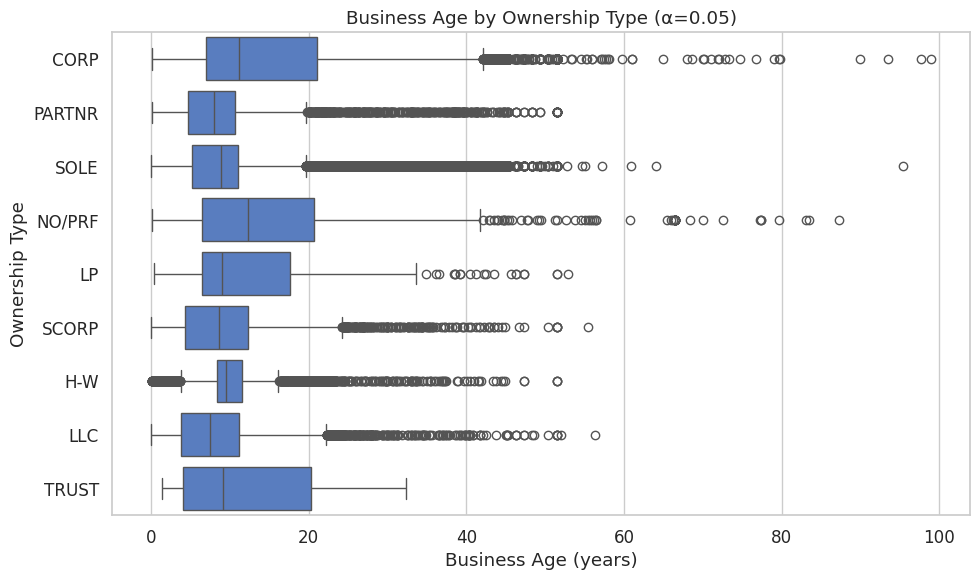

Post-hoc test results:


,CORP,H-W,LLC,LP,NO/PRF,PARTNR,SCORP,SOLE,TRUST
CORP,1.000000e+00,3.230797e-125,0.000000e+00,3.333768e-09,1.000000e+00,6.253005e-193,3.695854e-287,0.000000e+00,1.0
H-W,3.230797e-125,1.000000e+00,5.944081e-223,1.000000e+00,3.532862e-14,1.818514e-44,5.680077e-44,8.514137e-110,1.0
LLC,0.000000e+00,5.944081e-223,1.000000e+00,9.892764e-18,2.317305e-84,1.235207e-04,4.756533e-30,1.939687e-81,1.0
LP,3.333768e-09,1.000000e+00,9.892764e-18,1.000000e+00,1.619006e-05,5.094284e-09,1.611894e-05,1.304504e-06,1.0
NO/PRF,1.000000e+00,3.532862e-14,2.317305e-84,1.619006e-05,1.000000e+00,2.449045e-50,6.493456e-44,1.043634e-51,1.0
PARTNR,6.253005e-193,1.818514e-44,1.235207e-04,5.094284e-09,2.449045e-50,1.000000e+00,2.766565e-02,3.156068e-02,1.0
SCORP,3.695854e-287,5.680077e-44,4.756533e-30,1.611894e-05,6.493456e-44,2.766565e-02,1.000000e+00,1.000000e+00,1.0
SOLE,0.000000e+00,8.514137e-110,1.939687e-81,1.304504e-06,1.043634e-51,3.156068e-02,1.000000e+00,1.000000e+00,1.0
TRUST,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.0


In [43]:
# =======================================
# Business Age vs NAICS Sector
# =======================================

print("Hypothesis Test: Business Age vs NAICS Sector")

# Prepare groups
clean_groups_sector = []
clean_labels_sector = []

for name, g in df.groupby('naics_sector_standard'):
    values = (
        g['business_age']
        .replace([np.inf, -np.inf], np.nan)
        .dropna()
        .values
    )

    # Keep only valid groups
    if len(values) >= 2 and np.var(values) > 0:
        clean_groups_sector.append(values)
        clean_labels_sector.append(name)

groups_sector = clean_groups_sector
labels_sector = clean_labels_sector

# --- Normality test logic ---
normality_sector = []
for g in groups_sector:
    if len(g) < 5000:
        # Shapiro–Wilk
        p = stats.shapiro(g)[1]
    else:
        # Kolmogorov–Smirnov against Normal(μ, σ)
        mu, sigma = np.mean(g), np.std(g, ddof=1)
        p = stats.kstest(g, 'norm', args=(mu, sigma))[1]
    normality_sector.append(p > 0.05)

# Homogeneity of variance
levene_stat, levene_p = stats.levene(*groups_sector)
equal_variance = levene_p > 0.05

if all(normality_sector) and equal_variance:
    # Parametric ANOVA
    f_stat, p_value = stats.f_oneway(*groups_sector)
    posthoc = sp.posthoc_tukey(df, val_col='business_age', group_col='naics_sector_standard')
    stat_name = "F"
    assumption_note = "Normality and equal variance assumptions satisfied → ANOVA used"
else:
    # Non-parametric Kruskal-Wallis
    h_stat, p_value = stats.kruskal(*groups_sector)
    posthoc = sp.posthoc_dunn(df, val_col='business_age', group_col='naics_sector_standard', p_adjust='bonferroni')
    stat_name = "H"
    assumption_note = "Normality or equal variance violated → Kruskal-Wallis used"

conclusion = (
    "Reject H0 → At least one sector has a different business age"
    if p_value < alpha
    else "Fail to Reject H0 → Business age is similar across sectors"
)

print("H0: Mean/median business age is the same across sectors")
print("Ha: At least one sector has a different mean/median business age")
print(f"Significance level: α = {alpha}")
print(f"Normality test (Shapiro-Wilk/K-S) passed for all groups: {all(normality_sector)}")
print(f"Levene test for equal variances: stat={levene_stat:.2f}, p={levene_p:.5f} → {'Equal variance' if equal_variance else 'Unequal variance'}")
print(f"{stat_name}-statistic = {f_stat if all(normality_sector) and equal_variance else h_stat:.2f}")
print(f"p-value = {p_value:.5f}")
print(f"Conclusion: {conclusion}")
print(f"Note: {assumption_note}")

# Visualization (horizontal boxplot)
plt.figure(figsize=(12,10))
sns.boxplot(y='naics_sector_standard', x='business_age', data=df)
plt.xlabel("Business Age (years)")
plt.ylabel("NAICS Sector")
plt.title(f"Business Age by NAICS Sector (α={alpha})")
plt.tight_layout()
plt.show()

print("Post-hoc test results:")
display(posthoc)


# =======================================
# Business Age vs Ownership Type
# =======================================

print("Hypothesis Test: Business Age vs Ownership Type")

# Prepare groups
clean_groups_own = []
clean_labels_own = []

for name, g in df.groupby('ownership_type'):
    values = g['business_age'].dropna().values

    # Keep only valid groups
    if len(values) >= 2 and np.var(values) > 0:
        clean_groups_own.append(values)
        clean_labels_own.append(name)

groups_own = clean_groups_own
labels_own = clean_labels_own


# =======================================
# Normality Tests (Shapiro < 5000, KS >= 5000)
# =======================================

normality_own = []
for g in groups_own:
    if len(g) < 5000:
        # Shapiro–Wilk
        p = stats.shapiro(g)[1]
    else:
        # Kolmogorov–Smirnov against Normal(μ, σ)
        mu, sigma = np.mean(g), np.std(g, ddof=1)
        p = stats.kstest(g, 'norm', args=(mu, sigma))[1]
    normality_own.append(p > 0.05)

# Homogeneity of variance
levene_stat_own, levene_p_own = stats.levene(*groups_own)
equal_variance_own = (levene_p_own > 0.05)

if all(normality_own) and equal_variance_own:
    # Parametric ANOVA
    f_stat, p_value = stats.f_oneway(*groups_own)
    posthoc = sp.posthoc_tukey(df, val_col='business_age', group_col='ownership_type')
    stat_name = "F"
    assumption_note = "Normality and equal variance assumptions satisfied → ANOVA used"
else:
    # Non-parametric Kruskal-Wallis
    h_stat, p_value = stats.kruskal(*groups_own)
    posthoc = sp.posthoc_dunn(df, val_col='business_age', group_col='ownership_type', p_adjust='bonferroni')
    stat_name = "H"
    assumption_note = "Normality or equal variance violated → Kruskal-Wallis used"

conclusion = (
    "Reject H0 → At least one ownership type has a different mean/median business age"
    if p_value < alpha
    else "Fail to Reject H0 → Business age is similar across ownership types"
)

print("H0: Mean/median business age is the same across ownership types")
print("Ha: At least one ownership type has a different mean/median business age")
print(f"Significance level: α = {alpha}")
print(f"Normality test (Shapiro-Wilk/K-S) passed for all groups: {all(normality_own)}")
print(f"Levene test for equal variances: stat={levene_stat_own:.2f}, p={levene_p_own:.5f} → {'Equal variance' if equal_variance_own else 'Unequal variance'}")
print(f"{stat_name}-statistic = {f_stat if all(normality_own) and equal_variance_own else h_stat:.2f}")
print(f"p-value = {p_value:.5f}")
print(f"Conclusion: {conclusion}")
print(f"Note: {assumption_note}")

# Visualization (horizontal boxplot)
plt.figure(figsize=(10,6))
sns.boxplot(y='ownership_type', x='business_age', data=df)
plt.xlabel("Business Age (years)")
plt.ylabel("Ownership Type")
plt.title(f"Business Age by Ownership Type (α={alpha})")
plt.tight_layout()
plt.show()

print("Post-hoc test results:")
display(posthoc)


*   **Possible Association: Number of Active Business vs Population**

Hypothesis Test: Number of Active Business vs Population
Shapiro-Wilk: p = 0.00008 → Not normal
Shapiro-Wilk: p = 0.00000 → Not normal


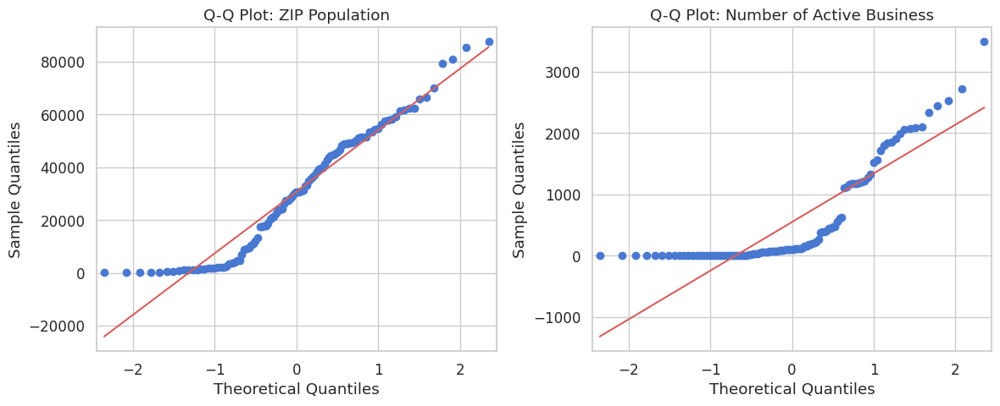

Method: Spearman
Correlation coefficient = 0.6525735632588089
p-value = 3.480316750606514e-14
Conclusion: Reject H0 → Population and Number of Active Business are significantly correlated


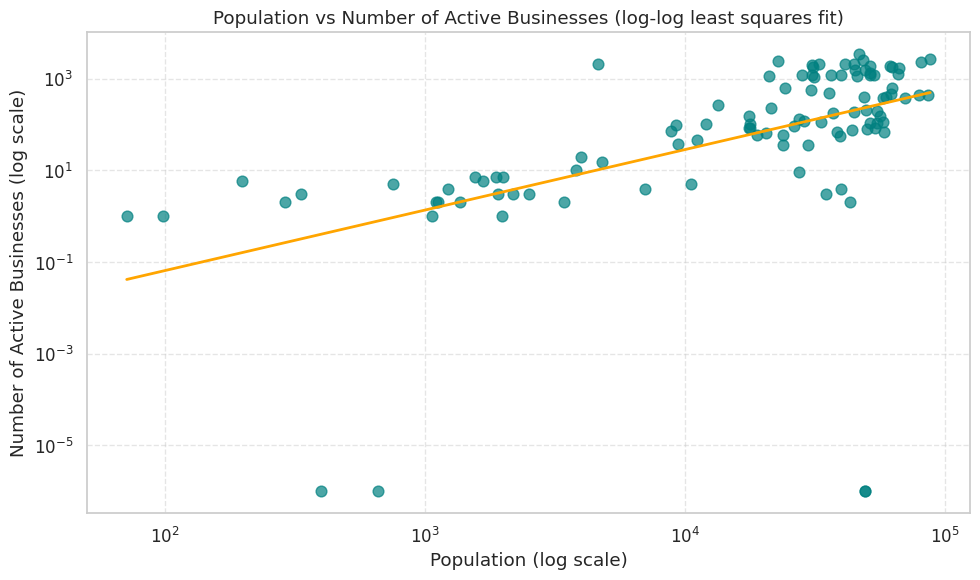

Log-log slope: 1.319
---Interpretation---
Negative Slope → Number of Active Business Decreases when Population Increases
Slope ≈ 0 → Constant
Positive Slope → Number of Active Business Increases when population Increases


In [ ]:
# =======================================
# Association: Number of Active Business vs  Population
# =======================================

print("Hypothesis Test: Number of Active Business vs Population")

# Prepare the variables
x_data = zip_data_active['population'].astype(float)
y_data = zip_data_active['business_count'].astype(float)

# =======================================
# Clean data before running any tests
# =======================================

# Drop missing, infinite, or negative values
valid_mask = (
    x_data.notna() &
    y_data.notna() &
    np.isfinite(x_data) &
    np.isfinite(y_data) &
    (x_data > 0) &
    (y_data >= 0)
)

x_data = x_data[valid_mask]
y_data = y_data[valid_mask]

# If the data is all zeros, add a tiny epsilon to prevent constant-array failures
if y_data.nunique() <= 1:
    y_data= y_data + 1e-6

# Convert to numpy arrays
x_data = x_data.values
y_data= y_data.values

# =======================================
# Normality Tests (Shapiro < 5000, KS >= 5000)
# =======================================

def normality_test(arr):
    n = len(arr)

    if n < 3:
        return False, "Too small for a test"

    # Shapiro-Wilk
    if n < 5000:
        stat, p = stats.shapiro(arr)
        method = "Shapiro-Wilk"
        normal = p > alpha
        return normal, f"{method}: p = {p:.5f} → {'Normal' if normal else 'Not normal'}"

    # Kolmogorov-Smirnov against Normal(μ, σ)
    else:
        # Standardize the data
        mu, sigma = np.mean(arr), np.std(arr)
        if sigma == 0:
            return False, "KS Test failed (zero variance)"

        z = (arr - mu) / sigma

        stat, p = stats.kstest(z, 'norm')
        method = "Kolmogorov–Smirnov"
        normal = p > alpha
        return normal, f"{method}: p = {p:.5f} → {'Normal' if normal else 'Not normal'}"

# Run both tests
x_normal, x_norm_msg = normality_test(x_data)
y_normal, y_norm_msg = normality_test(y_data)

print(x_norm_msg)
print(y_norm_msg)

# =======================================
# Q-Q Plots (visual check)
# =======================================

plt.figure(figsize=(12,5))

# Q-Q plot for population
plt.subplot(1,2,1)
sm.qqplot(x_data, line='s', ax=plt.gca())
plt.title('Q-Q Plot: ZIP Population')

# Q-Q plot for active business
plt.subplot(1,2,2)
sm.qqplot(y_data, line='s', ax=plt.gca())
plt.title('Q-Q Plot: Number of Active Business')

plt.tight_layout()
plt.show()

# =======================================
# Choose correlation test
# =======================================

if x_data.size < 3 or y_data.size < 3 or x_data.std() == 0 or y_data.std() == 0:
    corr_coeff = np.nan
    p_value = np.nan
    method = "Correlation failed (insufficient variation)"
else:
    if x_normal and y_normal:
        # Pearson correlation (parametric)
        corr_coeff, p_value = stats.pearsonr(x_data, y_data)
        method = "Pearson"
    else:
        # Spearman correlation (non-parametric)
        corr_coeff, p_value = stats.spearmanr(x_data, y_data)
        method = "Spearman"

# =======================================
# Conclusion
# =======================================

if np.isnan(p_value):
    conclusion = "Test could not be computed → insufficient variation or invalid data"
else:
    conclusion = (
        f"Reject H0 → Population and Number of Active Business are significantly correlated"
        if p_value < alpha
        else f"Fail to Reject H0 → No significant correlation"
    )

print(f"Method: {method}")
print(f"Correlation coefficient = {corr_coeff if not np.isnan(corr_coeff) else 'NaN'}")
print(f"p-value = {p_value if not np.isnan(p_value) else 'NaN'}")
print(f"Conclusion: {conclusion}")


# =======================================
# Visualization: Population vs Number of Active Business (Log-log Scatter with Least Squares Fit)
# =======================================


# Copy data to avoid modifying original
df_plot = zip_data_active[['population', 'business_count']].copy()

# Replace missing or zero values with a small constant
df_plot['population'] = df_plot['population'].fillna(1e-6)
df_plot['business_count'] = df_plot['business_count'].fillna(0) + 1e-6

# Remove any rows with negative or non-finite values (just in case)
df_plot = df_plot[(df_plot['population'] > 0) & (df_plot['business_count'] > 0)]
df_plot = df_plot[np.isfinite(df_plot['population']) & np.isfinite(df_plot['business_count'])]

# Log-transform
x = np.log(df_plot['population'])
y = np.log(df_plot['business_count'])

# Least squares fit
slope, intercept = np.polyfit(x, y, 1)
y_fit = slope * x + intercept

# Plot
plt.figure(figsize=(10,6))
plt.scatter(df_plot['population'], df_plot['business_count'], s=60, color='teal', alpha=0.7)
plt.plot(df_plot['population'], np.exp(y_fit), color='orange', lw=2)  # back-transform to original scale

plt.xscale('log')
plt.yscale('log')
plt.xlabel('Population (log scale)')
plt.ylabel('Number of Active Businesses (log scale)')
plt.title('Population vs Number of Active Businesses (log-log least squares fit)')
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()

print(f"Log-log slope: {slope:.3f}")
print("---Interpretation---")
print("Negative Slope → Number of Active Business Decreases when Population Increases")
print("Slope ≈ 0 → Constant")
print("Positive Slope → Number of Active Business Increases when population Increases")


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 140738 entries, 0 to 140737
Data columns (total 16 columns):
 #   Column                 Non-Null Count   Dtype         
---  ------                 --------------   -----         
 0   ownership_type         140738 non-null  object        
 1   date_business_start    140738 non-null  datetime64[ns]
 2   address_city           140738 non-null  object        
 3   address_state          140738 non-null  object        
 4   lat                    140738 non-null  float64       
 5   lng                    140738 non-null  float64       
 6   zip5                   140738 non-null  int64         
 7   population             140738 non-null  float64       
 8   naics_sector_standard  140738 non-null  object        
 9   business_status        140738 non-null  object        
 10  raw_business_start     140738 non-null  object        
 11  business_start_year    140738 non-null  int32         
 12  business_age           140721 non-null  floa

# **Preprocessing Modeling Data**

* **Add columns for Visualizations**

In [ ]:
# Drop business_density if it exists
if 'business_density' in df.columns:
    df = df.drop(columns=['business_density'])

# Compute business_density by zip
zip_counts = df.groupby('zip5').size().rename('business_count').reset_index()
zip_pop = df[['zip5', 'population']].drop_duplicates()
zip_density = pd.merge(zip_counts, zip_pop, on='zip5', how='left')
zip_density['business_density'] = zip_density['business_count'] / zip_density['population'] * 1000

# Merge business_density into model_df safely
df = df.merge(zip_density[['zip5', 'business_density']], on='zip5', how='left')

In [ ]:
# Load ZCTA shapefile again
zcta_gdf = gpd.read_file("zip://cb_2020_us_zcta520_500k.zip")

# Check the columns
print(zcta_gdf.columns)

# ZCTA
zcta_gdf.info()


Index(['ZCTA5CE20', 'AFFGEOID20', 'GEOID20', 'NAME20', 'LSAD20', 'ALAND20',
       'AWATER20', 'geometry'],
      dtype='object')
<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 33791 entries, 0 to 33790
Data columns (total 8 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   ZCTA5CE20   33791 non-null  object  
 1   AFFGEOID20  33791 non-null  object  
 2   GEOID20     33791 non-null  object  
 3   NAME20      33791 non-null  object  
 4   LSAD20      33791 non-null  object  
 5   ALAND20     33791 non-null  int64   
 6   AWATER20    33791 non-null  int64   
 7   geometry    33791 non-null  geometry
dtypes: geometry(1), int64(2), object(5)
memory usage: 2.1+ MB


In [ ]:
# =======================================
# Ensure ZIP codes are strings (5 digits)
# =======================================

df['zip5'] = df['zip5'].astype(str).str.zfill(5)
# Optional: remove any commas or spaces
df['zip5'] = df['zip5'].str.replace(",", "").str.strip()

# =======================================
# Ensure ZCTA codes are strings
# =======================================
zcta_gdf['ZCTA5CE20'] = zcta_gdf['ZCTA5CE20'].astype(str).str.zfill(5)

# =======================================
# Filter businesses to only ZCTAs present in shapefile
# =======================================
zcta_list = zcta_gdf['ZCTA5CE20'].unique()
df_filtered = df[df['zip5'].isin(zcta_list)].copy()

print(f"Original businesses: {len(df)}")
print(f"After filtering with ZCTA: {len(df_filtered)}")

# =======================================
# Check for ZIPs not in ZCTA
# =======================================
missing_zips = df[~df['zip5'].isin(zcta_list)]['zip5'].unique()
if len(missing_zips) > 0:
    print(f"⚠️ These ZIPs are NOT in the ZCTA shapefile: {missing_zips}")
else:
    print("✅ All ZIPs match ZCTA shapefile.")

# =======================================
# Export cleaned dataframe for Modeling
# =======================================

df_filtered.to_csv("Modeling_San_Diego_Business_Survival.csv", index=False)

print("✅ San_Diego_Business dataset for Modeling saved as 'Modeling_San_Diego_Business_Survival.csv'")


Original businesses: 140738
After filtering with ZCTA: 140738
✅ All ZIPs match ZCTA shapefile.
✅ San_Diego_Business dataset for Modeling saved as 'Modeling_San_Diego_Business_Survival.csv'


In [ ]:
# Dataset info
df_filtered.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 140738 entries, 0 to 140737
Data columns (total 17 columns):
 #   Column                 Non-Null Count   Dtype         
---  ------                 --------------   -----         
 0   ownership_type         140738 non-null  object        
 1   date_business_start    140738 non-null  datetime64[ns]
 2   address_city           140738 non-null  object        
 3   address_state          140738 non-null  object        
 4   lat                    140738 non-null  float64       
 5   lng                    140738 non-null  float64       
 6   zip5                   140738 non-null  object        
 7   population             140738 non-null  float64       
 8   naics_sector_standard  140738 non-null  object        
 9   business_status        140738 non-null  object        
 10  raw_business_start     140738 non-null  object        
 11  business_start_year    140738 non-null  int32         
 12  business_age           140720 non-null  floa

# **Modeling**

**Preparing data for Models**

---



In [ ]:
# Upload DF as Tableau_San_Diego_Business
model_df=pd.read_csv("Modeling_San_Diego_Business_Survival.csv")
model_df.head()

,ownership_type,date_business_start,address_city,address_state,lat,lng,zip5,population,naics_sector_standard,business_status,raw_business_start,business_start_year,business_age,business_status_num,age_rounded,age_group,business_density
0,CORP,1974-07-01 12:00:00,SAN DIEGO,CA,32.806283,-117.120553,92123,30939.0,RETAIL TRADE,ACTIVE,1974-07-01 12:00:00,1974,51.444216,1,51.0,20+,124.470733
1,CORP,1974-07-01 12:00:00,EL CAJON,CA,32.808827,-116.977019,92020,61798.0,CONSTRUCTION,ACTIVE,1974-07-01 12:00:00,1974,51.444216,1,51.0,20+,13.981035
2,CORP,1974-07-01 12:00:00,SAN DIEGO,CA,32.830715,-117.134597,92123,30939.0,WHOLESALE TRADE,ACTIVE,1974-07-01 12:00:00,1974,51.444216,1,51.0,20+,124.470733
3,CORP,1974-07-01 12:00:00,SAN DIEGO,CA,32.898905,-117.109826,92131,36332.0,WHOLESALE TRADE,ACTIVE,1974-07-01 12:00:00,1974,51.444216,1,51.0,20+,73.956842
4,CORP,1974-07-01 12:00:00,SAN DIEGO,CA,32.780493,-117.113806,92108,22762.0,OTHER SERVICES (EXCEPT PUBLIC ADMINISTRATION),ACTIVE,1974-07-01 12:00:00,1974,51.444216,1,51.0,20+,242.816976


*  **Getting data prepared & Feature Collinearity (VIF)**

In [ ]:
# =======================================
# Define features
# =======================================
features_num = ['business_age', 'population', 'lat', 'lng', 'business_density']
features_cat = ['ownership_type', 'naics_sector_standard', 'address_city']
target = 'business_status_num'  # 1=Active, 0=Closed

# Check for infinite values
inf_counts = model_df[features_num].isin([np.inf, -np.inf]).sum()
print("Infinite values per numeric feature:")
display(inf_counts)
# Check for zero variance
zero_var_cols = model_df[features_num].nunique()
print("Number of unique values per numeric feature:")
display(zero_var_cols)


Infinite values per numeric feature:


,0
business_age,0
population,0
lat,0
lng,0
business_density,21


Number of unique values per numeric feature:


,0
business_age,11017
population,107
lat,79224
lng,76403
business_density,107


In [ ]:
# =======================================
# VIF CALCULATION FOR NUMERIC FEATURES
# =======================================

# Copy numeric features
X_num_for_vif = model_df[features_num].copy()

# Replace infinite values with NaN (from business_density / population = 0)
X_num_for_vif.replace([np.inf, -np.inf], np.nan, inplace=True)

# Drop rows with any NaN or inf
X_num_for_vif_clean = X_num_for_vif.dropna()

# Keep aligned model_df for modeling
model_df_clean = model_df.loc[X_num_for_vif_clean.index]

# Add constant for VIF calculation
X_num_const = sm.add_constant(X_num_for_vif_clean)

# Compute VIF
vif_data = pd.DataFrame({
    "feature": X_num_for_vif_clean.columns,
    "VIF": [variance_inflation_factor(X_num_const.values, i+1)  # +1 because constant is at index 0
            for i in range(X_num_for_vif_clean.shape[1])]
})

print("VIF values for numeric features:")
display(vif_data)

# =======================================
# Cleaned model_df is now ready for modeling
# =======================================
print("Cleaned model_df shape:", model_df_clean.shape)


VIF values for numeric features:


,feature,VIF
0,business_age,1.007414
1,population,1.394640
2,lat,1.109249
3,lng,1.195782
4,business_density,1.340506


Cleaned model_df shape: (140699, 17)


*** No problematic Multicolinearity (VIF < 5) in numerical variables ***

---



* **Spatial Analysis: Filtering lng and lat in the San Diego County shapefile**

In [ ]:
# =======================================
# Geographic filtering for lng and lat
# =======================================

# Load San Diego County boundary From https://www2.census.gov/geo/tiger/GENZ2022/shp/ then file : cb_2022_us_county_500k.zip (as 11/21/2025)
zip_path = "cb_2022_us_county_500k.zip"
counties_gdf = gpd.read_file(f"zip://{zip_path}")
sd_county = counties_gdf[counties_gdf['NAME'] == 'San Diego']

# Convert model_df → GeoDataFrame
geometry = [Point(xy) for xy in zip(model_df_clean['lng'], model_df_clean['lat'])]
gdf = gpd.GeoDataFrame(model_df_clean, geometry=geometry, crs="EPSG:4326")

# Use unary_union for within()
gdf_sd = gdf[gdf.within(sd_county.unary_union)].copy()

# Convert back to normal DataFrame
model_df_sd = pd.DataFrame(gdf_sd.drop(columns='geometry'))

print(f"Original dataset size: {len(model_df_clean)}")
print(f"Filtered to San Diego County: {len(model_df_sd)}")

Original dataset size: 140699
Filtered to San Diego County: 140699


*  **Split TRAIN/TEST data & SMOTE**

In [ ]:
# =======================================
# Clean numeric features in model_df_sd
# =======================================
# Replace inf/-inf with NaN
model_df_sd[features_num] = model_df_sd[features_num].replace([np.inf, -np.inf], np.nan)

# Drop rows with NaN in numeric features
model_df_sd = model_df_sd.dropna(subset=features_num).reset_index(drop=True)

# =======================================
# Split train/test
# =======================================
X = model_df_sd[features_num + features_cat]
y = model_df_sd[target]

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

# =======================================
# Preprocessing pipelines
# =======================================
num_transformer = StandardScaler()
cat_transformer = OneHotEncoder(handle_unknown='ignore', sparse_output=False)

preprocessor = ColumnTransformer(
    transformers=[
        ('num', num_transformer, features_num),
        ('cat', cat_transformer, features_cat)
    ]
)

# =======================================
# Preprocess training and test data
# =======================================
X_train_preprocessed = preprocessor.fit_transform(X_train)
X_test_preprocessed = preprocessor.transform(X_test)

# =======================================
# Apply SMOTE to balance classes
# =======================================
smote = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train_preprocessed, y_train)

# =======================================
# Check shapes and class balance
# =======================================
print("Original training shape:", X_train.shape)
print("Training shape after preprocessing:", X_train_preprocessed.shape)
print("Training shape after SMOTE:", X_train_resampled.shape)
print("Test shape after preprocessing:", X_test_preprocessed.shape)

print("\nClass distribution before SMOTE:", Counter(y_train))
print("Class distribution after SMOTE:", Counter(y_train_resampled))


Original training shape: (112559, 8)
Training shape after preprocessing: (112559, 73)
Training shape after SMOTE: (132168, 73)
Test shape after preprocessing: (28140, 73)

Class distribution before SMOTE: Counter({0: 66084, 1: 46475})
Class distribution after SMOTE: Counter({1: 66084, 0: 66084})


* **Save DataFrame for Modeling**

In [ ]:
# =======================================
# Create Modeling DataFrame for reproducibility
# =======================================

# Get feature names after preprocessing
feature_names = features_num + list(preprocessor.named_transformers_['cat'].get_feature_names_out(features_cat))

# Build DataFrame from SMOTE-resampled training data
modeling_df = pd.DataFrame(X_train_resampled, columns=feature_names)
modeling_df[target] = y_train_resampled.values

# Save modeling-ready DataFrame
modeling_df.to_csv("TrainData_SanDiego_Business_Survival.csv", index=False)
print("✅ Final modeling dataset saved")
print("Shape:", modeling_df.shape)

# Optional: save test set as separate CSV
X_test_df = pd.DataFrame(X_test_preprocessed, columns=feature_names)
X_test_df[target] = y_test.values
X_test_df.to_csv("TestData_SanDiego_Business_Survival.csv", index=False)

# Save preprocessing pipeline and SMOTE for reproducibility
joblib.dump(preprocessor, "preprocessor.pkl")
joblib.dump(smote, "smote.pkl")


✅ Final modeling dataset saved
Shape: (132168, 74)


['smote.pkl']

*  **Modeling with hyperparameters & Cross-Validation**


Training: LogisticRegression


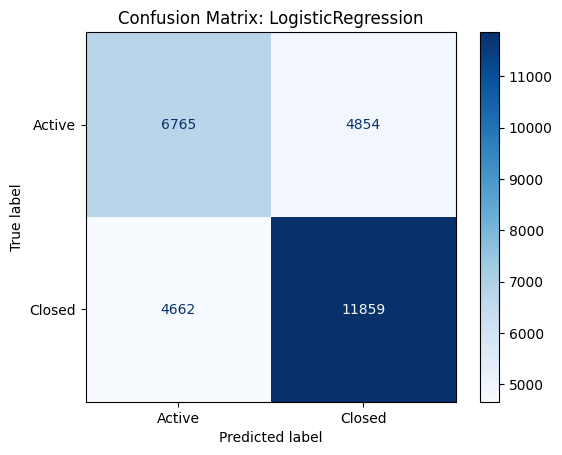


Training: RandomForest


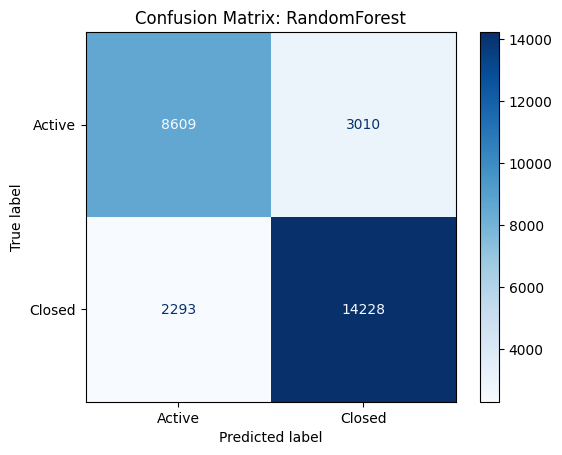


Training: GradientBoosting


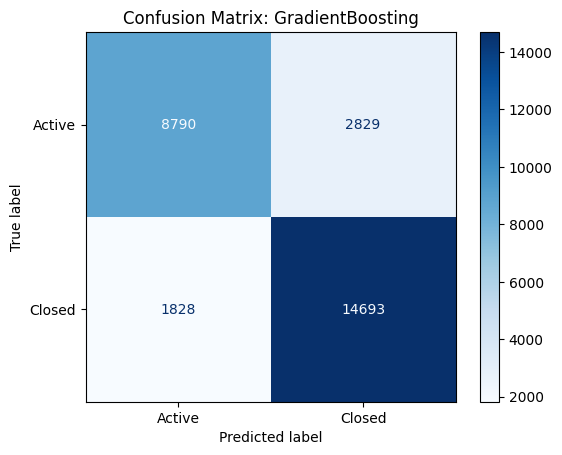


Training: XGBoost


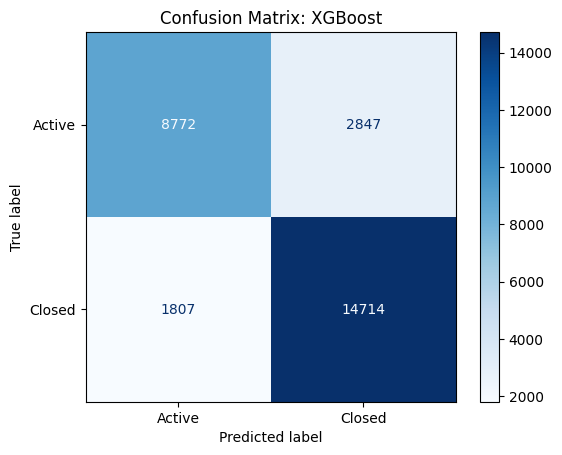


Training: LightGBM
[LightGBM] [Info] Number of positive: 66084, number of negative: 66084
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.037999 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2216
[LightGBM] [Info] Number of data points in the train set: 132168, number of used features: 58
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000


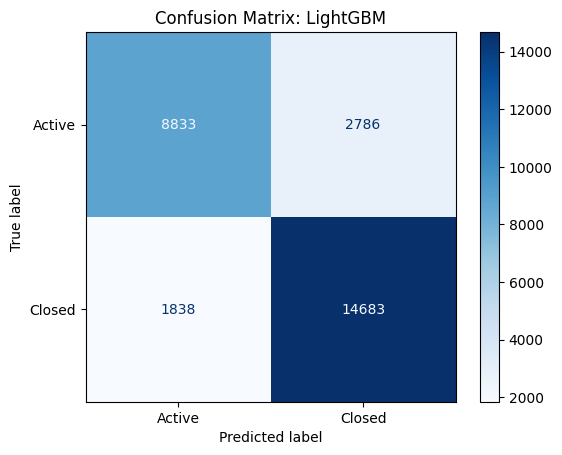

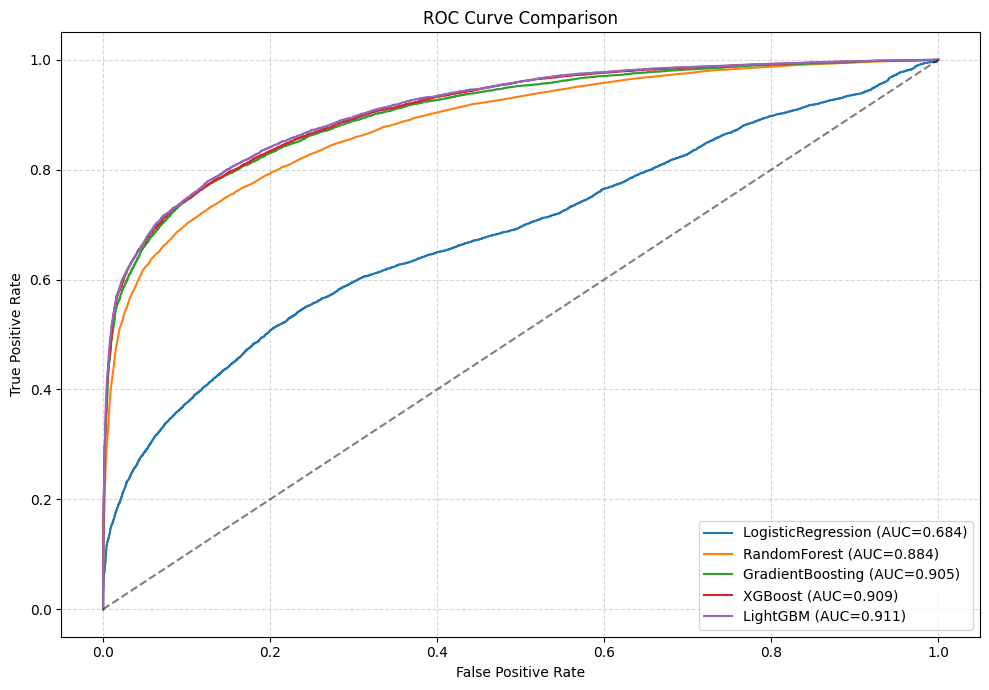

Model Comparison Summary:


,Model,Accuracy,Precision,Recall,F1,ROC_AUC
0,LightGBM,0.835679,0.827757,0.760220,0.792553,0.911295
1,XGBoost,0.834613,0.829190,0.754970,0.790341,0.908955
2,GradientBoosting,0.834506,0.827840,0.756519,0.790574,0.904714
3,RandomForest,0.811549,0.789672,0.740942,0.764531,0.884499
4,LogisticRegression,0.661834,0.592019,0.582236,0.587087,0.683970


Best model based on both Accuracy and ROC-AUC: LightGBM
Metrics:
accuracy: 0.836
precision: 0.828
recall: 0.760
f1: 0.793
roc_auc: 0.911


In [ ]:
# =======================================
# Define models and hyperparameters
# =======================================
models = {
    "LogisticRegression": LogisticRegression(max_iter=1000, random_state=42),
    "RandomForest": RandomForestClassifier(random_state=42),
    "GradientBoosting": GradientBoostingClassifier(random_state=42),
    "XGBoost": XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=42),
    "LightGBM": LGBMClassifier(random_state=42)
}

param_grids = {
    "RandomForest": {"n_estimators": [100,200], "max_depth": [5,10,None]},
    "GradientBoosting": {"n_estimators":[100,200], "learning_rate":[0.05,0.1]},
    "XGBoost": {"n_estimators":[100,200], "learning_rate":[0.05,0.1]},
    "LightGBM": {"n_estimators":[100,200], "learning_rate":[0.05,0.1]}
}

results = {}

# =======================================
# Train models with CV, evaluate, confusion matrices
# ROC curve and Models Summary
# Accuarcy will be used for best model SeLection
# Note: Accuarcy sometimes mislead so other metrics may be used
# such as ROC_AUC when imbalanced classes
# =======================================

for name, model in models.items():
    print(f"\nTraining: {name}")

    if name in param_grids:
        grid = GridSearchCV(model, param_grids[name], cv=10, scoring='accuracy',n_jobs=-1)
        grid.fit(X_train_resampled, y_train_resampled)
        best_model = grid.best_estimator_
    else:
        best_model = model
        best_model.fit(X_train_resampled, y_train_resampled)

    # Predictions
    y_pred = best_model.predict(X_test_preprocessed)
    y_prob = best_model.predict_proba(X_test_preprocessed)[:, 1]

    # Metrics
    acc = accuracy_score(y_test, y_pred)
    prec = precision_score(y_test, y_pred)
    rec = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    roc_auc = roc_auc_score(y_test, y_prob)

    results[name] = {
        "model": best_model,
        "accuracy": acc,
        "precision": prec,
        "recall": rec,
        "f1": f1,
        "roc_auc": roc_auc
    }

    # Confusion Matrix
    cm = confusion_matrix(y_test, y_pred, labels=[1,0])
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Active','Closed'])
    disp.plot(cmap='Blues')
    plt.title(f"Confusion Matrix: {name}")
    plt.show()

# =======================================
# Visual comparison: ROC curves
# =======================================

plt.figure(figsize=(10,7))
for name, res in results.items():
    y_prob = res['model'].predict_proba(X_test_preprocessed)[:,1]
    fpr, tpr, _ = roc_curve(y_test, y_prob)
    plt.plot(fpr, tpr, label=f"{name} (AUC={res['roc_auc']:.3f})")

plt.plot([0,1], [0,1], 'k--', alpha=0.5)
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve Comparison")
plt.legend()
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()

# =======================================
# Summary table of all models
# =======================================

summary_df = pd.DataFrame([
    {
        "Model": name,
        "Accuracy": res["accuracy"],
        "Precision": res["precision"],
        "Recall": res["recall"],
        "F1": res["f1"],
        "ROC_AUC": res["roc_auc"]
    }
    for name, res in results.items()
])

# Sort by Accuracy
summary_df = summary_df.sort_values(by="Accuracy", ascending=False).reset_index(drop=True)

print("Model Comparison Summary:")
display(summary_df)


# =======================================
# Select the model with BEST Accuracy AND ROC-AUC
# =======================================

# Find models that have the max accuracy
max_acc = max(res['accuracy'] for res in results.values())
best_acc_models = [name for name, res in results.items() if res['accuracy'] == max_acc]

# Among those, pick the one with highest ROC-AUC
best_model_name = max(best_acc_models, key=lambda x: results[x]['roc_auc'])
best_model_obj = results[best_model_name]['model']

print(f"Best model based on both Accuracy and ROC-AUC: {best_model_name}")
print("Metrics:")
for metric, val in results[best_model_name].items():
    if metric != "model":
        print(f"{metric}: {val:.3f}")





*  **SHAP Analysis for Model Interpretability**

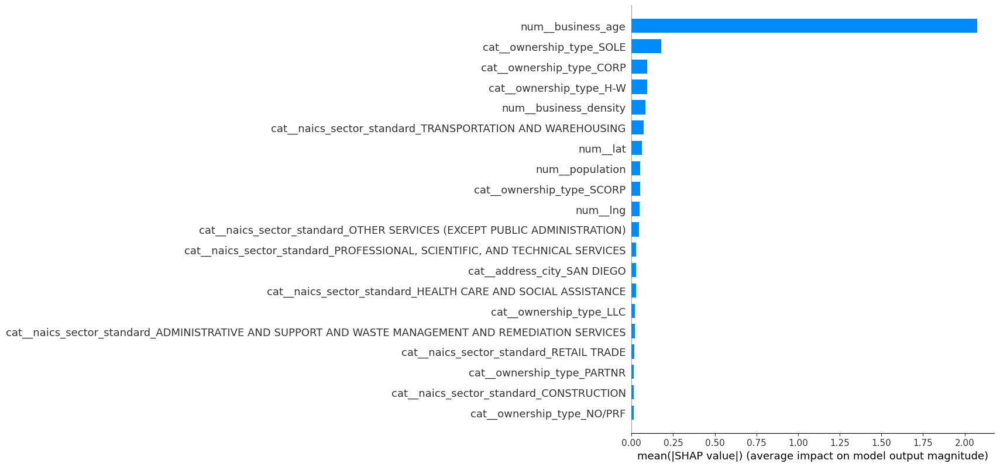

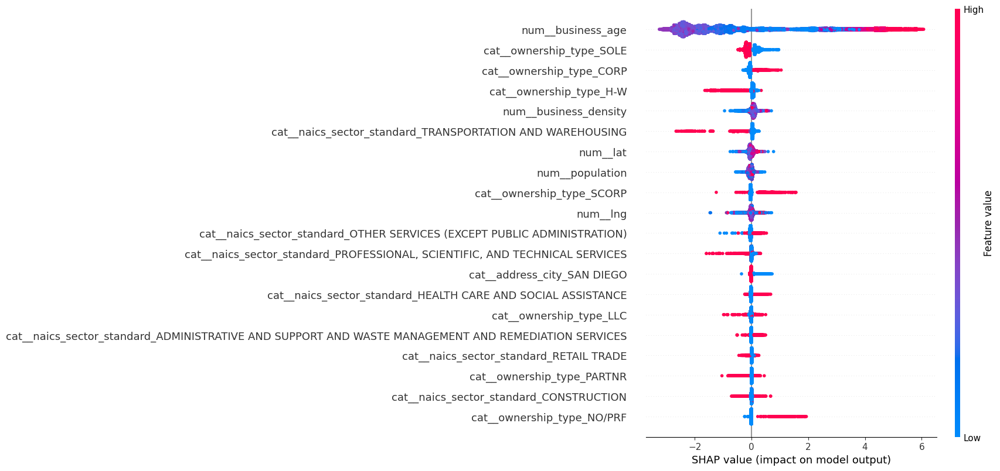

Top feature by SHAP importance: num__business_age


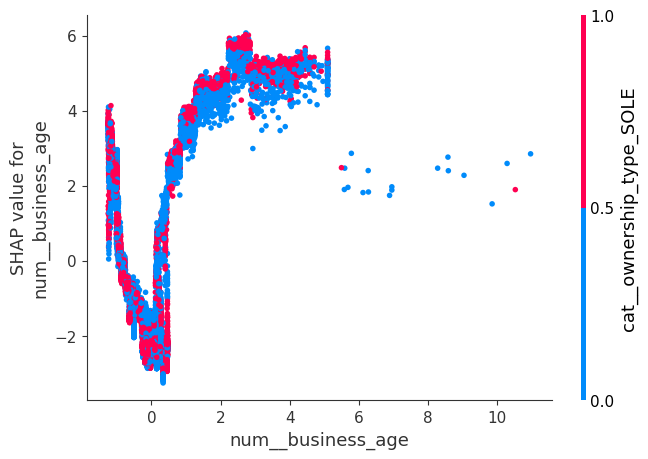

In [ ]:
# =======================================
# Get feature names after preprocessing (includes one-hot encoded features)
# =======================================

feature_names = preprocessor.get_feature_names_out()

# Determine if the best model is a tree-based model
tree_models = (RandomForestClassifier, GradientBoostingClassifier, XGBClassifier, LGBMClassifier)

if isinstance(best_model_obj, tree_models):
    explainer = shap.TreeExplainer(best_model_obj)
else:
    explainer = shap.Explainer(best_model_obj, X_train_resampled)

# Calculate SHAP values for the test set
shap_values = explainer(X_test_preprocessed)

# =======================================
# Summary bar plot (importance ranking)
# =======================================

shap.summary_plot(shap_values, X_test_preprocessed, feature_names=feature_names, plot_type='bar')

# =======================================
# Summary dot plot (importance + effect direction)
# =======================================
shap.summary_plot(shap_values, X_test_preprocessed, feature_names=feature_names)

# =======================================
# Dependence plot for top feature
# =======================================

# Identify the feature with highest mean absolute SHAP value
shap_abs_mean = np.abs(shap_values.values).mean(axis=0)
top_feature_index = np.argmax(shap_abs_mean)
top_feature_name = feature_names[top_feature_index]

print(f"Top feature by SHAP importance: {top_feature_name}")

shap.dependence_plot(top_feature_name, shap_values.values, X_test_preprocessed, feature_names=feature_names)


In [ ]:
# ===============================
# Feature names in model
# ===============================

# Print each feature name
for f in feature_names:
    print(f)

num__business_age
num__population
num__lat
num__lng
num__business_density
cat__ownership_type_CORP
cat__ownership_type_H-W
cat__ownership_type_LLC
cat__ownership_type_LP
cat__ownership_type_NO/PRF
cat__ownership_type_PARTNR
cat__ownership_type_SCORP
cat__ownership_type_SOLE
cat__ownership_type_TRUST
cat__naics_sector_standard_ACCOMMODATION AND FOOD SERVICES
cat__naics_sector_standard_ADMINISTRATIVE AND SUPPORT AND WASTE MANAGEMENT AND REMEDIATION SERVICES
cat__naics_sector_standard_AGRICULTURE, FORESTRY, FISHING AND HUNTING
cat__naics_sector_standard_ARTS, ENTERTAINMENT, AND RECREATION
cat__naics_sector_standard_CONSTRUCTION
cat__naics_sector_standard_EDUCATIONAL SERVICES
cat__naics_sector_standard_FINANCE AND INSURANCE
cat__naics_sector_standard_HEALTH CARE AND SOCIAL ASSISTANCE
cat__naics_sector_standard_INFORMATION
cat__naics_sector_standard_MANAGEMENT OF COMPANIES AND ENTERPRISES
cat__naics_sector_standard_MANUFACTURING
cat__naics_sector_standard_MINING, QUARRYING, AND OIL AND GAS 

In [ ]:
# ===============================
# Save model
# ===============================

joblib.dump(best_model_obj, "best_survival_model.pkl")
print("✅ Model exported successfully.")

✅ Model exported successfully.


* **Explore Business Survival Probabilities**

In [ ]:
# Load preprocessor and model
preprocessor = joblib.load("preprocessor.pkl")
model = joblib.load("best_survival_model.pkl")

# Drop down menu options
ownership_options = sorted([
    "H-W", "SOLE", "TRUST", "LLC", "PARTNR", "CORP", "SCORP", "LP", "NO/PRF"
])
naics_options = sorted([
    'AGRICULTURE, FORESTRY, FISHING AND HUNTING',
    'MINING, QUARRYING, AND OIL AND GAS EXTRACTION',
    'CONSTRUCTION',
    'MANUFACTURING',
    'WHOLESALE TRADE',
    'RETAIL TRADE',
    'TRANSPORTATION AND WAREHOUSING',
    'INFORMATION',
    'FINANCE AND INSURANCE',
    'REAL ESTATE AND RENTAL AND LEASING',
    'PROFESSIONAL, SCIENTIFIC, AND TECHNICAL SERVICES',
    'MANAGEMENT OF COMPANIES AND ENTERPRISES',
    'ADMINISTRATIVE AND SUPPORT AND WASTE MANAGEMENT AND REMEDIATION SERVICES',
    'EDUCATIONAL SERVICES',
    'HEALTH CARE AND SOCIAL ASSISTANCE',
    'ARTS, ENTERTAINMENT, AND RECREATION',
    'ACCOMMODATION AND FOOD SERVICES',
    'OTHER SERVICES (EXCEPT PUBLIC ADMINISTRATION)'
])
city_options = sorted( [
    "SAN DIEGO", "LA JOLLA", "CHULA VISTA", "EL CAJON", "PINE VALLEY", "ESCONDIDO",
    "NATIONAL CITY", "SANTEE", "POWAY", "CARLSBAD", "OCEANSIDE", "DEL MAR",
    "ENCINITAS", "RAMONA", "BONITA", "IMPERIAL BEACH", "FALLBROOK", "ALPINE",
    "SOLANA BEACH", "CORONADO", "JAMUL", "VALLEY CENTER", "CARDIFF-BY-THE-SEA",
    "RANCHO SANTA FE", "CAMPO", "BONSALL", "TECATE", "JULIAN", "DESCANSO",
    "BOULEVARD", "BORREGO SPRINGS", "SANTA YSABEL", "PAUMA VALLEY", "POTRERO",
    "JACUMBA", "RANCHITA", "LEUCADIA", "PALA", "ELFIN FOREST", "WARNER SPRINGS",
    "GUATAY", "RANCHO PENASQUITOS", "MOUNT LAGUNA"
])


# Widget layout: widen for full label visibility
layout_wide = widgets.Layout(width='400px')  # total width of widget
label_width = '120px'  # width of label

business_age = widgets.IntText(description="Business Age:", value=5,
                               layout=layout_wide, style={'description_width': label_width})
population = widgets.IntText(description="Population:", value=30939,
                             layout=layout_wide, style={'description_width': label_width})
lat = widgets.FloatText(description="Latitude:", value=32.8062,
                        layout=layout_wide, style={'description_width': label_width})
lng = widgets.FloatText(description="Longitude:", value=-117.1205,
                        layout=layout_wide, style={'description_width': label_width})
business_density = widgets.FloatText(description="Business Density:", value=122.3698,
                                     layout=layout_wide, style={'description_width': label_width})

ownership_type = widgets.Dropdown(options=ownership_options, description="Ownership Type:",
                                  layout=layout_wide, style={'description_width': label_width})
naics_sector_standard = widgets.Dropdown(options=naics_options, description="NAICS Sector:",
                                         layout=layout_wide, style={'description_width': label_width})
address_city = widgets.Dropdown(options=city_options, description="City:",
                                layout=layout_wide, style={'description_width': label_width})

predict_button = widgets.Button(description="Predict", layout=widgets.Layout(width='150px'))

# Display widgets
input_widgets = widgets.VBox([
    business_age, population, lat, lng,
    business_density, ownership_type,
    naics_sector_standard, address_city,
    predict_button
])
display(input_widgets)

# Output area
output = widgets.Output()
display(output)

# Prediction handler
def predict_handler(b):
    with output:
        clear_output()
        sample_input = pd.DataFrame([{
            "business_age": business_age.value,
            "population": population.value,
            "lat": lat.value,
            "lng": lng.value,
            "business_density": business_density.value,
            "ownership_type": ownership_type.value,
            "naics_sector_standard": naics_sector_standard.value,
            "address_city": address_city.value
        }])
        X = preprocessor.transform(sample_input)
        X_transformed = pd.DataFrame(X, columns=preprocessor.get_feature_names_out())
        pred = model.predict_proba(X_transformed)
        result = pd.DataFrame({
            "Failure": pred[:, 0],
            "Success": pred[:, 1]
        })
        display(result)

predict_button.on_click(predict_handler)


Output()

# **Clustering**



---



# **K-Prototype**

*  **Elbow Plot**

Training K=2 on sample ...
Training K=3 on sample ...
Training K=4 on sample ...
Training K=5 on sample ...
Training K=6 on sample ...
Training K=7 on sample ...
Training K=8 on sample ...
Training K=9 on sample ...


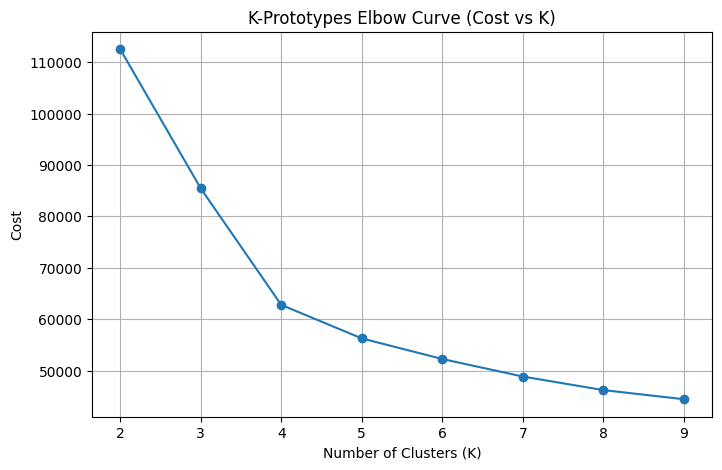

In [ ]:
# ===============================
# K-PROTOTYPES CLUSTERING
# ===============================


# Define features for K-Prototypes
features_num = ['business_age', 'population', 'business_density']
features_cat = ['naics_sector_standard', 'ownership_type']

# Numeric scaling
X_num = model_df_sd[features_num].copy()
scaler = StandardScaler()
X_num_scaled = scaler.fit_transform(X_num)

# Categorical as string
X_cat = model_df_sd[features_cat].astype(str)

# Combined for K-Prototypes
X_combined = np.hstack([X_num_scaled, X_cat.values])
cat_idx = list(range(X_num.shape[1], X_num.shape[1] + X_cat.shape[1]))

# ===============================
# K-Prototypes: Elbow method (sampled for speed)
# ===============================
costs = []
K_range = range(2, 10)

sample_frac = 0.3
sample_idx = np.random.choice(len(X_combined), int(len(X_combined)*sample_frac), replace=False)
X_sample = X_combined[sample_idx]

for k in K_range:
    print(f"Training K={k} on sample ...")
    kproto = KPrototypes(n_clusters=k, init='Cao', random_state=42)
    kproto.fit_predict(X_sample, categorical=cat_idx)
    costs.append(kproto.cost_)

plt.figure(figsize=(8,5))
plt.plot(K_range, costs, marker='o')
plt.title("K-Prototypes Elbow Curve (Cost vs K)")
plt.xlabel("Number of Clusters (K)")
plt.ylabel("Cost")
plt.grid(True)
plt.show()


*  **Final K-Prototype (Optimal K From Elbow-Method)**

In [ ]:
# ===============================
# Numeric scaling
# ===============================
X_num = model_df_sd[features_num].copy()
scaler = StandardScaler()
X_num_scaled = scaler.fit_transform(X_num)

# ===============================
# Categorical as string
# ===============================
X_cat = model_df_sd[features_cat].astype(str)

# ===============================
# Encode categorical columns for later decoding
# ===============================

X_cat_encoded = X_cat.copy()
le_dict = {}

for col in X_cat.columns:
    le = LabelEncoder()
    X_cat_encoded[col] = le.fit_transform(X_cat[col])
    le_dict[col] = le

# ===============================
# Combine numeric + categorical for K-Prototypes
# ===============================
X_combined = np.hstack([X_num_scaled, X_cat.values])
cat_idx = list(range(X_num.shape[1], X_num.shape[1] + X_cat.shape[1]))


In [ ]:
# ===============================
# Final K-Prototypes model on full dataset
# ===============================

best_k = 4  # Manual selection based on Elbow

kproto_final = KPrototypes(
    n_clusters=best_k,
    init='Cao',
    random_state=42
)

clusters = kproto_final.fit_predict(X_combined, categorical=cat_idx)
model_df_sd['kproto_cluster'] = clusters

# Numeric centroids
centroids_num = pd.DataFrame(kproto_final.cluster_centroids_[:,:len(features_num)], columns=features_num)
print("\nK-Prototypes Numeric Centroids:")
display(centroids_num)

# Interpret categorical centroids
centroids_cat = pd.DataFrame(
    kproto_final.cluster_centroids_[:, len(features_num):],
    columns=features_cat
)

# Decode categorical centroids
decoded_centroids = {}
for i, col in enumerate(features_cat):
    centroid_col = centroids_cat.iloc[:, i]

    if np.issubdtype(centroid_col.dtype, np.number):
        # Round numeric mode to nearest int, then inverse_transform
        cat_idx = np.rint(centroid_col).astype(int)
        decoded_centroids[col] = le_dict[col].inverse_transform(cat_idx)
    else:
        # Already string, keep as is
        decoded_centroids[col] = centroid_col.values

centroids_cat_decoded = pd.DataFrame(decoded_centroids)

# Combine numeric + categorical profiles
cluster_profile = pd.concat([centroids_num, centroids_cat_decoded], axis=1)

print("\nCluster Profile (Numeric + Categorical):")
display(cluster_profile)





K-Prototypes Numeric Centroids:


,business_age,population,business_density
0,2.313730672196173,-0.1814692644942723,-0.12071883872880172
1,-0.2840351252847516,-0.4177301806088,-0.047016980679555564
2,0.2562427939637484,-2.238960622139347,5.497993459445103
3,-0.2695686815306441,1.2584768243997444,-0.40647980332816186



Cluster Profile (Numeric + Categorical):


,business_age,population,business_density,naics_sector_standard,ownership_type
0,2.313730672196173,-0.1814692644942723,-0.12071883872880172,"PROFESSIONAL, SCIENTIFIC, AND TECHNICAL SERVICES",SOLE
1,-0.2840351252847516,-0.4177301806088,-0.047016980679555564,"PROFESSIONAL, SCIENTIFIC, AND TECHNICAL SERVICES",SOLE
2,0.2562427939637484,-2.238960622139347,5.497993459445103,"PROFESSIONAL, SCIENTIFIC, AND TECHNICAL SERVICES",CORP
3,-0.2695686815306441,1.2584768243997444,-0.40647980332816186,RETAIL TRADE,SOLE


*  **K-Prototype Clusters Plot**

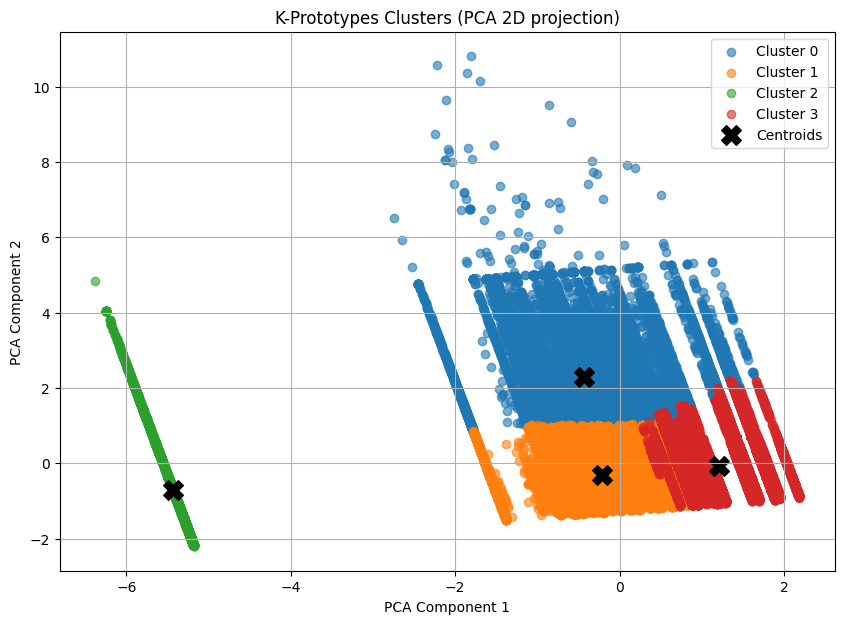

In [ ]:
# ===============================
# Visualize K-Prototypes clusters (PCA 2D)
# ===============================
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_num_scaled)
centroids_pca = pca.transform(centroids_num)

plt.figure(figsize=(10,7))
for i in range(best_k):
    plt.scatter(
        X_pca[clusters==i, 0],
        X_pca[clusters==i, 1],
        label=f'Cluster {i}',
        alpha=0.6
    )

plt.scatter(
    centroids_pca[:,0],
    centroids_pca[:,1],
    marker='X',
    s=200,
    c='black',
    label='Centroids'
)

plt.title("K-Prototypes Clusters (PCA 2D projection)")
plt.xlabel("PCA Component 1")
plt.ylabel("PCA Component 2")
plt.legend()
plt.grid(True)
plt.show()



---



#  **DBSCAN**

* **EPS Selection: Neighbors**

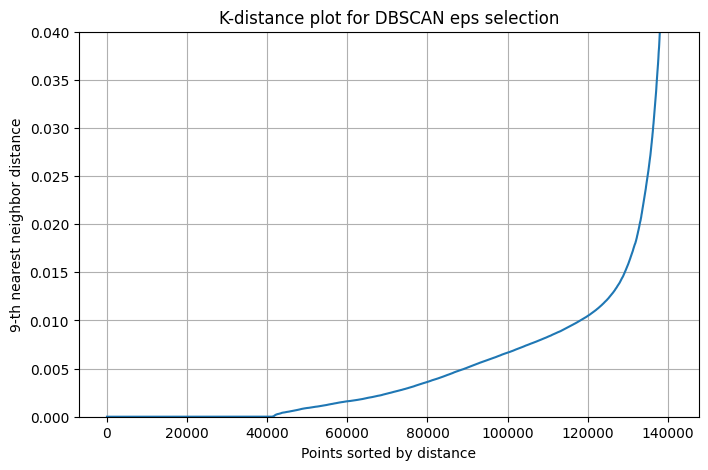

In [ ]:
# ===============================
# DBSCAN on LAT/LNG
# ===============================

# eps:The maximum distance between two points to consider them “neighbors.”
# min_samples: Minimum number of points required to form a dense region


# Use spatial features only
X_spatial = model_df_sd[['lat', 'lng']].values
X_spatial_scaled = StandardScaler().fit_transform(X_spatial)

# Min_samples
ms = 5 # rule-of-thumb starting point: min_samples (ms) >= dimensionality + 1
neighbors = NearestNeighbors(n_neighbors = ms)
neighbors_fit = neighbors.fit(X_spatial_scaled)
distances, indices = neighbors_fit.kneighbors(X_spatial_scaled)

# Distance to k-th nearest neighbor
k_distances = np.sort(distances[:, ms-1])

# Plot to visualize the "elbow"
plt.figure(figsize=(8,5))
plt.plot(k_distances)
plt.ylabel(f"{k}-th nearest neighbor distance")
plt.xlabel("Points sorted by distance")
plt.title("K-distance plot for DBSCAN eps selection")
plt.ylim(0, 0.04) # zoom y-axis to focus on elbow
plt.grid(True)
plt.show()

In [ ]:
# ===============================
# Run DBSCAN
# ===============================

dbscan_eps = 0.020  # picked from k-distance plot(a little above )
min_samples = ms

dbscan = DBSCAN(eps=dbscan_eps, min_samples=min_samples)
dbscan_clusters = dbscan.fit_predict(X_spatial_scaled)
model_df_sd['dbscan_cluster'] = dbscan_clusters

# ===============================
# Create DBSCAN cluster profile
# ===============================
dbscan_profile = model_df_sd.groupby('dbscan_cluster').agg(
    num_businesses=('lat', 'count'),
    avg_lat=('lat', 'mean'),
    avg_lng=('lng', 'mean'),
    avg_business_age=('business_age', 'mean'),
    avg_population=('population', 'mean'),
    avg_business_density=('business_density', 'mean')
).reset_index()

# Optional: show most common categorical values in each DBSCAN cluster
for col in features_cat:
    most_common = model_df_sd.groupby('dbscan_cluster')[col].agg(lambda x: x.value_counts().index[0])
    dbscan_profile[col + '_mode'] = most_common.values

print("\nDBSCAN Cluster Profile:")
display(dbscan_profile)


DBSCAN Cluster Profile:


,dbscan_cluster,num_businesses,avg_lat,avg_lng,avg_business_age,avg_population,avg_business_density,naics_sector_standard_mode,ownership_type_mode
0,-1,6042,32.963648,-117.077781,9.952722,42563.825389,19.499608,CONSTRUCTION,SOLE
1,0,453,32.806326,-117.119571,12.392159,30939.000000,124.470733,"PROFESSIONAL, SCIENTIFIC, AND TECHNICAL SERVICES",SOLE
2,1,21289,32.810257,-117.205674,10.795863,44595.292452,115.724289,"PROFESSIONAL, SCIENTIFIC, AND TECHNICAL SERVICES",SOLE
3,2,6345,32.918243,-117.122426,10.685864,61958.001734,83.863791,"PROFESSIONAL, SCIENTIFIC, AND TECHNICAL SERVICES",SOLE
4,3,51721,32.736936,-117.116331,9.730654,45569.894008,113.784095,"PROFESSIONAL, SCIENTIFIC, AND TECHNICAL SERVICES",SOLE
...,...,...,...,...,...,...,...,...,...
707,706,6,33.159581,-117.325832,4.322154,27278.000000,9.641469,EDUCATIONAL SERVICES,SOLE
708,707,5,33.142730,-117.036026,7.852156,57516.000000,4.120593,OTHER SERVICES (EXCEPT PUBLIC ADMINISTRATION),SOLE
709,708,2,32.829610,-116.972155,6.436687,60545.000000,12.842909,ADMINISTRATIVE AND SUPPORT AND WASTE MANAGEMEN...,SCORP
710,709,5,33.044236,-116.866514,10.269678,37034.000000,9.315764,RETAIL TRADE,SOLE


*  **DBSCAN Clusters Plot**

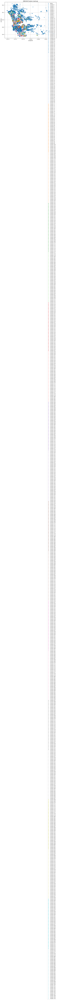

In [ ]:
# ===============================
# Visualize DBSCAN on LAT/LNG
# ===============================

plt.figure(figsize=(10,7))
unique_labels = np.unique(dbscan_clusters)
colors = plt.cm.get_cmap('tab20', len(unique_labels))

for i, label in enumerate(unique_labels):
    idx = dbscan_clusters == label
    plt.scatter(
        model_df_sd.loc[idx, 'lng'],
        model_df_sd.loc[idx, 'lat'],
        label=f'Cluster {label}' if label != -1 else 'Noise',
        alpha=0.6,
        color=colors(i)
    )

plt.title("DBSCAN Clusters (Lat/Lng)")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend()
plt.grid(True)
plt.show()


# **K-Means**

* **Elbow**

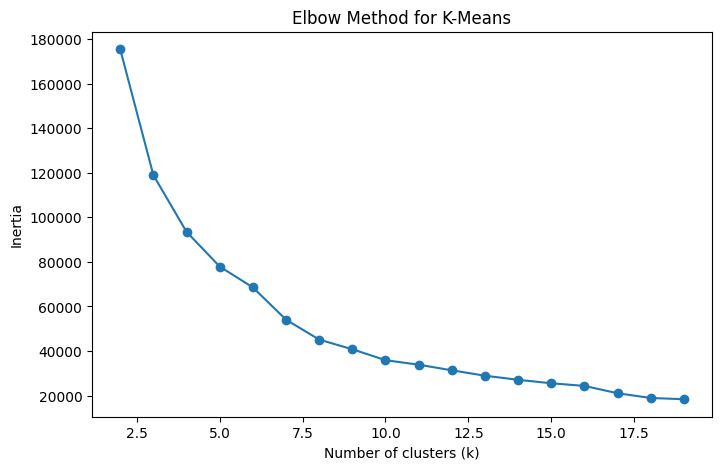

In [ ]:
# Elbow PLot

# Scale lat/lng
scaler_latlng = StandardScaler()
X_latlng_scaled = scaler_latlng.fit_transform(model_df_sd[['lat', 'lng']])

inertia = []
K_range = range(2, 20)
for k in K_range:
    km = KMeans(n_clusters=k, random_state=42)
    km.fit(X_latlng_scaled)
    inertia.append(km.inertia_)

plt.figure(figsize=(8,5))
plt.plot(K_range, inertia, 'o-')
plt.xlabel("Number of clusters (k)")
plt.ylabel("Inertia")
plt.title("Elbow Method for K-Means")
plt.show()


* **K-Means clusters**

In [ ]:
# ===============================
# K-MEANS ON LAT/LNG
# ===============================

# Parameters
k_means = 7 # from Elbow_Method

# Fit K-Means
kmeans_model = KMeans(n_clusters=k_means, random_state=42)
model_df_sd['kmeans_cluster'] = kmeans_model.fit_predict(X_latlng_scaled)

# ===============================
# Create K-Means cluster profile
# ===============================
kmeans_profile = model_df_sd.groupby('kmeans_cluster').agg(
    num_businesses=('lat', 'count'),
    avg_lat=('lat', 'mean'),
    avg_lng=('lng', 'mean'),
    avg_business_age=('business_age', 'mean'),
    avg_population=('population', 'mean'),
    avg_business_density=('business_density', 'mean')
).reset_index()

# Add categorical mode
for col in features_cat:
    most_common = model_df_sd.groupby('kmeans_cluster')[col].agg(lambda x: x.value_counts().index[0])
    kmeans_profile[col + '_mode'] = most_common.values

print("\nK-Means Cluster Profile:")
display(kmeans_profile)


K-Means Cluster Profile:


,kmeans_cluster,num_businesses,avg_lat,avg_lng,avg_business_age,avg_population,avg_business_density,naics_sector_standard_mode,ownership_type_mode
0,0,24299,32.784473,-117.225870,10.907773,38458.838183,117.211008,"PROFESSIONAL, SCIENTIFIC, AND TECHNICAL SERVICES",SOLE
1,1,5210,32.813179,-116.937504,9.398264,45766.508445,23.015867,CONSTRUCTION,SOLE
2,2,17724,32.977804,-117.098868,10.556596,52980.981663,63.078156,"PROFESSIONAL, SCIENTIFIC, AND TECHNICAL SERVICES",SOLE
3,3,16128,32.626621,-117.036985,8.818527,70433.115451,53.206446,RETAIL TRADE,SOLE
4,4,57017,32.754313,-117.125492,10.000515,43003.985162,121.950553,"PROFESSIONAL, SCIENTIFIC, AND TECHNICAL SERVICES",SOLE
5,5,2523,33.170941,-117.273037,9.049705,40635.706698,5.503203,CONSTRUCTION,SOLE
6,6,17798,32.905592,-117.200926,11.101502,45745.337397,236.197794,"PROFESSIONAL, SCIENTIFIC, AND TECHNICAL SERVICES",SOLE


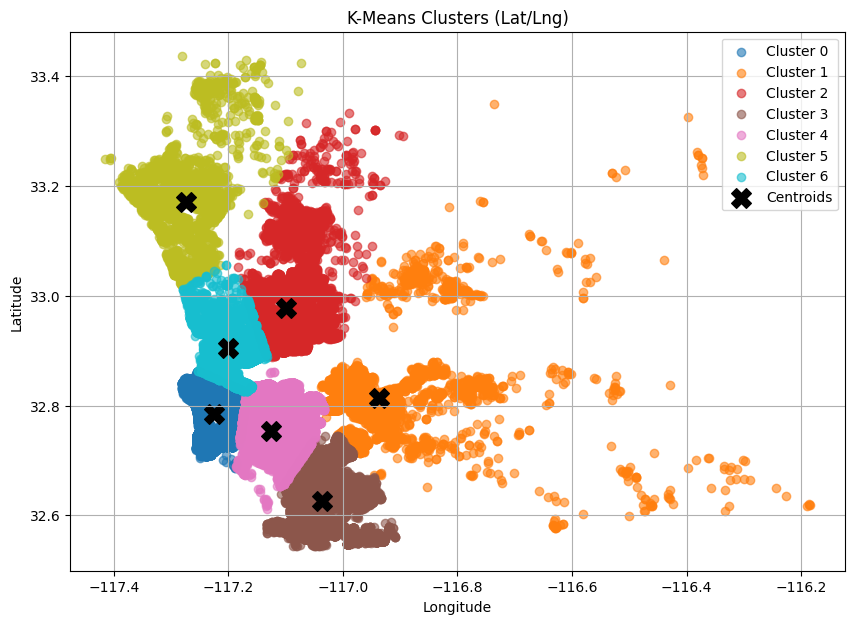

In [ ]:
# ===============================
# Plot K-Means clusters with centroids
# ===============================
centroids_scaled = kmeans_model.cluster_centers_
centroids_original = scaler_latlng.inverse_transform(centroids_scaled)

plt.figure(figsize=(10,7))
colors = plt.cm.get_cmap('tab10', k_means)

for i in range(k_means):
    idx = model_df_sd['kmeans_cluster'] == i
    plt.scatter(
        model_df_sd.loc[idx,'lng'],
        model_df_sd.loc[idx,'lat'],
        label=f'Cluster {i}',
        alpha=0.6,
        color=colors(i)
    )

# Plot centroids
plt.scatter(
    centroids_original[:,1],  # lng
    centroids_original[:,0],  # lat
    marker='X',
    s=200,
    c='black',
    label='Centroids'
)

plt.title("K-Means Clusters (Lat/Lng)")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend()
plt.grid(True)
plt.show()

# **Tableau**

In [ ]:
# Inspect Actual DF
model_df_sd.columns

Index(['ownership_type', 'date_business_start', 'address_city',
       'address_state', 'lat', 'lng', 'zip5', 'population',
       'naics_sector_standard', 'business_status', 'raw_business_start',
       'business_start_year', 'business_age', 'business_status_num',
       'age_rounded', 'age_group', 'business_density', 'kproto_cluster',
       'dbscan_cluster', 'kmeans_cluster'],
      dtype='object')

In [ ]:
# Drop DBSCAN cluster column
model_df_sd = model_df_sd.drop(columns=['dbscan_cluster'])

# Check
model_df_sd.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 140699 entries, 0 to 140698
Data columns (total 19 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   ownership_type         140699 non-null  object 
 1   date_business_start    140699 non-null  object 
 2   address_city           140699 non-null  object 
 3   address_state          140699 non-null  object 
 4   lat                    140699 non-null  float64
 5   lng                    140699 non-null  float64
 6   zip5                   140699 non-null  int64  
 7   population             140699 non-null  float64
 8   naics_sector_standard  140699 non-null  object 
 9   business_status        140699 non-null  object 
 10  raw_business_start     140699 non-null  object 
 11  business_start_year    140699 non-null  int64  
 12  business_age           140699 non-null  float64
 13  business_status_num    140699 non-null  int64  
 14  age_rounded            140699 non-nu

In [ ]:
# Export dataframe for Tableau: Clusters added to df
model_df_sd.to_csv("Tableau_San_Diego_Business.csv", index=False)

# Ensure age_group is string
model_df_sd['age_group'] = model_df_sd['age_group'].astype(str)

# Replace hyphen with text-safe version (en dash or " to ")
model_df_sd['age_group'] = model_df_sd['age_group'].str.replace('-', ' to ', regex=False)

print("✅ San_Diego_Business dataset for Tableau saved as 'Tableau_San_Diego_Business.csv'")

✅ San_Diego_Business dataset for Tableau saved as 'Tableau_San_Diego_Business.csv'


#  **Interactive HeatMap**

In [ ]:
# ======================================================
# FOLIUM DASHBOARD: SAN DIEGO CLUSTERS WITH TOGGLES & LEGENDS
# ======================================================

# ==========================
# Use filtered San Diego dataset
# ==========================
df_map = model_df_sd.copy()

# ==========================
# Base map
# ==========================
m_dashboard = folium.Map(
    location=[df_map['lat'].median(), df_map['lng'].median()],
    zoom_start=10
    )

# ==========================
# K-Means Layers
# ==========================

# Active HeatMap (based on 'target')
fg_active = folium.FeatureGroup(name="K-Means Active HeatMap")
HeatMap(
    list(zip(df_map[df_map[target]==1]['lat'], df_map[df_map[target]==1]['lng'])),
    radius=10, blur=15,
    gradient={0.2: 'lightgreen', 0.4:'green', 0.6:'darkgreen', 0.8:'forestgreen', 1:'darkolivegreen'}
).add_to(fg_active)
fg_active.add_to(m_dashboard)

# Closed HeatMap
fg_closed = folium.FeatureGroup(name="K-Means Closed HeatMap")
HeatMap(
    list(zip(df_map[df_map[target]==0]['lat'], df_map[df_map[target]==0]['lng'])),
    radius=10, blur=15,
    gradient={0.2: '#ffcccc', 0.4:'#ff6666', 0.6:'#ff0000', 0.8:'#b30000', 1:'#800000'}
).add_to(fg_closed)
fg_closed.add_to(m_dashboard)

# Mini legend for K-Means HeatMaps
legend_kmeans = """
<div style="position: fixed; top: 70px; left: 10px; width: 150px; height: 70px;
background-color: white; z-index:9999; font-size:14px; border:2px solid grey; padding:5px;">
<b>K-Means HeatMap:</b><br>
<span style="color:green">&#9679;</span> Active<br>
<span style="color:red">&#9679;</span> Closed
</div>
"""
m_dashboard.get_root().html.add_child(folium.Element(legend_kmeans))

# K-Means Active % markers
fg_kmeans_pct = folium.FeatureGroup(name="K-Means Cluster Status %")
cluster_active_pct = df_map.groupby('kmeans_cluster')[target].mean() * 100

for cluster in df_map['kmeans_cluster'].unique():
    cluster_df = df_map[df_map['kmeans_cluster']==cluster]
    lat_mean = cluster_df['lat'].mean()
    lng_mean = cluster_df['lng'].mean()
    active_pct = cluster_active_pct.loc[cluster]

    folium.CircleMarker(
        location=[lat_mean, lng_mean],
        radius=10,
        popup=f"K-Means Cluster {cluster}: {active_pct:.1f}% Active",
        color='green' if active_pct >= 50 else 'red',
        fill=True,
        fill_opacity=0.6
    ).add_to(fg_kmeans_pct)

fg_kmeans_pct.add_to(m_dashboard)


# ==========================
# K-Prototypes Centroids
# ==========================

kproto_centroids = df_map.groupby('kproto_cluster')[['lat','lng'] + features_num].mean().reset_index()
fg_kproto_centroids = folium.FeatureGroup(name="K-Prototypes Centroids")
for _, row in kproto_centroids.iterrows():
    folium.Marker(
        location=[row['lat'], row['lng']],
        popup=f"K-Prototypes Cluster {int(row['kproto_cluster'])}",
        icon=folium.Icon(color='blue', icon='info-sign')
    ).add_to(fg_kproto_centroids)
fg_kproto_centroids.add_to(m_dashboard)


# ==========================
# K-Prototypes Numeric Features with Colors
# ==========================

feature_colors = {
    'business_age': linear.YlOrRd_09,
    'population': linear.Blues_09,
    'business_density': linear.Purples_09
}

feature_positions = {
    'business_age': 150,
    'population': 220,
    'business_density': 290
}

for feature in features_num:
    fg_feature = folium.FeatureGroup(name=f"K-Prototypes {feature} Avg")
    min_val, max_val = kproto_centroids[feature].min(), kproto_centroids[feature].max()
    colormap = feature_colors[feature].scale(min_val, max_val)

    # Add mini legend with gradient colors
    legend_html = f"""
    <div style="position: fixed; top: {feature_positions[feature]}px; left: 10px; width: 200px; height: 70px;
    background-color: white; z-index:9999; font-size:14px; border:2px solid grey; padding:5px;">
    <b>{feature.replace('_',' ').title()}:</b><br>
    <div style="background: linear-gradient(to right, {colormap(min_val)}, {colormap(max_val)});
         height: 20px; width: 100%; margin-bottom:3px;"></div>
    <span style="float:left;">{round(min_val,1)}</span>
    <span style="float:right;">{round(max_val,1)}</span>
    </div>
    """
    m_dashboard.get_root().html.add_child(folium.Element(legend_html))

    for _, row in kproto_centroids.iterrows():
        color = colormap(row[feature])
        folium.CircleMarker(
            location=[row['lat'], row['lng']],
            radius=15,
            popup=f"Cluster {int(row['kproto_cluster'])}: {feature}={row[feature]:.2f}",
            color=color,
            fill=True,
            fill_opacity=0.7
        ).add_to(fg_feature)

    fg_feature.add_to(m_dashboard)

# ==========================
# Layer control
# ==========================
folium.LayerControl(collapsed=False).add_to(m_dashboard)

# ==========================
# Save and display
# ==========================
m_dashboard.save("Interactive_Cluster_Dashboard.html")
m_dashboard


**`END`**